In [1]:
import pandas as pd 
import matplotlib.pyplot as plt
import datetime as dt 
import seaborn as sns
import osmnx as ox
from collections import defaultdict
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
from sklearn.metrics.pairwise import cosine_similarity
import folium
from prophet import Prophet
from sklearn.metrics import mean_squared_error, mean_absolute_error
from statistics import mean
import matplotlib.dates as mdates


In [2]:
df = pd.read_csv('/Users/mariu/Desktop/Masterarbeit/archive/data_start.csv')

In [3]:

# 1. Datenvorbereitung: Auswahl der relevanten Spalten
relevant_columns = ['start_station_id', 'cluster']

# 2. Häufigkeitsanalyse
# Zählen Sie, wie oft jede Station in jedem Cluster als Start- oder Endstation auftritt
station_counts = df[relevant_columns].melt(id_vars=['cluster'], value_name='station').groupby(['cluster', 'station']).size().reset_index(name='count')

# Sortieren der Daten für Pareto-Analyse
station_counts = station_counts.sort_values(['cluster', 'count'], ascending=[True, False])

# 3. Pareto-Analyse: Ermittlung der kumulativen Prozentzahl und Auswahl der wichtigsten Stationen pro Cluster
station_counts['cumulative_percentage'] = station_counts.groupby('cluster')['count'].apply(lambda x: x.cumsum() / x.sum() * 100)

# Identifizierung der wichtigsten Stationen (z.B. top 20%)
threshold = 40
important_stations = station_counts[station_counts.groupby('cluster')['cumulative_percentage'].apply(lambda x: x <= threshold)]

print(important_stations)

     cluster       station  count  cumulative_percentage
98         0        WL-012  21208               3.064408
4          0         13016  20311               5.999205
1          0         13001  19673               8.841816
24         0         13430  19155              11.609580
3          0         13011  18879              14.337463
..       ...           ...    ...                    ...
492        3         13379   9595              34.150247
607        3  TA1308000029   9431              35.507118
600        3  TA1307000124   9096              36.815792
472        3         13196   9053              38.118278
463        3         13132   7915              39.257037

[79 rows x 4 columns]


/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_1372/2573352830.py:12: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  station_counts['cumulative_percentage'] = station_counts.groupby('cluster')['count'].apply(lambda x: x.cumsum() / x.sum() * 100)
/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_1372/2573352830.py:16: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt t

In [211]:
import folium

# Erstelle eine Karte, zentriert um einen mittleren Punkt deiner Daten
m = folium.Map(location=[41.881832, -87.623177], zoom_start=11)

# Berechne die durchschnittlichen Koordinaten für jede Station
station_coords = df[['start_station_id', 'start_lat', 'start_lng']].groupby('start_station_id').mean()

# Füge Marker für wichtige Stationen hinzu
for idx, row in important_stations.iterrows():
    station_id = row['station']
    if station_id in station_coords.index:
        lat, lng = station_coords.loc[station_id]
        folium.Marker([lat, lng], tooltip=f'Station {station_id}, Cluster {row["cluster"]}, Counts: {row["count"]}').add_to(m)

# Zeige die Karte an
m


In [4]:
# Zählen der einzigartigen wichtigen Stationen in jedem Cluster
important_station_counts_per_cluster = important_stations.groupby('cluster')['station'].nunique()

print(important_station_counts_per_cluster)


cluster
0    17
1     5
2    36
3    21
Name: station, dtype: int64


In [191]:
important_stations.shape

(79, 4)

In [6]:


# Annahme: 'hourly_forecasts' ist das Dictionary mit den Prophet-Vorhersagen für jede wichtige Station
# Identifizierung der wichtigsten Stationen basierend auf der Pareto-Analyse (z.B. top 20%)
threshold = 20
important_stations_df = station_counts[station_counts.groupby('cluster')['cumulative_percentage'].apply(lambda x: x <= threshold)]

# Extrahieren der eindeutigen Stationen-IDs als Liste
important_station_ids = important_stations_df['station'].unique()

# Annahme: df ist bereits vorbereitet und enthält 'start_station_id' und 'started_at'
df['started_at'] = pd.to_datetime(df['started_at'])
df['hour'] = df['started_at'].dt.hour
df['weekday'] = df['started_at'].dt.dayofweek

# Identifizierung der wichtigen Stationen (basierend auf Ihrer vorherigen Pareto-Analyse)
important_stations = important_station_ids

hourly_forecasts = {}
for station_id in important_stations:
    station_data = df[df['start_station_id'] == station_id]

    # Aggregation der Daten auf stündlicher Basis
    hourly_data = station_data.resample('H', on='started_at').count()['ride_id'].reset_index(name='y')
    hourly_data.rename(columns={'started_at': 'ds'}, inplace=True)

    model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
    model.fit(hourly_data[['ds', 'y']])

    # Erstelle zukünftige Datenreihe für die Vorhersagen (für die nächsten 7 Tage)
    future = model.make_future_dataframe(periods=168, freq='H')  # 7 Tage * 24 Stunden = 168 Stunden
    forecast = model.predict(future)

    # Extrahiere die Vorhersagen für die benötigte Zeitspanne
    hourly_forecasts[station_id] = forecast[['ds', 'yhat']][-168:]

# 'hourly_forecasts' enthält nun die stündlichen Vorhersagen für die nächsten 7 Tage für jede wichtige Station



/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_1559/524575755.py:4: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  important_stations_df = station_counts[station_counts.groupby('cluster')['cumulative_percentage'].apply(lambda x: x <= threshold)]
10:28:22 - cmdstanpy - INFO - Chain [1] start processing
10:28:23 - cmdstanpy - INFO - Chain [1] done processing
10:28:25 - cmdstanpy - INFO - Chain [1] start processing
10:28:25 - cmdstanpy - INFO - Chain [1] done processing
10:28:27 - cmdstanpy - INFO - Chain [1] start processing
10:28:27 - cmdstanpy - INFO - Chain [1] done processing
10:28:29 - cmdstanpy - INFO - Chain [1] start proces

In [5]:
df = df.copy()
df['started_at'] = pd.to_datetime(df['started_at'])
df['hour'] = df['started_at'].dt.hour
df['weekday'] = df['started_at'].dt.dayofweek
df['weekday_hour'] = df['weekday'].astype(str) + "_" + df['hour'].astype(str).str.zfill(2)
threshold = 40
important_stations_df = station_counts[station_counts.groupby('cluster')['cumulative_percentage'].apply(lambda x: x <= threshold)]

# Extrahieren der eindeutigen Stationen-IDs als Liste
important_station_ids = important_stations_df['station'].unique()
for station_id in important_stations:
    station_data = df[df['start_station_id'] == station_id]

    # Aggregation der Daten auf stündlicher Basis und Vorbereitung der Zeitreihen-Daten
    hourly_data = station_data.resample('H', on='started_at').count()['ride_id'].reset_index(name='y')
    hourly_data.rename(columns={'started_at': 'ds'}, inplace=True)

    # Aufteilen der Daten in Trainings- und Testdatensätze
    test_size = 168  # 7 Tage * 24 Stunden
    train_data = hourly_data[:-test_size]
    test_data = hourly_data[-test_size:]

    # Trainieren des Prophet-Modells mit dem Trainingsdatensatz
    model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
    model.fit(train_data)

    # Vorhersage für den Zeitraum des Testdatensatzes
    future = model.make_future_dataframe(periods=test_size, freq='H')
    forecast = model.predict(future)

    # Vorhersagewerte anpassen, um negative Zahlen zu verhindern
    forecast['yhat'] = forecast['yhat'].clip(lower=0)

    # Extrahiere die angepassten Vorhersagen und die tatsächlichen Werte für den Vergleich
    forecasted_values = forecast['yhat'][-test_size:]
    actual_values = test_data['y']

    # Berechnung der Fehlermetriken
    mse = mean_squared_error(actual_values, forecasted_values)
    mae = mean_absolute_error(actual_values, forecasted_values)
    print(f"Station {station_id} - MSE: {mse}, MAE: {mae}")

    # Erstellen des Schaubilds für den Vergleich
    plt.figure(figsize=(12, 6))
    plt.plot(test_data['ds'], actual_values, label='Echte Daten')
    plt.plot(test_data['ds'], forecasted_values, label='Vorhersagen')
    plt.title(f"Vergleich der echten und vorhergesagten Fahrtenanzahl für Station {station_id}")
    plt.xlabel('Datum und Uhrzeit')
    plt.ylabel('Anzahl der Fahrten')
    plt.legend()
    plt.show()


/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_1372/4289076845.py:7: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  important_stations_df = station_counts[station_counts.groupby('cluster')['cumulative_percentage'].apply(lambda x: x <= threshold)]


AttributeError: 'Int64Index' object has no attribute '_with_freq'

In [8]:
# Sicherstellen, dass 'started_at' im richtigen Datumsformat ist und als Index gesetzt wird
df['started_at'] = pd.to_datetime(df['started_at'])
df.set_index('started_at', inplace=True)

# Resample und zähle Fahrten stündlich
actual_hourly_data = df.resample('H').agg({'start_station_id': 'first', 'ride_id': 'count'}).reset_index()
actual_hourly_data.rename(columns={'ride_id': 'y'}, inplace=True)

# Überprüfe den neuen DataFrame
print(actual_hourly_data.head())

           started_at start_station_id    y
0 2022-05-01 00:00:00     TA1309000033  222
1 2022-05-01 01:00:00            13144  131
2 2022-05-01 02:00:00              RN-  137
3 2022-05-01 03:00:00           SL-013   50
4 2022-05-01 04:00:00            13278   23


In [10]:
# Erstellen des Demand Patterns für jedes Cluster
demand_patterns = {}
for cluster_id in df['cluster'].unique():
    cluster_data = df[df['cluster'] == cluster_id]
    hourly_counts = cluster_data.groupby(['weekday', 'hour']).size()
    total_rides = hourly_counts.sum()
    demand_pattern = hourly_counts / total_rides
    demand_patterns[cluster_id] = demand_pattern


In [196]:
df.reset_index(inplace=True)
# Daten vorbereiten
df['started_at'] = pd.to_datetime(df['started_at'])
df.set_index('started_at', inplace=True)

# Annahme: demand_patterns ist bereits für jedes Cluster berechnet
# Beispiel für ein demand_pattern, das für jedes Cluster erstellt wird
# demand_patterns = {cluster_id: {(weekday, hour): proportion, ...}, ...}

# Vorbereitung für das Forecasting und die Darstellung
station_forecasts = {}
evaluation_results = {}

for station_id in important_station_ids:
    station_data = df[df['start_station_id'] == station_id]
    
    # Aggregation der Daten auf Wochenbasis
    weekly_data = station_data.resample('W').count()['ride_id'].reset_index(name='y')
    weekly_data.rename(columns={'started_at': 'ds'}, inplace=True)

    # Training und Vorhersage mit Prophet
    if len(weekly_data) > 4:  # Sicherstellen, dass genügend Daten vorhanden sind
        train_data = weekly_data[:-1]
        test_data = weekly_data[-1:]

        model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
        model.fit(train_data[['ds', 'y']])
        future = model.make_future_dataframe(periods=1, freq='W')
        forecast = model.predict(future)

        # Anwendung des demand_patterns, um stündliche Vorhersagen zu erhalten
        last_week_forecast = forecast.iloc[-1]['yhat']  # Vorhersage der letzten Woche
        cluster_id = df[df['start_station_id'] == station_id]['cluster'].iloc[0]
        hourly_proportions = demand_patterns[cluster_id]
        
        detailed_forecasts = {}
        for (weekday, hour), proportion in hourly_proportions.items():
            forecast_value = last_week_forecast * proportion
            detailed_forecasts[(weekday, hour)] = forecast_value

        # Berechnung der stündlichen tatsächlichen Werte für die letzte Woche
        last_week_actuals = station_data.last('1W').resample('H').count()['ride_id']
        last_week_actuals.index = last_week_actuals.index.map(lambda dt: (dt.weekday(), dt.hour))

        # Berechnung der Fehlermetriken
        mse = mean_squared_error(last_week_actuals, pd.Series(detailed_forecasts, index=last_week_actuals.index))
        mae = mean_absolute_error(last_week_actuals, pd.Series(detailed_forecasts, index=last_week_actuals.index))
        evaluation_results[station_id] = {'MSE': mse, 'MAE': mae}

                # Umwandeln des Tupel-Index in einen String für das Plotten
        # Umwandeln des Tupel-Index in einen String für das Plotten
        last_week_actuals.index = [f"{day}-{hour}" for day, hour in last_week_actuals.index]
        detailed_forecasts_series = pd.Series(detailed_forecasts)
        detailed_forecasts_series.index = [f"{day}-{hour}" for (day, hour) in detailed_forecasts_series.index]

        plt.figure(figsize=(14, 7))
        plt.plot(last_week_actuals.index, last_week_actuals.values, label='Tatsächliche Fahrten', marker='o')
        plt.plot(detailed_forecasts_series.index, detailed_forecasts_series.values, label='Vorhergesagte Fahrten', marker='x')

        plt.title(f'Vergleich der tatsächlichen und vorhergesagten Fahrtenanzahl für Station {station_id}')
        plt.xlabel('Wochentag-Stunde')
        plt.ylabel('Anzahl der Fahrten')
        plt.xticks(rotation=90)  # Drehen Sie die X-Achsen-Beschriftungen für bessere Lesbarkeit
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    else:
        print(f"Nicht genügend Daten für Station {station_id} zur Analyse vorhanden.")

ValueError: cannot insert level_0, already exists

In [98]:
station_forecasts

{'WL-012': {(0, 0): 0.8967890261710364,
  (0, 1): 0.4348410265438905,
  (0, 2): 0.22363252793685795,
  (0, 3): 0.14005269426348682,
  (0, 4): 0.11972246445104517,
  (0, 5): 0.6076479799496443,
  (0, 6): 2.1787229615666615,
  (0, 7): 4.599149766459019,
  (0, 8): 6.018877481694526,
  (0, 9): 3.982466128814955,
  (0, 10): 3.7554452292426905,
  (0, 11): 4.757273776111342,
  (0, 12): 5.764749609039005,
  (0, 13): 5.595331027268658,
  (0, 14): 6.37239758898865,
  (0, 15): 9.634270016673728,
  (0, 16): 16.371482285074524,
  (0, 17): 18.05324407344817,
  (0, 18): 8.82444919581147,
  (0, 19): 5.455278333005172,
  (0, 20): 3.4053134935839733,
  (0, 21): 2.646318247252819,
  (0, 22): 1.801484252824689,
  (0, 23): 1.1215510113196967,
  (1, 0): 0.4675952856861576,
  (1, 1): 0.25638678707912504,
  (1, 2): 0.10842789233302202,
  (1, 3): 0.0880976625205804,
  (1, 4): 0.0790620048261619,
  (1, 5): 0.639272781880109,
  (1, 6): 2.5582205847322386,
  (1, 7): 6.693163437140506,
  (1, 8): 9.173451474258385,

In [100]:
forecasted_values_approach1

0      2.499432
1      0.000000
2      0.000000
3      0.000000
4      0.197244
         ...   
163    2.028566
164    4.754857
165    7.087907
166    7.683198
167    6.101794
Name: yhat, Length: 168, dtype: float64

In [95]:
evaluation_results

{'WL-012': {'MSE': 17.486839578643046, 'MAE': 3.131534335434604},
 '13016': {'MSE': 9.328585167842112, 'MAE': 2.0891666972038494},
 '13001': {'MSE': 8.043464644008976, 'MAE': 2.002596059513951},
 '13430': {'MSE': 19.52294474006188, 'MAE': 3.1489531406003226},
 '13011': {'MSE': 9.604051627029216, 'MAE': 2.2795663800732253},
 'TA1305000011': {'MSE': 14.955568243092339, 'MAE': 2.7319509283170387},
 'TA1307000151': {'MSE': 7.6188289758547425, 'MAE': 1.9018397668579612},
 '15544': {'MSE': 9.419449706348077, 'MAE': 1.9699680423254997},
 '13022': {'MSE': 39.62139216258243, 'MAE': 4.613591019104242},
 '13300': {'MSE': 25.96722061310116, 'MAE': 3.622839273663365},
 '13042': {'MSE': 23.877953395372955, 'MAE': 3.335937702963071},
 'LF-005': {'MSE': 13.219663728419867, 'MAE': 2.6631450195896127},
 'TA1308000050': {'MSE': 31.691365920711497, 'MAE': 4.495422411479849},
 'TA1308000001': {'MSE': 28.800013353381946, 'MAE': 2.9316439724980046},
 '13008': {'MSE': 11.582499911860515, 'MAE': 2.365515282140

In [96]:
evaluation_results1

{'WL-012': {'MSE': 13.26021523825008, 'MAE': 2.4827001807513516},
 '13016': {'MSE': 3.4540183502048234, 'MAE': 1.2847839745272283},
 '13001': {'MSE': 2.856773538230604, 'MAE': 1.2293900575368024},
 '13430': {'MSE': 4.486766619822307, 'MAE': 1.5397281088162487},
 '13011': {'MSE': 7.09567863842317, 'MAE': 1.9012014535571768},
 'TA1305000011': {'MSE': 3.0629350627529845, 'MAE': 1.343777472894864},
 'TA1307000151': {'MSE': 4.9673568487299935, 'MAE': 1.6042656392493755},
 '15544': {'MSE': 9.2505921709811, 'MAE': 1.6411810563458982},
 '13022': {'MSE': 27.766310049840133, 'MAE': 3.3093159241145584},
 '13300': {'MSE': 12.630308135627107, 'MAE': 2.333439357068573},
 '13042': {'MSE': 10.759503195649595, 'MAE': 2.1217405060467707},
 'LF-005': {'MSE': 9.802608135598561, 'MAE': 2.05938083571419},
 'TA1308000050': {'MSE': 8.284236633775457, 'MAE': 2.1156820791597473},
 'TA1308000001': {'MSE': 6.634568127618921, 'MAE': 1.6418240592584912},
 '13008': {'MSE': 6.495250888325155, 'MAE': 1.624099973411735

13:21:08 - cmdstanpy - INFO - Chain [1] start processing
13:21:09 - cmdstanpy - INFO - Chain [1] done processing


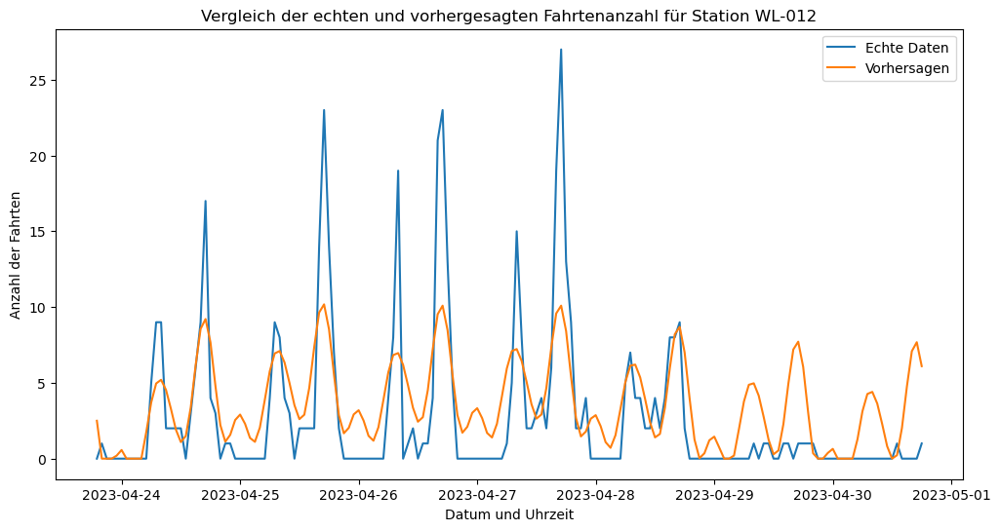

13:21:11 - cmdstanpy - INFO - Chain [1] start processing
13:21:12 - cmdstanpy - INFO - Chain [1] done processing


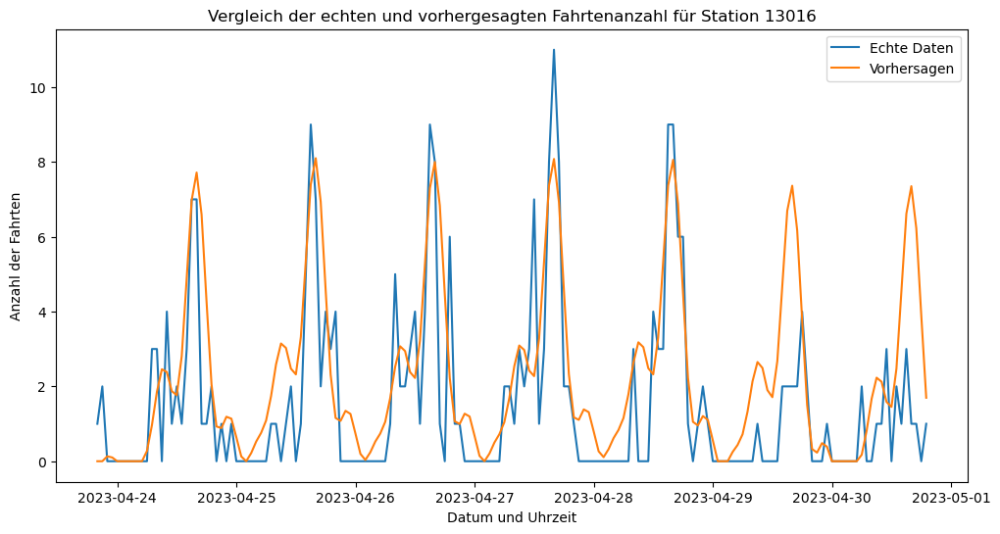

13:21:14 - cmdstanpy - INFO - Chain [1] start processing
13:21:14 - cmdstanpy - INFO - Chain [1] done processing


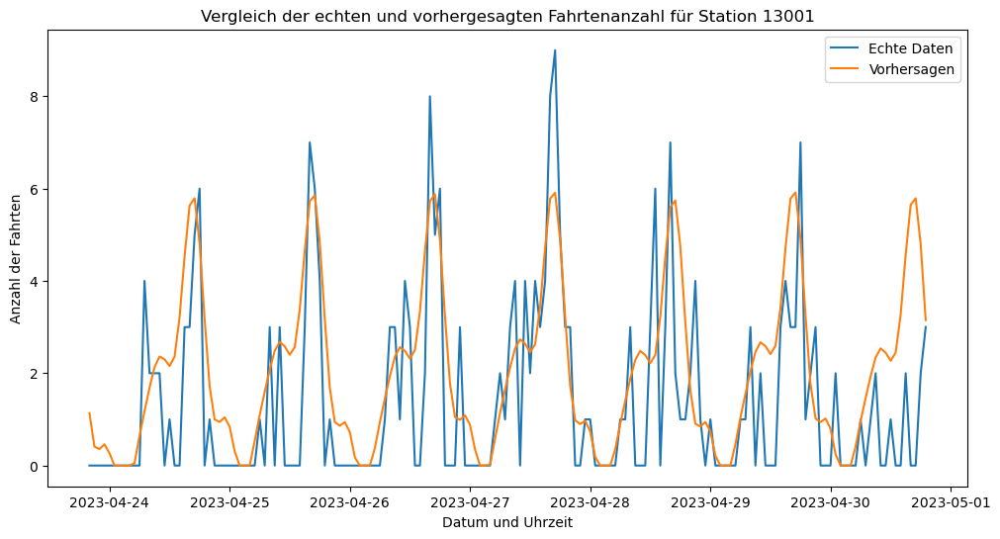

13:21:17 - cmdstanpy - INFO - Chain [1] start processing
13:21:17 - cmdstanpy - INFO - Chain [1] done processing


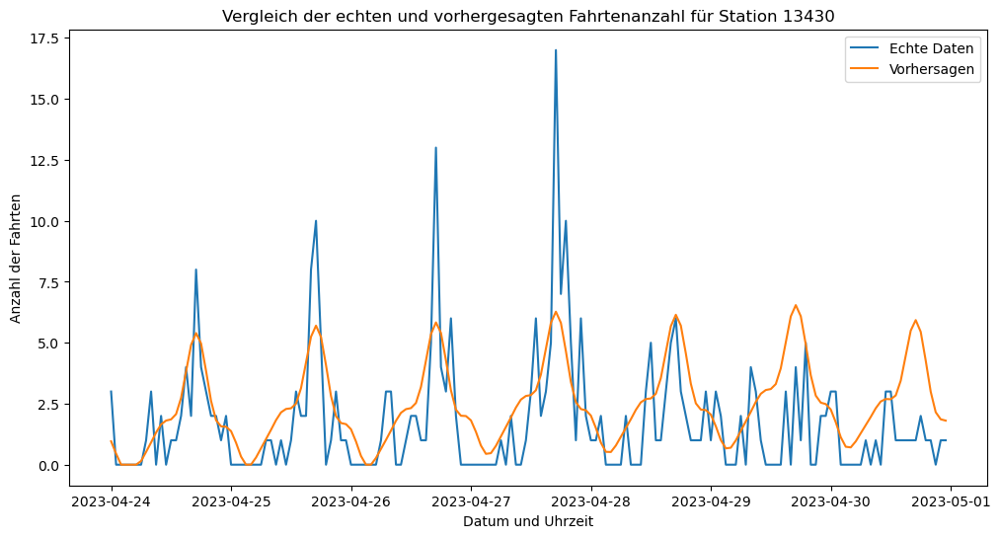

13:21:20 - cmdstanpy - INFO - Chain [1] start processing
13:21:20 - cmdstanpy - INFO - Chain [1] done processing


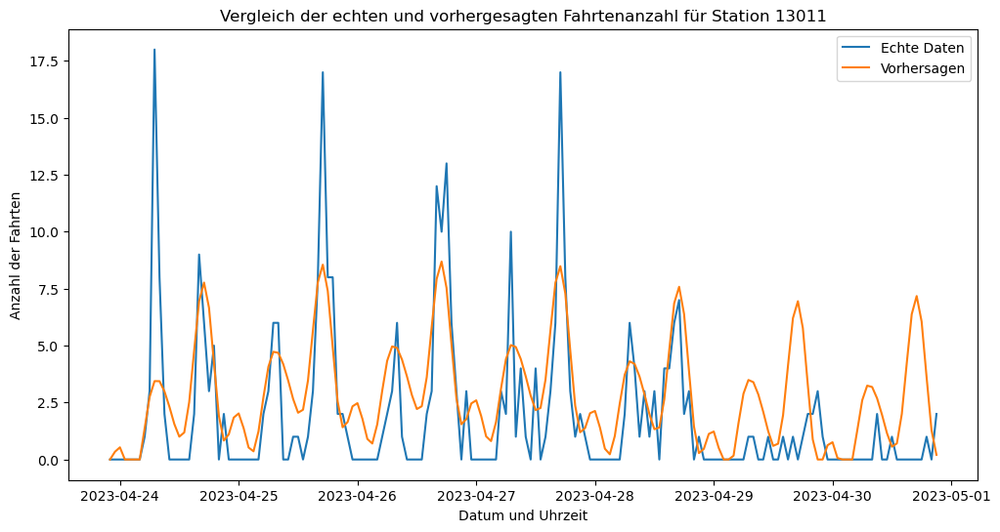

13:21:25 - cmdstanpy - INFO - Chain [1] start processing
13:21:25 - cmdstanpy - INFO - Chain [1] done processing


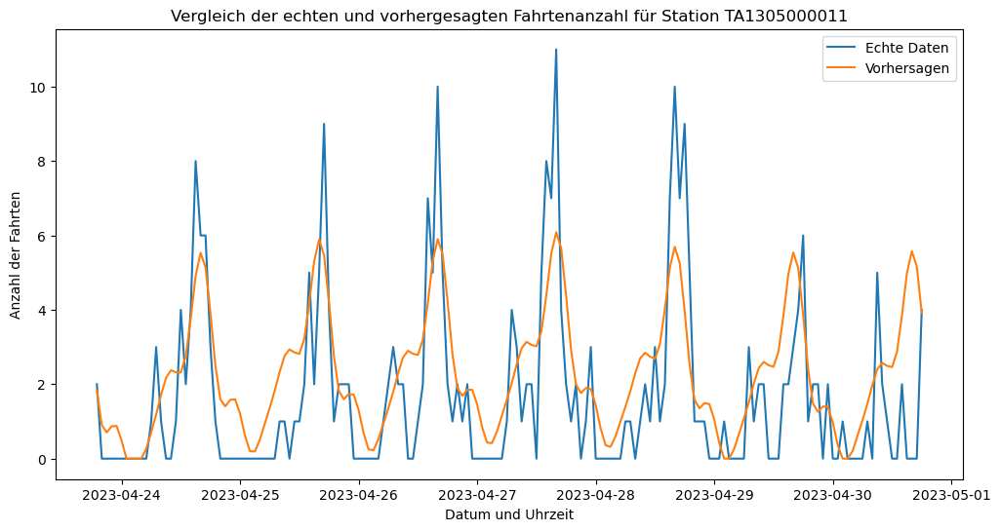

13:21:28 - cmdstanpy - INFO - Chain [1] start processing
13:21:28 - cmdstanpy - INFO - Chain [1] done processing


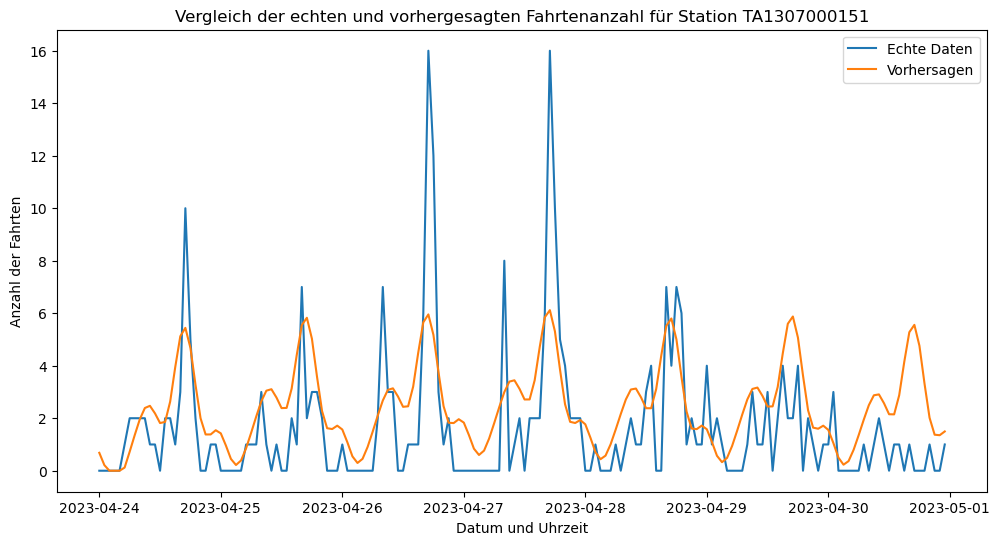

13:21:31 - cmdstanpy - INFO - Chain [1] start processing
13:21:31 - cmdstanpy - INFO - Chain [1] done processing


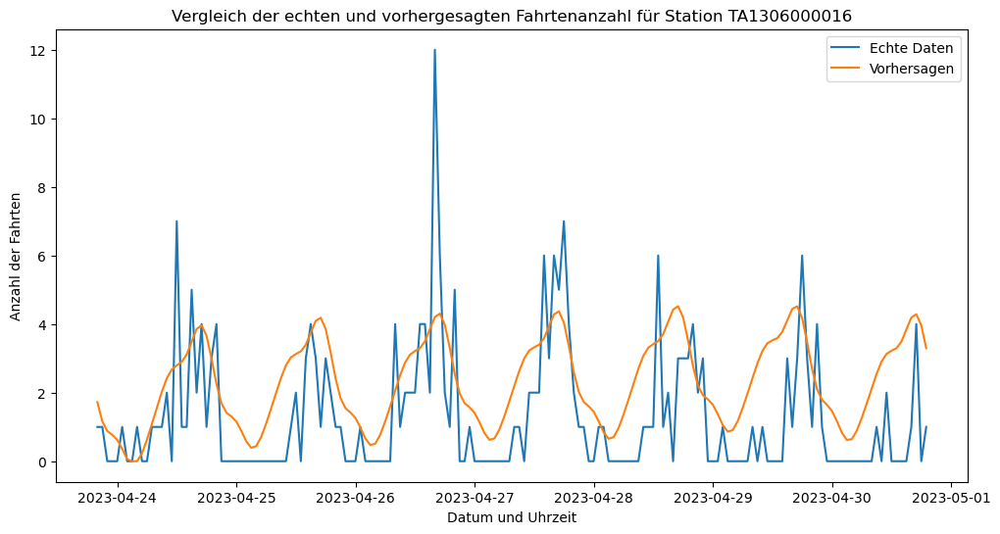

13:21:33 - cmdstanpy - INFO - Chain [1] start processing
13:21:34 - cmdstanpy - INFO - Chain [1] done processing


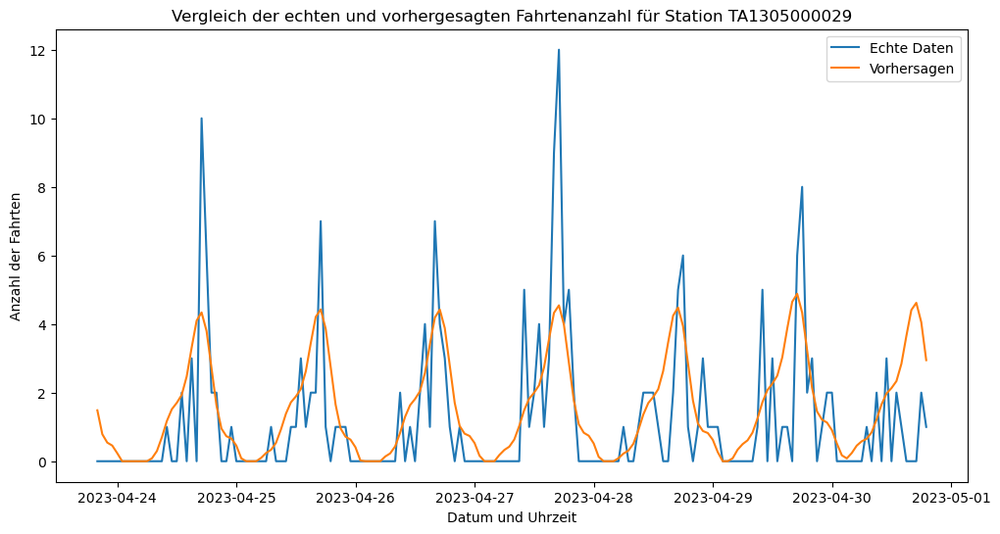

13:21:36 - cmdstanpy - INFO - Chain [1] start processing
13:21:36 - cmdstanpy - INFO - Chain [1] done processing


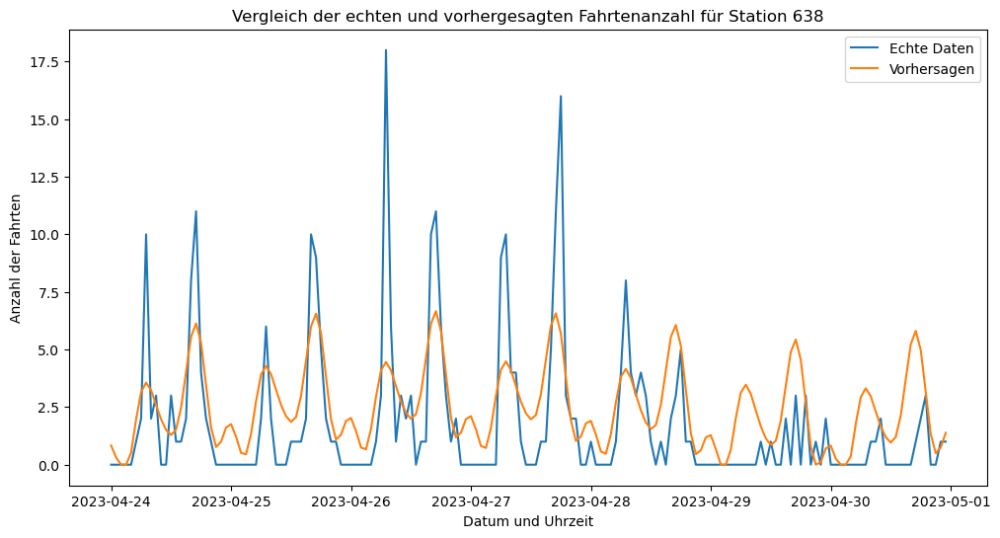

13:21:38 - cmdstanpy - INFO - Chain [1] start processing
13:21:39 - cmdstanpy - INFO - Chain [1] done processing


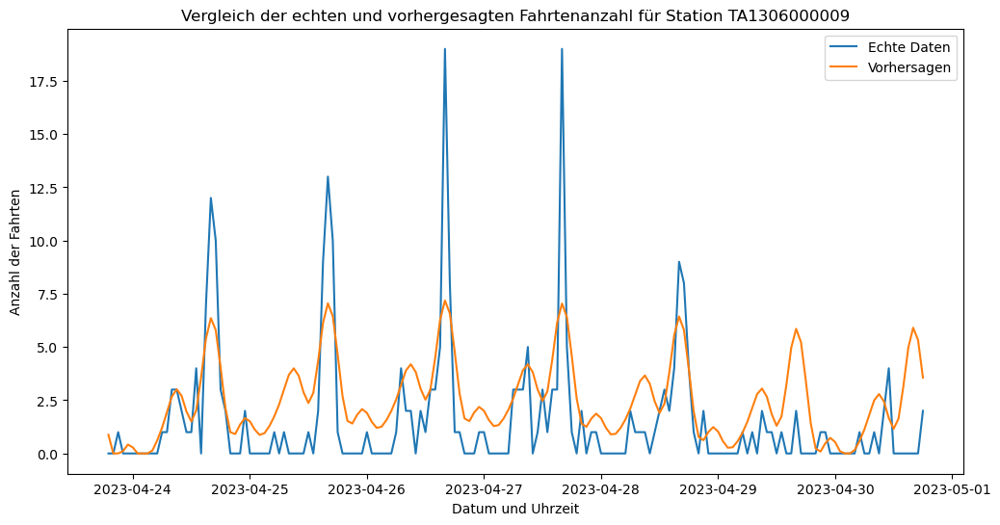

13:21:41 - cmdstanpy - INFO - Chain [1] start processing
13:21:41 - cmdstanpy - INFO - Chain [1] done processing


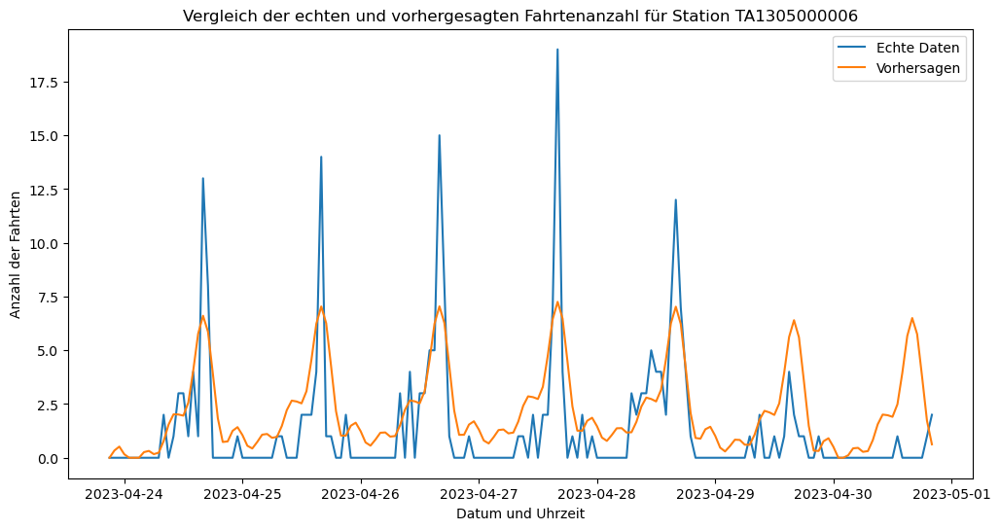

13:21:44 - cmdstanpy - INFO - Chain [1] start processing
13:21:44 - cmdstanpy - INFO - Chain [1] done processing


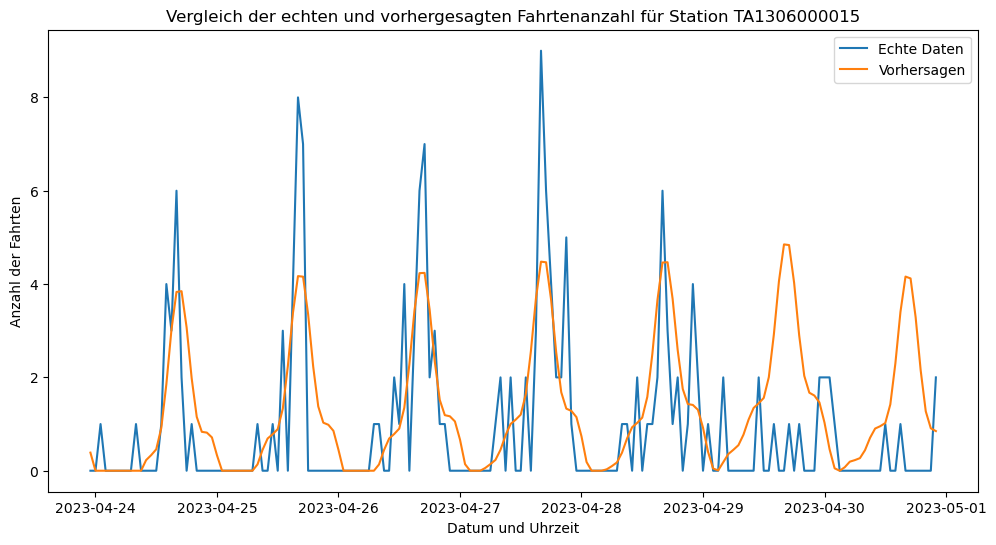

13:21:46 - cmdstanpy - INFO - Chain [1] start processing
13:21:46 - cmdstanpy - INFO - Chain [1] done processing


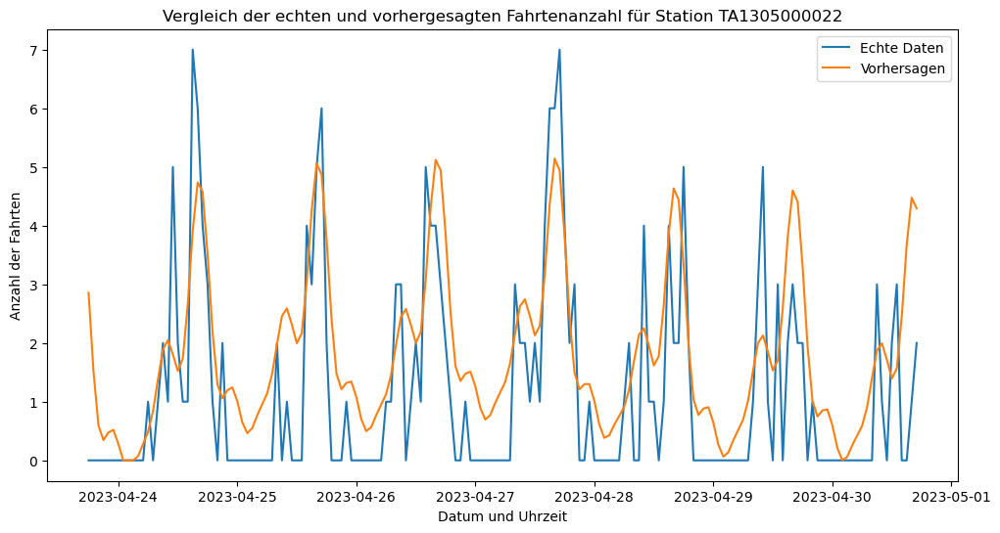

13:21:48 - cmdstanpy - INFO - Chain [1] start processing
13:21:49 - cmdstanpy - INFO - Chain [1] done processing


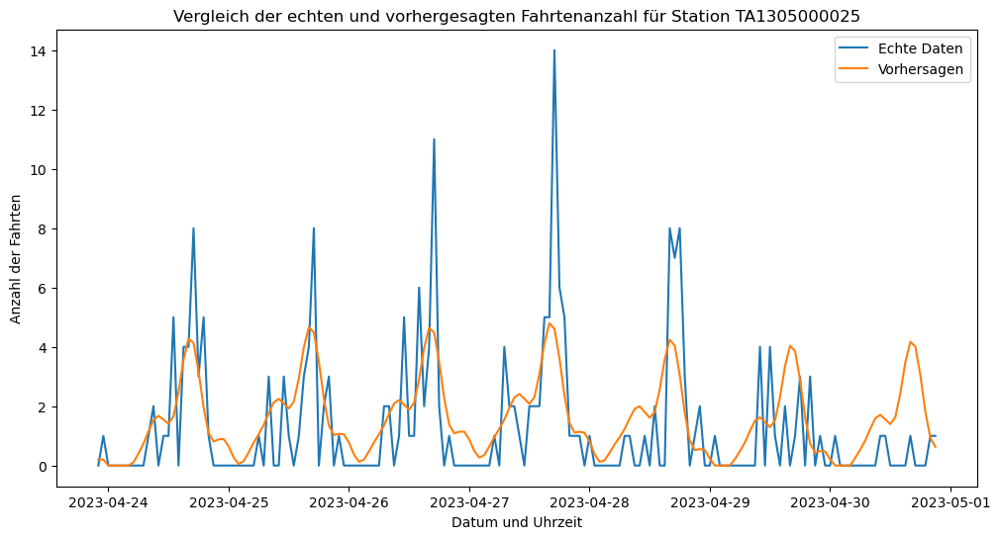

13:21:51 - cmdstanpy - INFO - Chain [1] start processing
13:21:51 - cmdstanpy - INFO - Chain [1] done processing


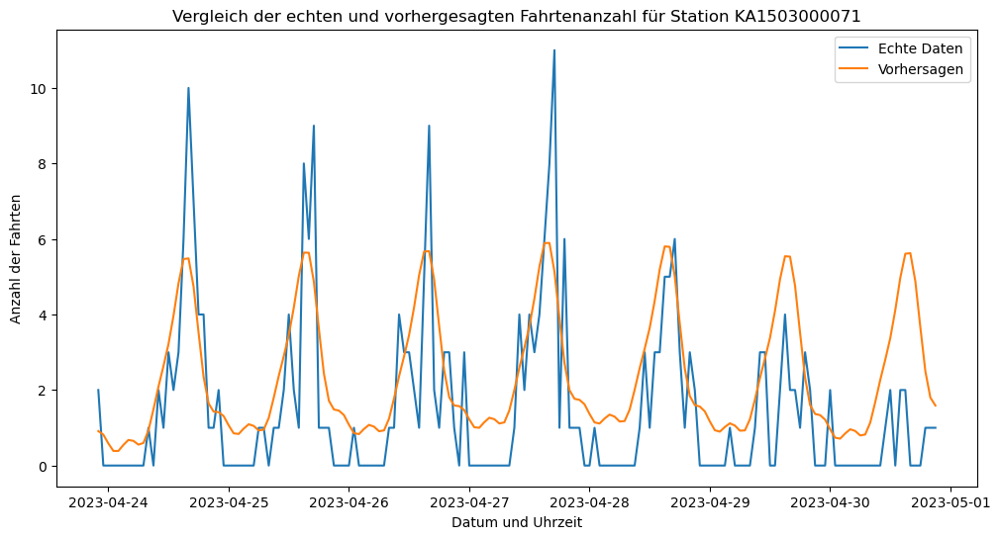

13:21:53 - cmdstanpy - INFO - Chain [1] start processing
13:21:54 - cmdstanpy - INFO - Chain [1] done processing


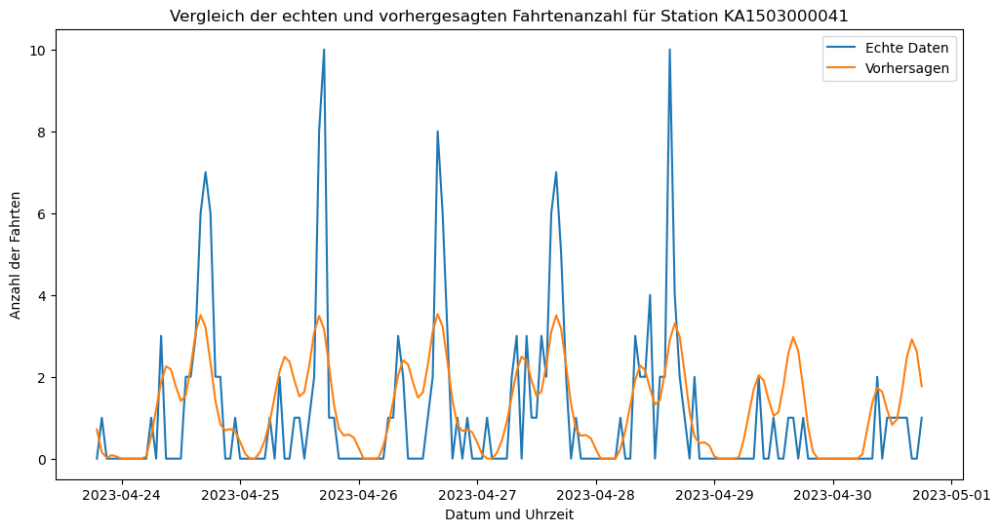

13:21:56 - cmdstanpy - INFO - Chain [1] start processing
13:21:56 - cmdstanpy - INFO - Chain [1] done processing


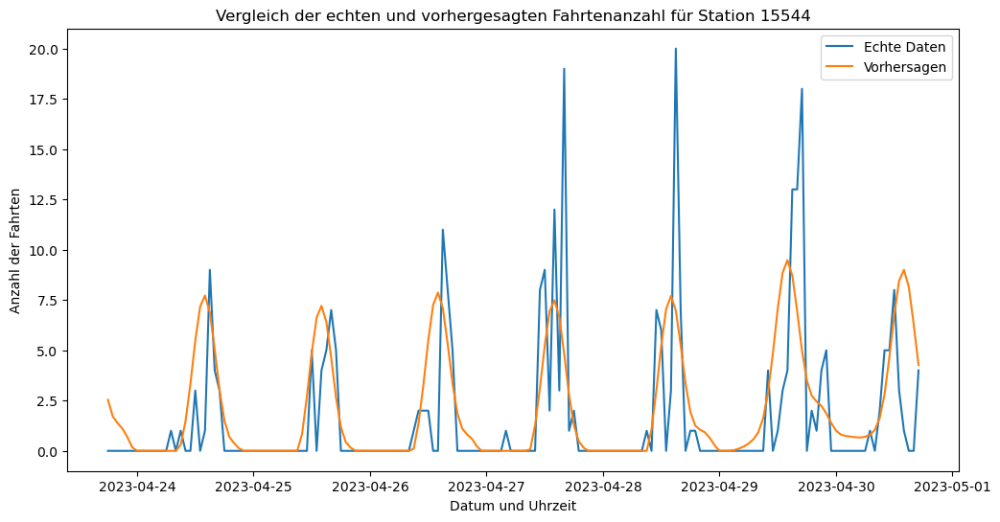

13:21:59 - cmdstanpy - INFO - Chain [1] start processing
13:21:59 - cmdstanpy - INFO - Chain [1] done processing


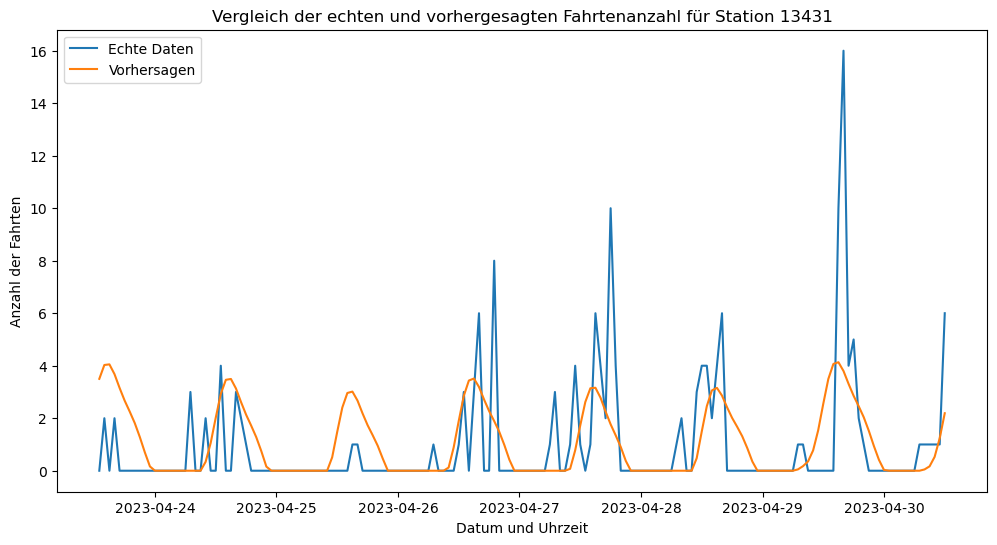

13:22:02 - cmdstanpy - INFO - Chain [1] start processing
13:22:02 - cmdstanpy - INFO - Chain [1] done processing


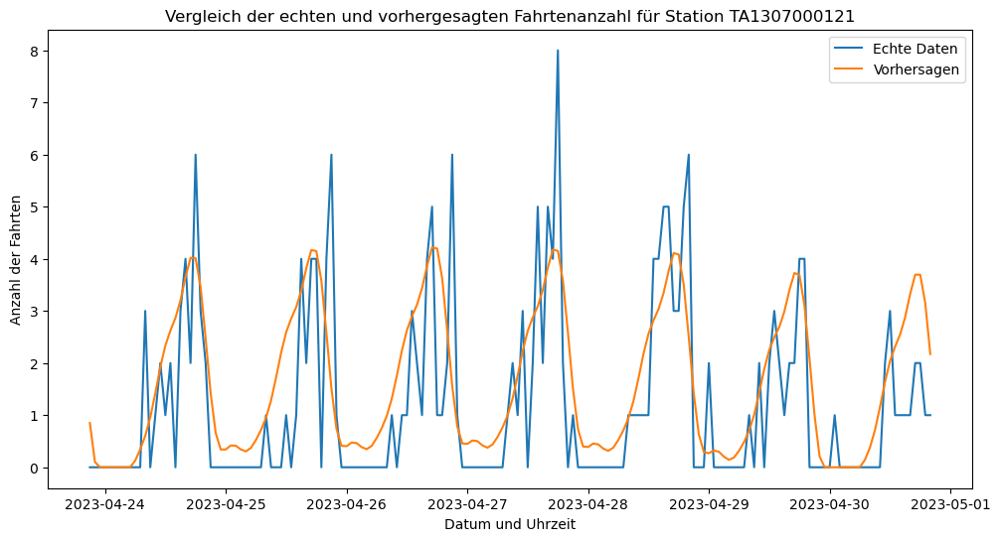

13:22:04 - cmdstanpy - INFO - Chain [1] start processing
13:22:05 - cmdstanpy - INFO - Chain [1] done processing


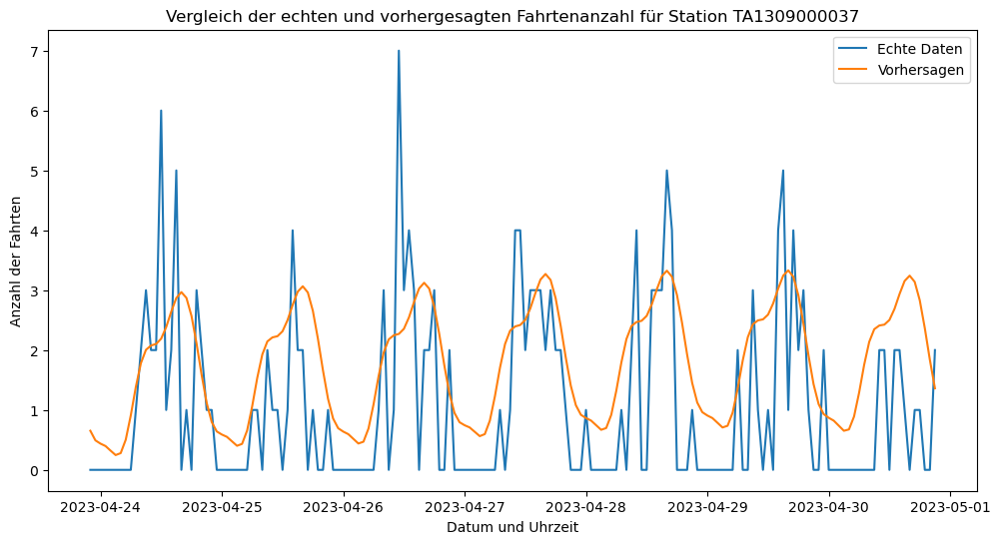

13:22:07 - cmdstanpy - INFO - Chain [1] start processing
13:22:07 - cmdstanpy - INFO - Chain [1] done processing


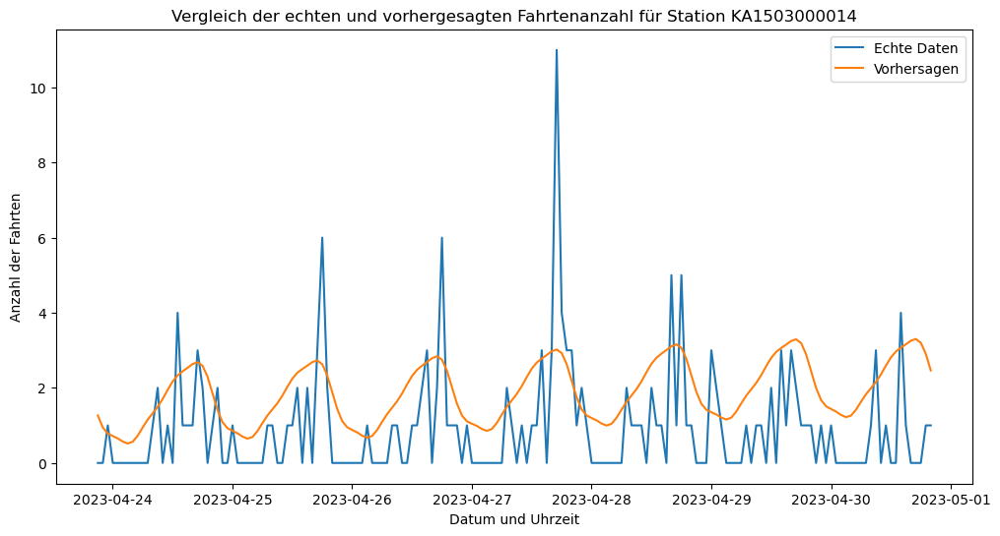

13:22:09 - cmdstanpy - INFO - Chain [1] start processing
13:22:10 - cmdstanpy - INFO - Chain [1] done processing


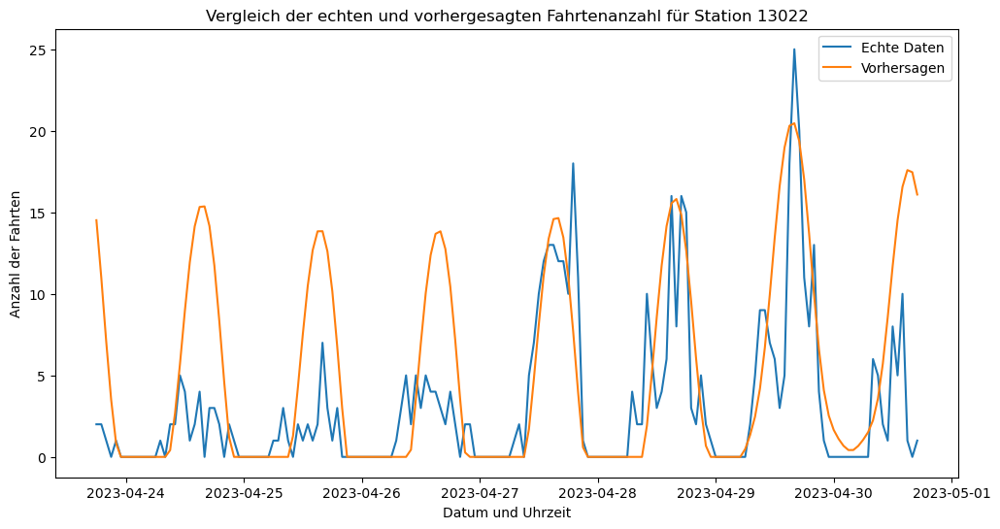

13:22:12 - cmdstanpy - INFO - Chain [1] start processing
13:22:12 - cmdstanpy - INFO - Chain [1] done processing


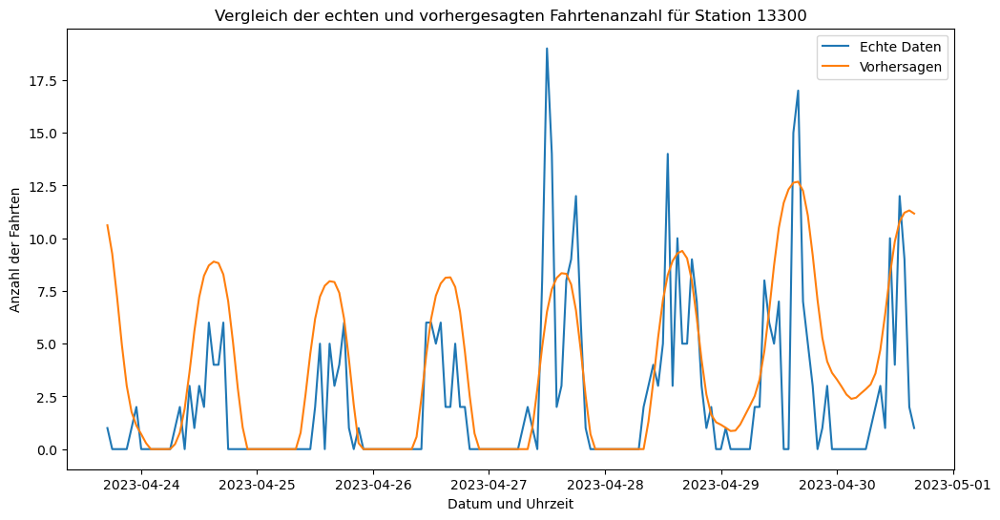

13:22:14 - cmdstanpy - INFO - Chain [1] start processing
13:22:15 - cmdstanpy - INFO - Chain [1] done processing


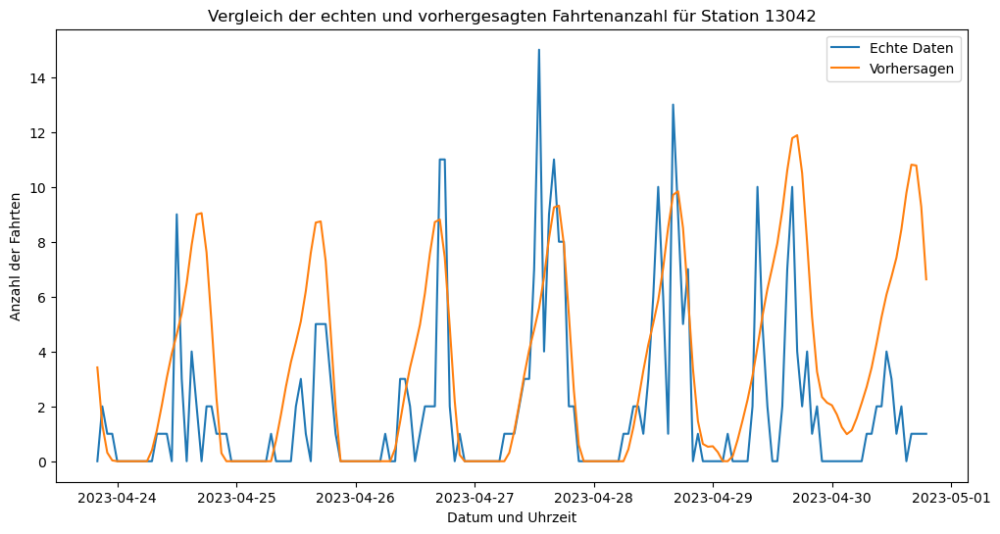

13:22:17 - cmdstanpy - INFO - Chain [1] start processing
13:22:17 - cmdstanpy - INFO - Chain [1] done processing


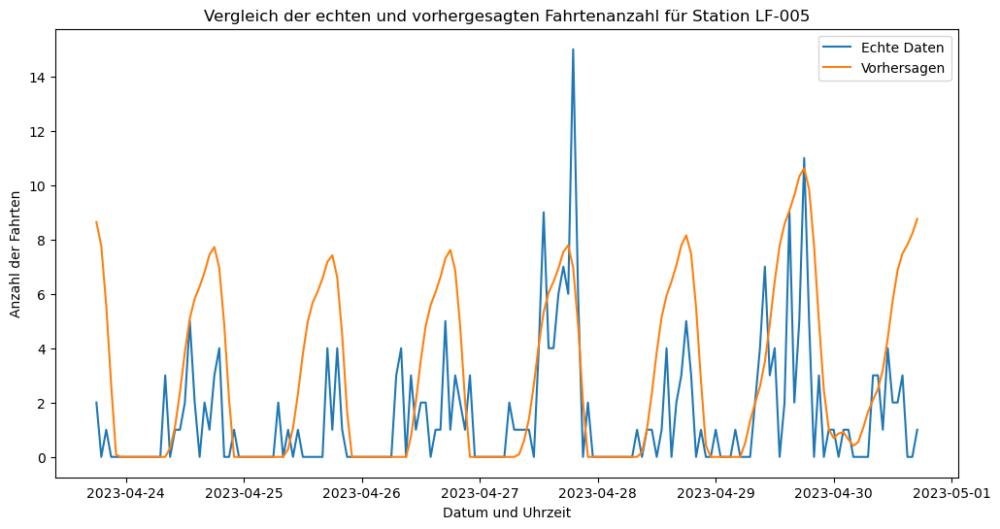

13:22:20 - cmdstanpy - INFO - Chain [1] start processing
13:22:20 - cmdstanpy - INFO - Chain [1] done processing


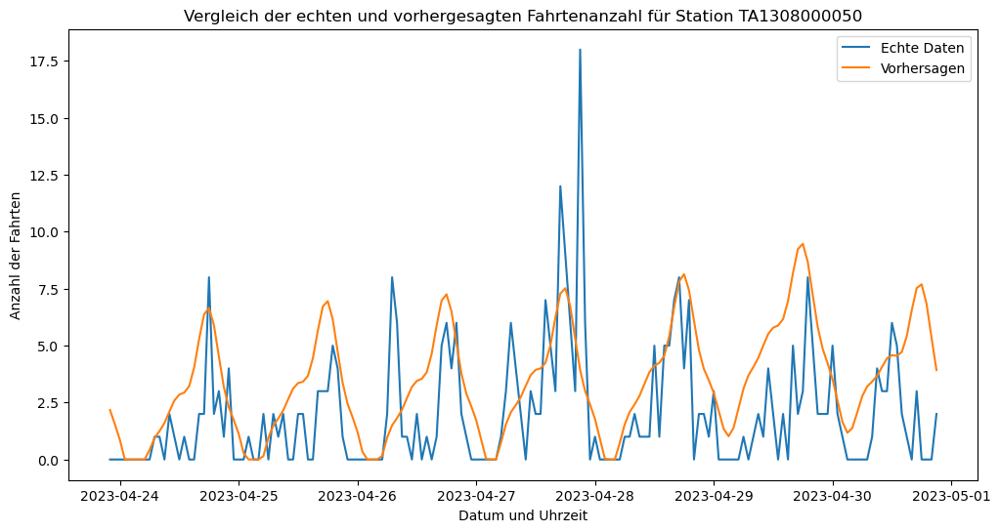

13:22:23 - cmdstanpy - INFO - Chain [1] start processing
13:22:23 - cmdstanpy - INFO - Chain [1] done processing


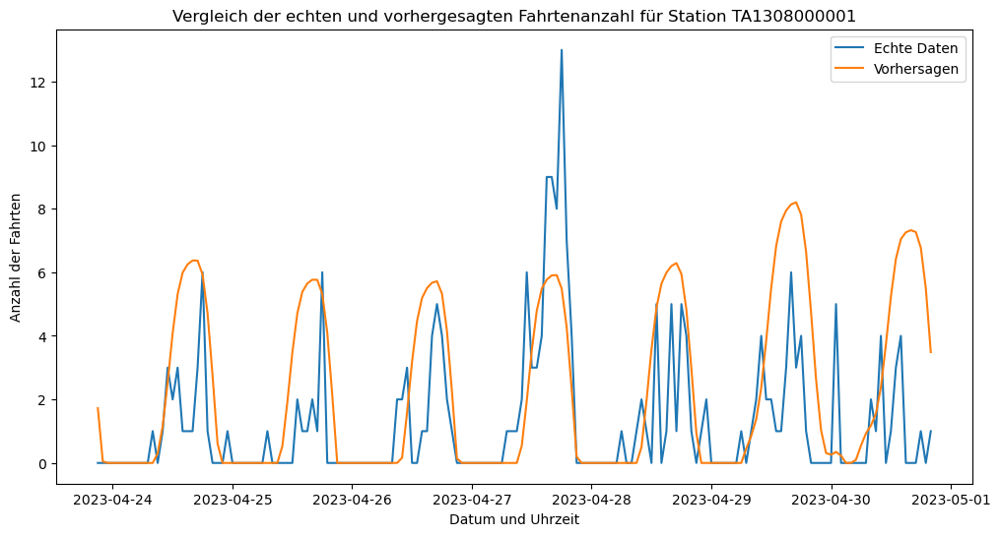

13:22:25 - cmdstanpy - INFO - Chain [1] start processing
13:22:26 - cmdstanpy - INFO - Chain [1] done processing


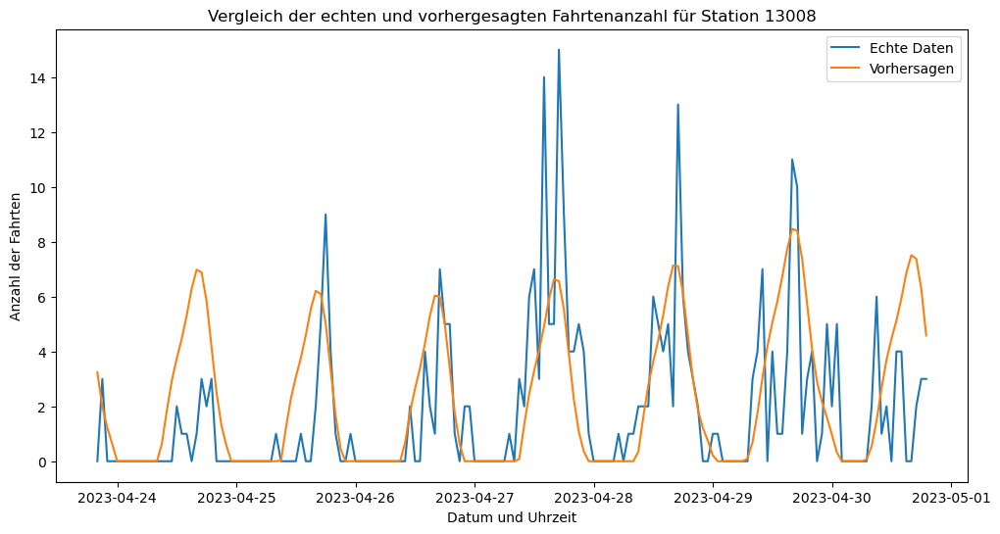

13:22:28 - cmdstanpy - INFO - Chain [1] start processing
13:22:28 - cmdstanpy - INFO - Chain [1] done processing


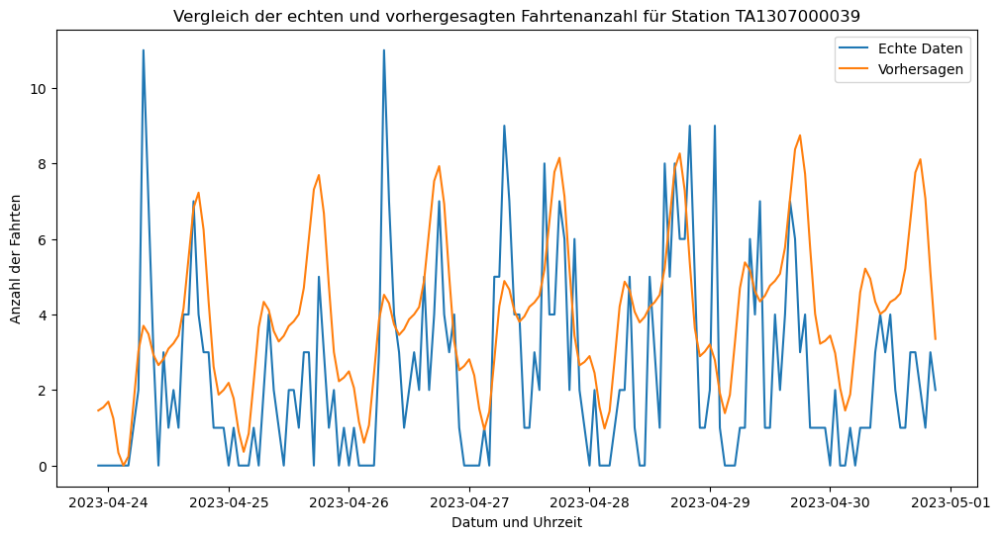

13:22:31 - cmdstanpy - INFO - Chain [1] start processing
13:22:31 - cmdstanpy - INFO - Chain [1] done processing


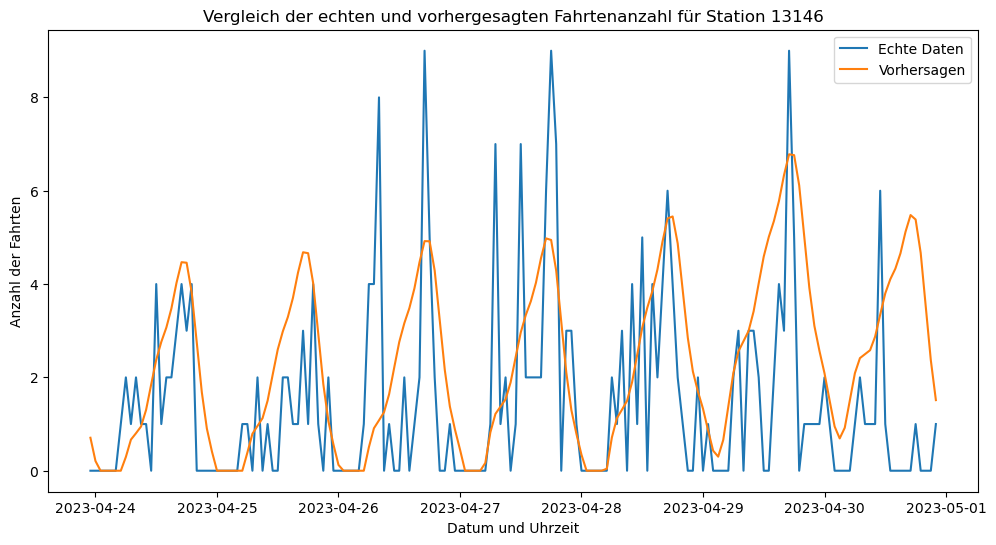

13:22:34 - cmdstanpy - INFO - Chain [1] start processing
13:22:34 - cmdstanpy - INFO - Chain [1] done processing


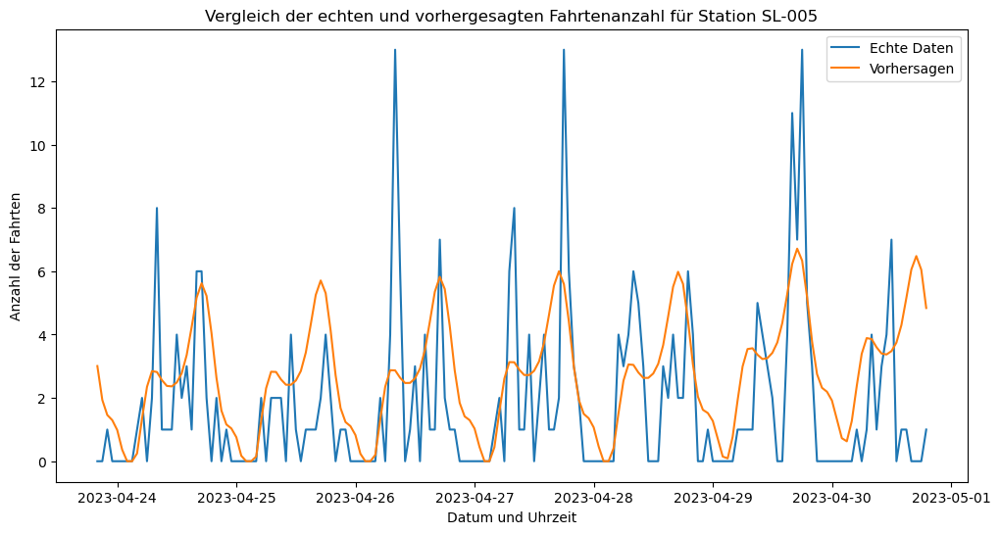

13:22:36 - cmdstanpy - INFO - Chain [1] start processing
13:22:37 - cmdstanpy - INFO - Chain [1] done processing


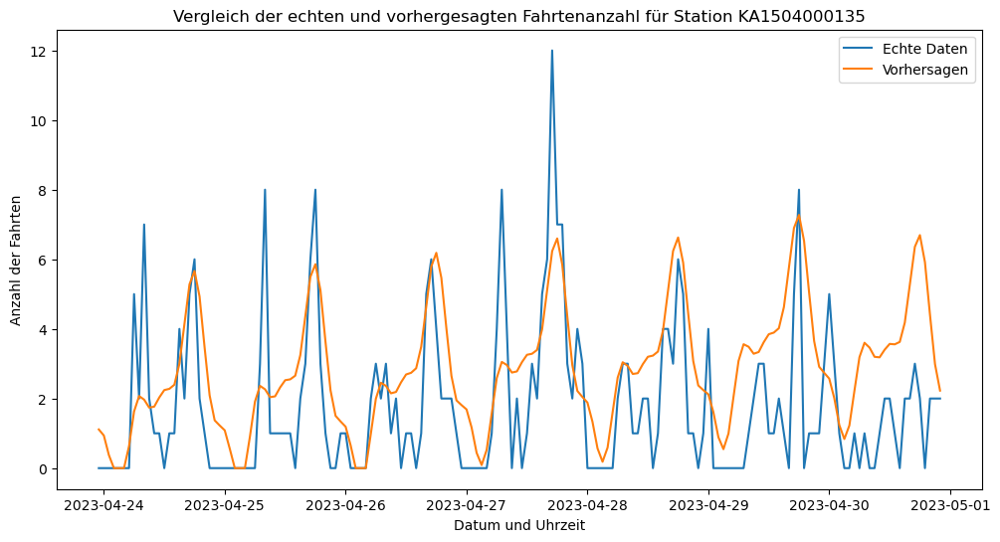

13:22:39 - cmdstanpy - INFO - Chain [1] start processing
13:22:39 - cmdstanpy - INFO - Chain [1] done processing


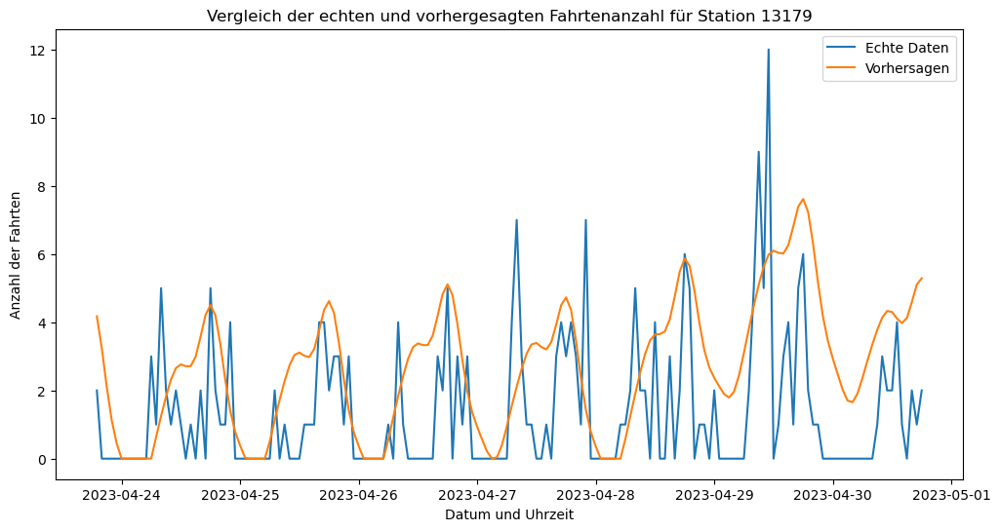

13:22:42 - cmdstanpy - INFO - Chain [1] start processing
13:22:42 - cmdstanpy - INFO - Chain [1] done processing


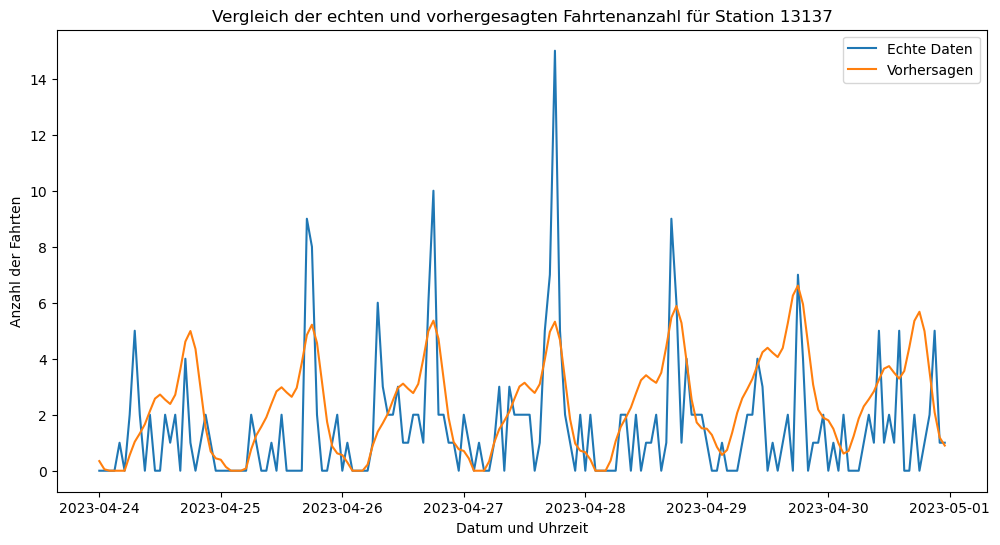

13:22:44 - cmdstanpy - INFO - Chain [1] start processing
13:22:45 - cmdstanpy - INFO - Chain [1] done processing


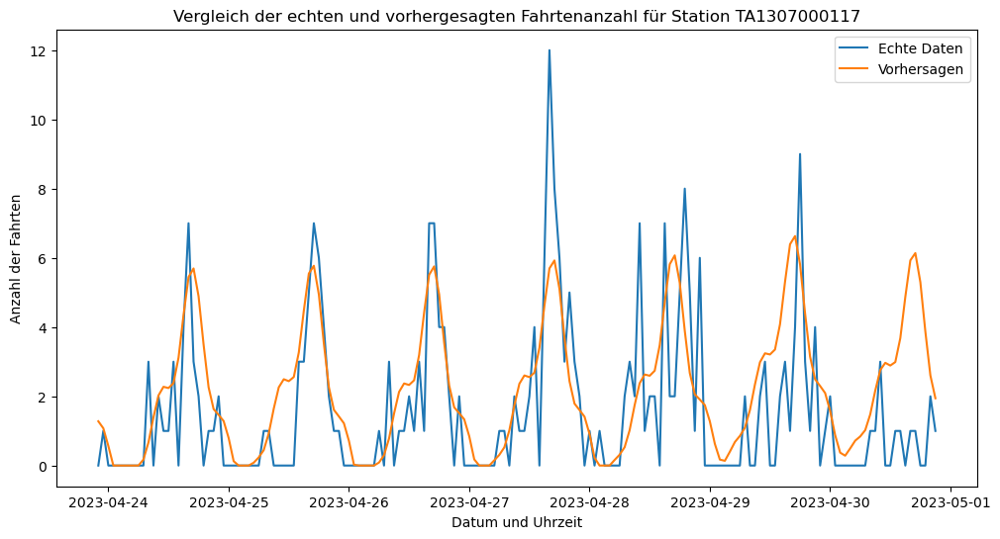

13:22:48 - cmdstanpy - INFO - Chain [1] start processing
13:22:48 - cmdstanpy - INFO - Chain [1] done processing


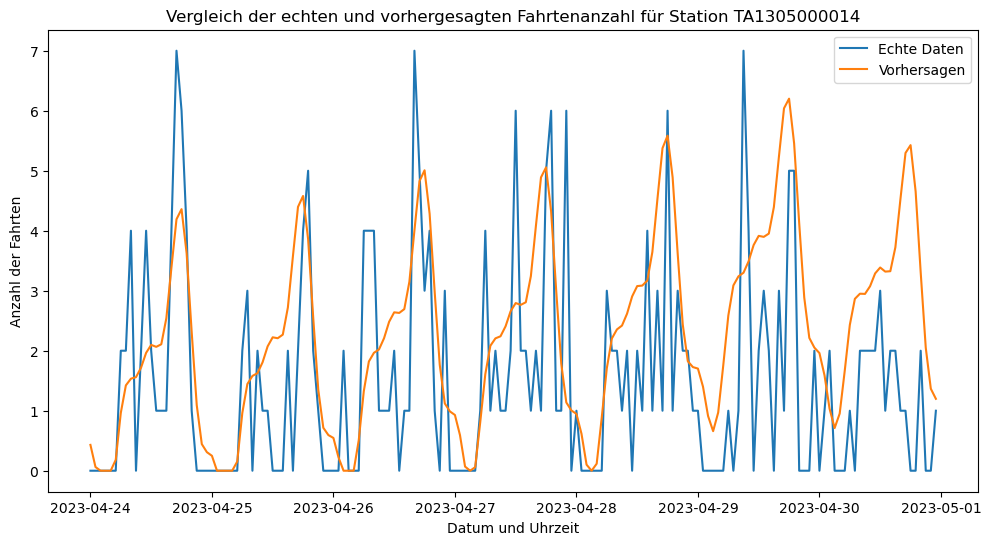

13:22:51 - cmdstanpy - INFO - Chain [1] start processing
13:22:51 - cmdstanpy - INFO - Chain [1] done processing


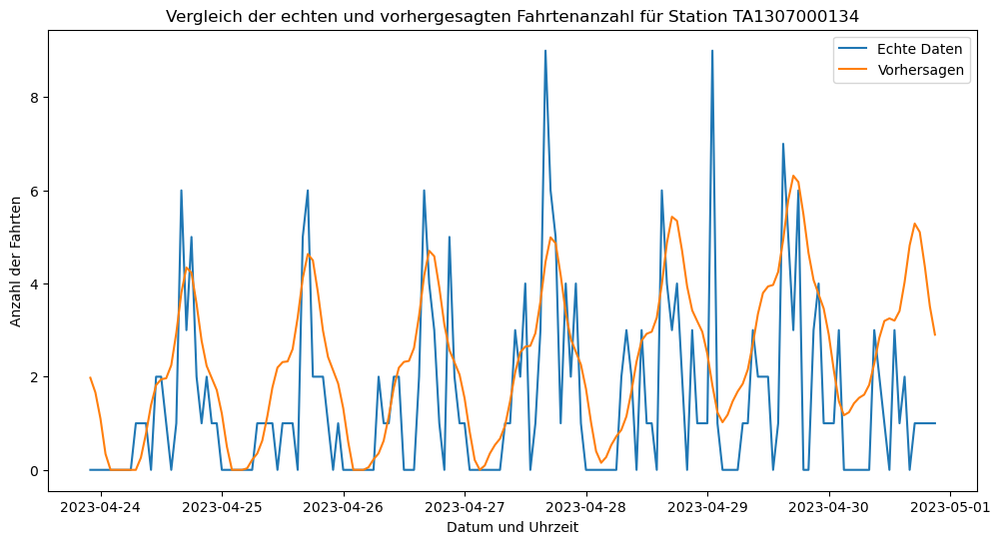

13:22:53 - cmdstanpy - INFO - Chain [1] start processing
13:22:54 - cmdstanpy - INFO - Chain [1] done processing


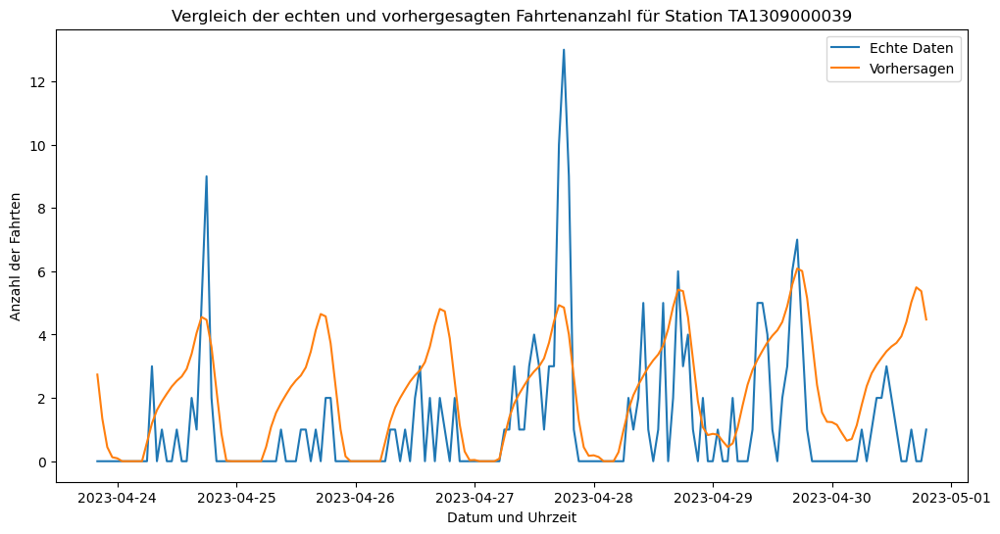

13:22:57 - cmdstanpy - INFO - Chain [1] start processing
13:22:57 - cmdstanpy - INFO - Chain [1] done processing


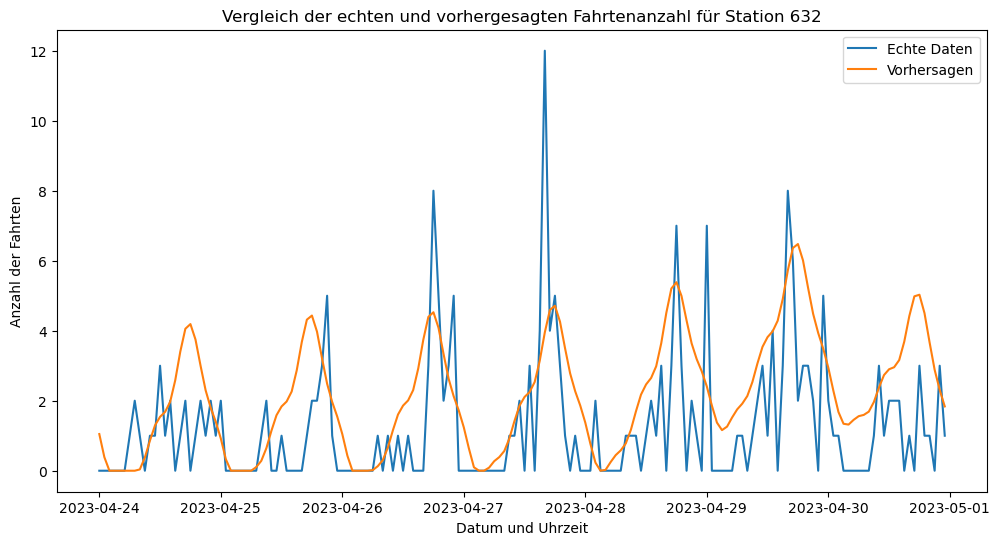

13:23:01 - cmdstanpy - INFO - Chain [1] start processing
13:23:01 - cmdstanpy - INFO - Chain [1] done processing


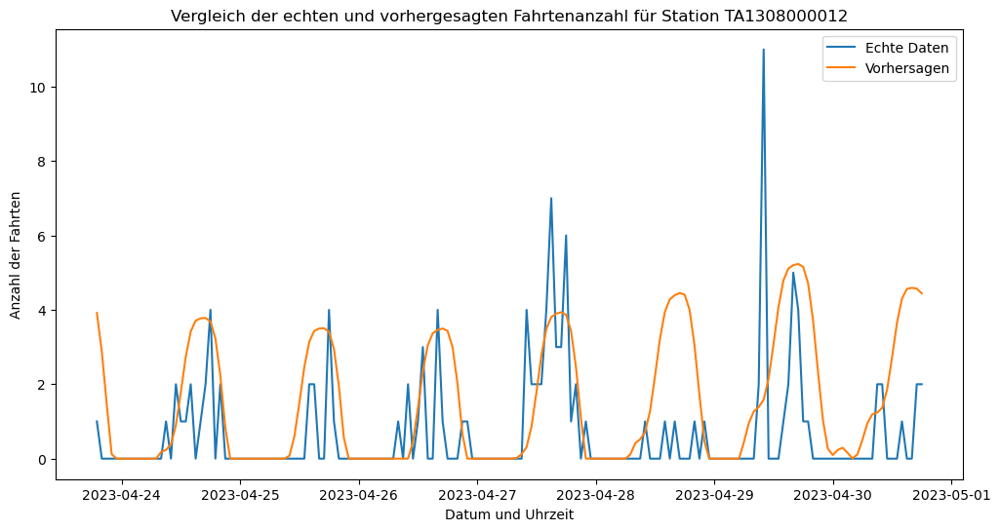

13:23:04 - cmdstanpy - INFO - Chain [1] start processing
13:23:04 - cmdstanpy - INFO - Chain [1] done processing


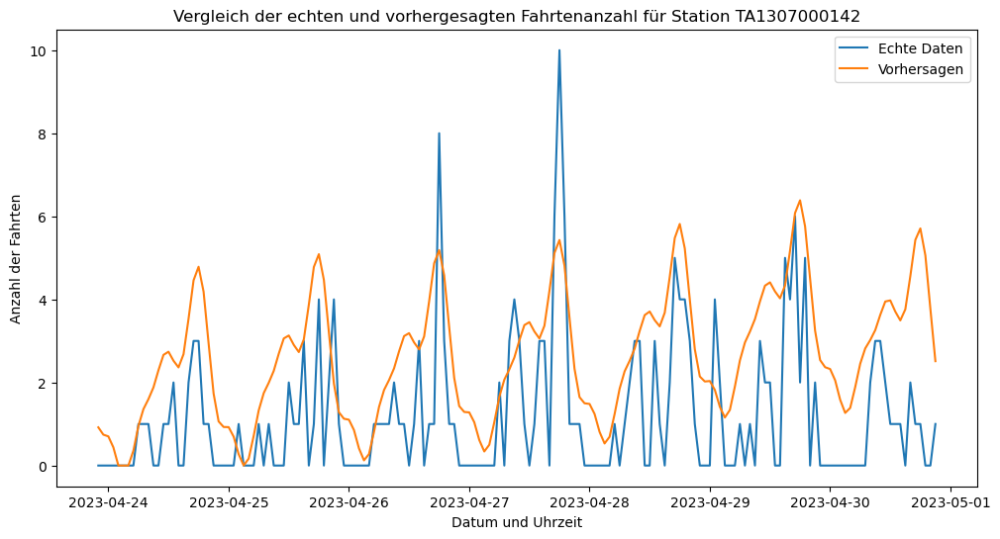

13:23:07 - cmdstanpy - INFO - Chain [1] start processing
13:23:07 - cmdstanpy - INFO - Chain [1] done processing


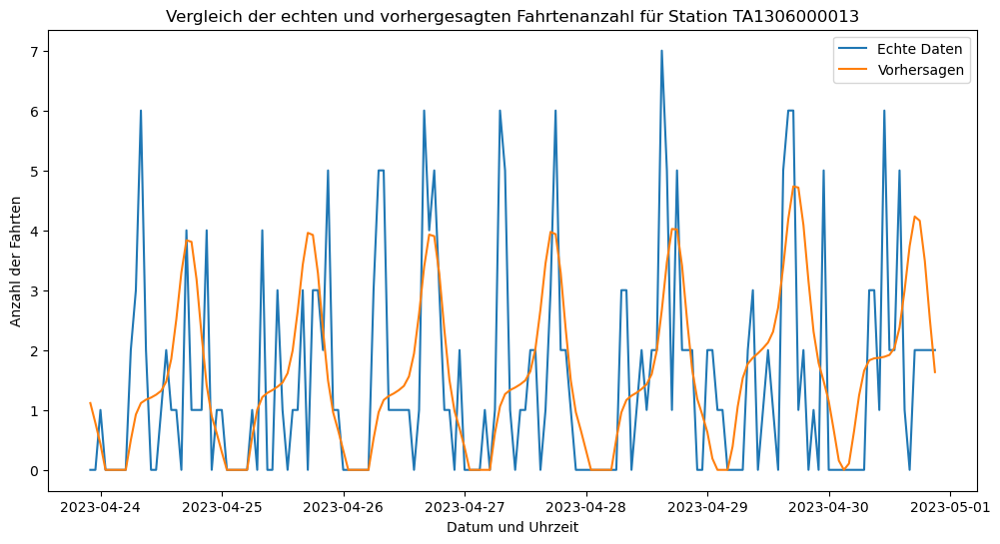

13:23:09 - cmdstanpy - INFO - Chain [1] start processing
13:23:10 - cmdstanpy - INFO - Chain [1] done processing


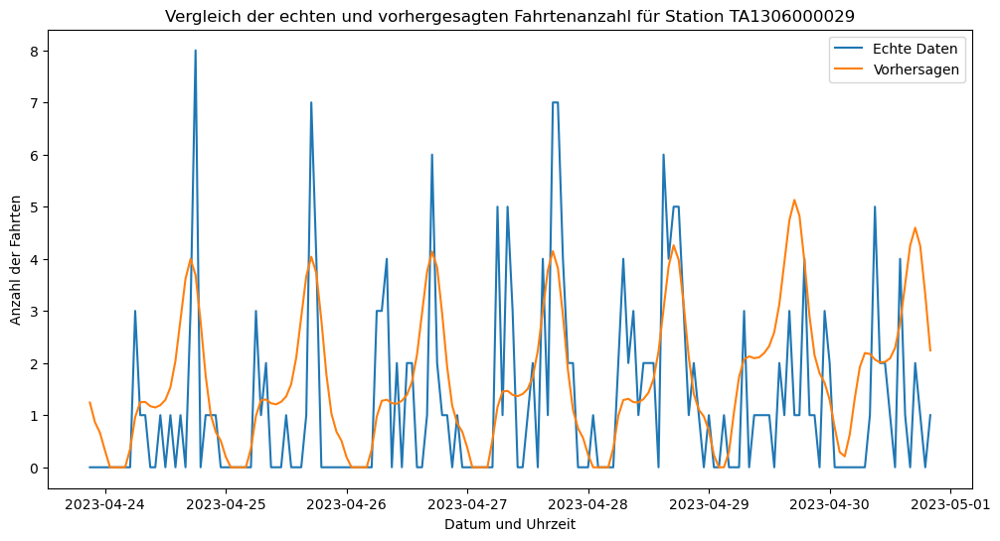

13:23:13 - cmdstanpy - INFO - Chain [1] start processing
13:23:13 - cmdstanpy - INFO - Chain [1] done processing


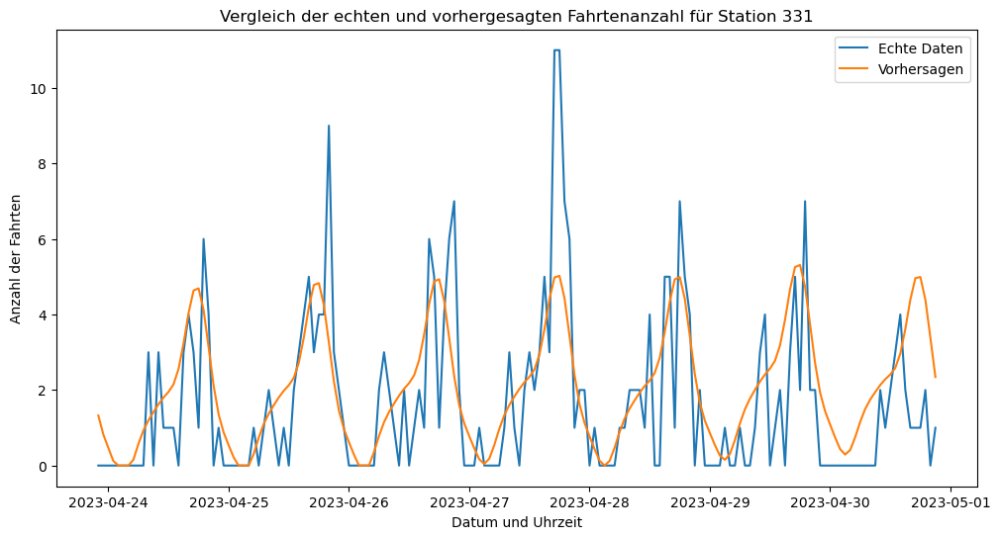

13:23:16 - cmdstanpy - INFO - Chain [1] start processing
13:23:16 - cmdstanpy - INFO - Chain [1] done processing


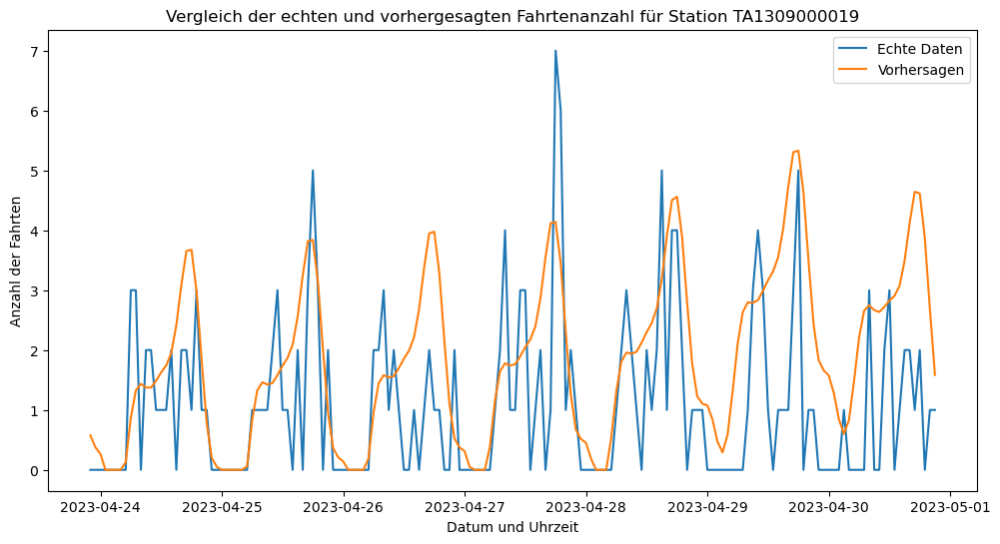

13:23:19 - cmdstanpy - INFO - Chain [1] start processing
13:23:19 - cmdstanpy - INFO - Chain [1] done processing


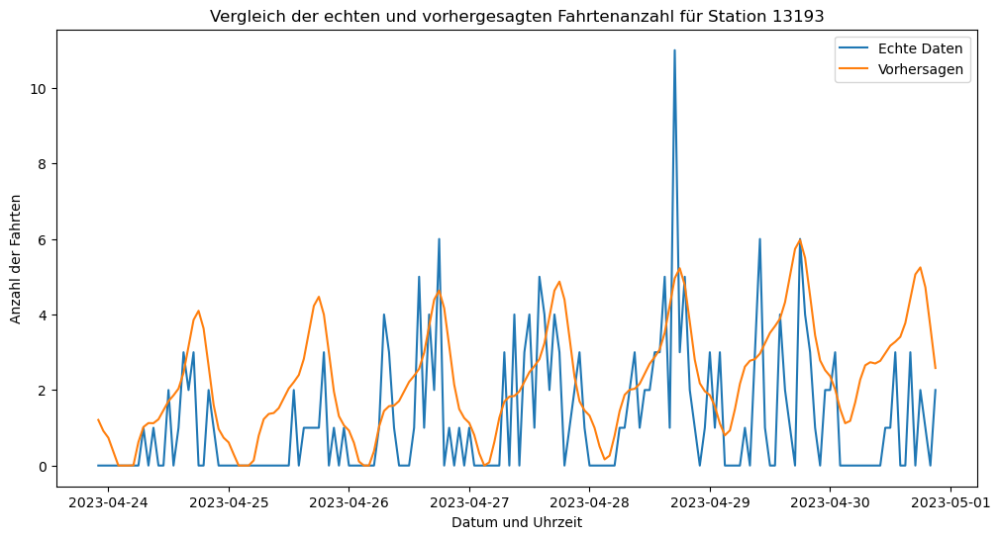

13:23:22 - cmdstanpy - INFO - Chain [1] start processing
13:23:22 - cmdstanpy - INFO - Chain [1] done processing


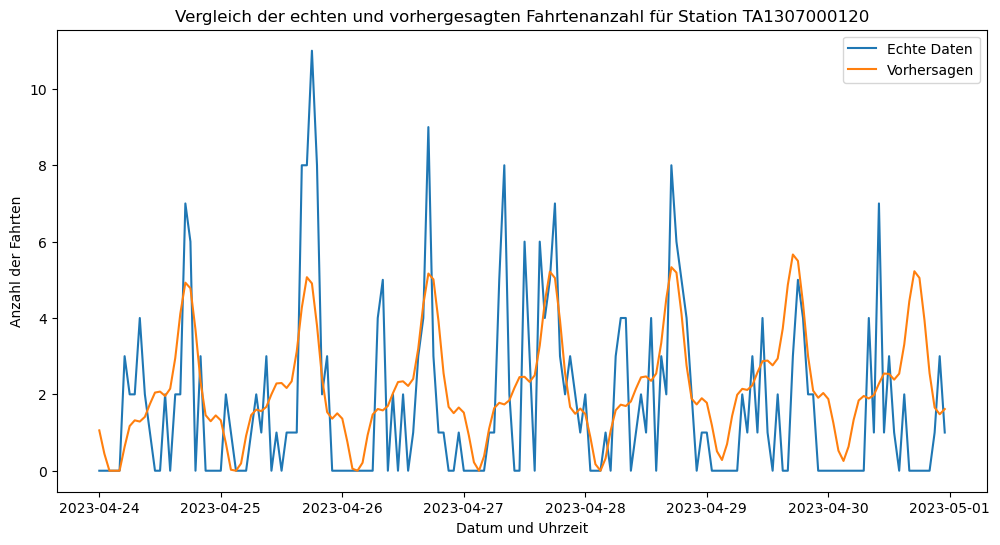

13:23:25 - cmdstanpy - INFO - Chain [1] start processing
13:23:25 - cmdstanpy - INFO - Chain [1] done processing


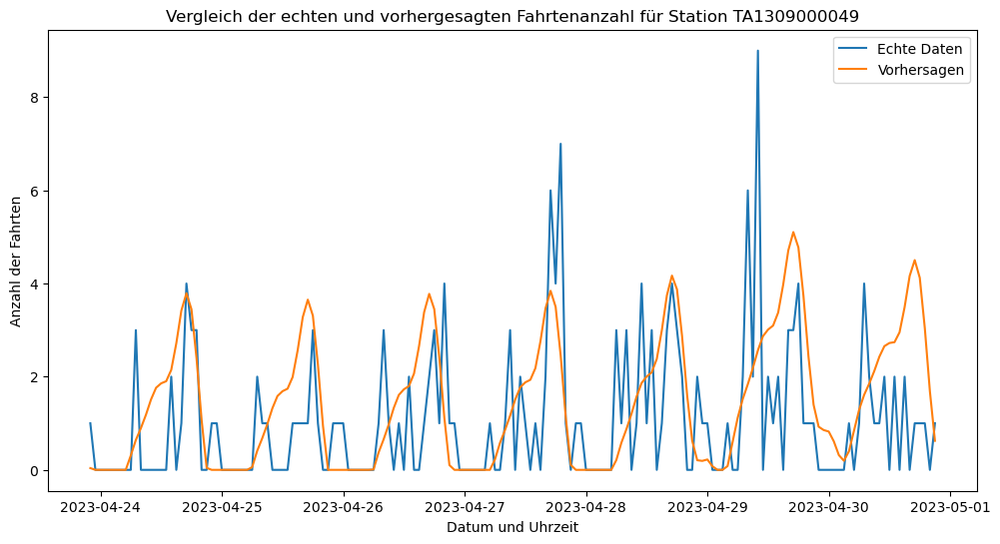

13:23:27 - cmdstanpy - INFO - Chain [1] start processing
13:23:27 - cmdstanpy - INFO - Chain [1] done processing


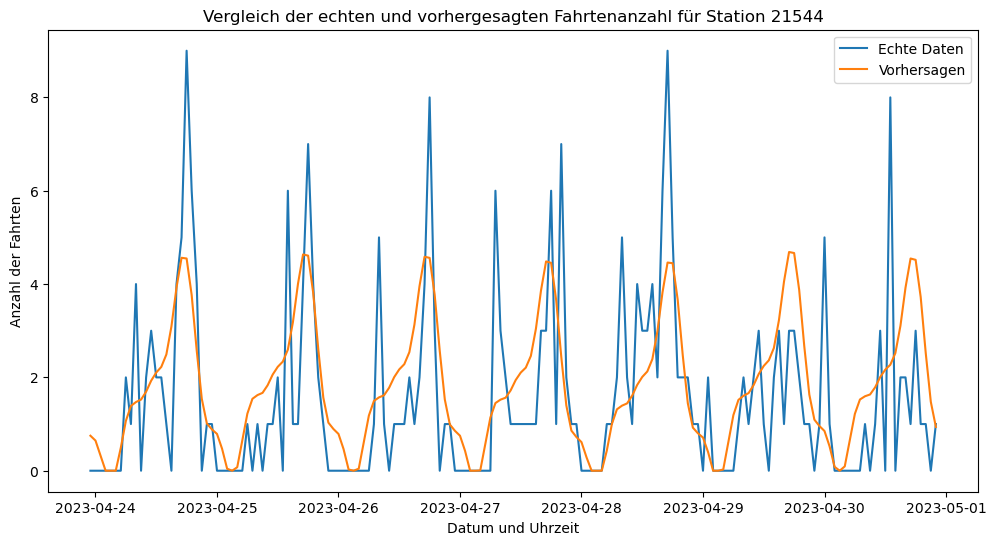

13:23:30 - cmdstanpy - INFO - Chain [1] start processing
13:23:30 - cmdstanpy - INFO - Chain [1] done processing


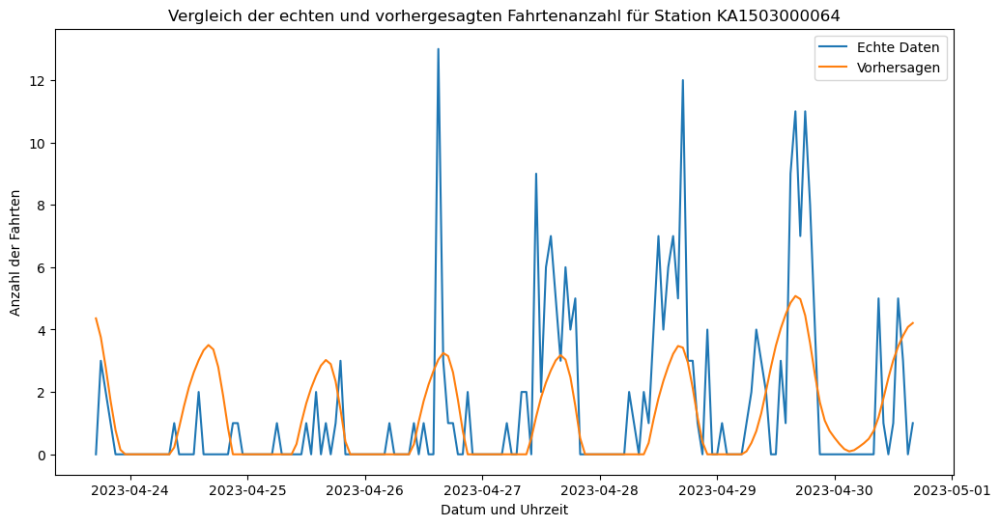

13:23:33 - cmdstanpy - INFO - Chain [1] start processing
13:23:34 - cmdstanpy - INFO - Chain [1] done processing


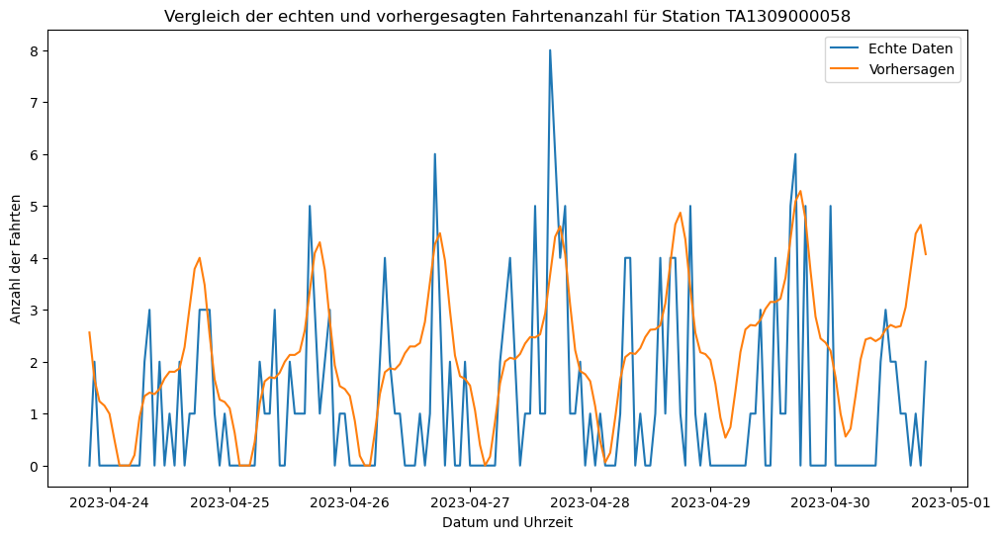

13:23:36 - cmdstanpy - INFO - Chain [1] start processing
13:23:37 - cmdstanpy - INFO - Chain [1] done processing


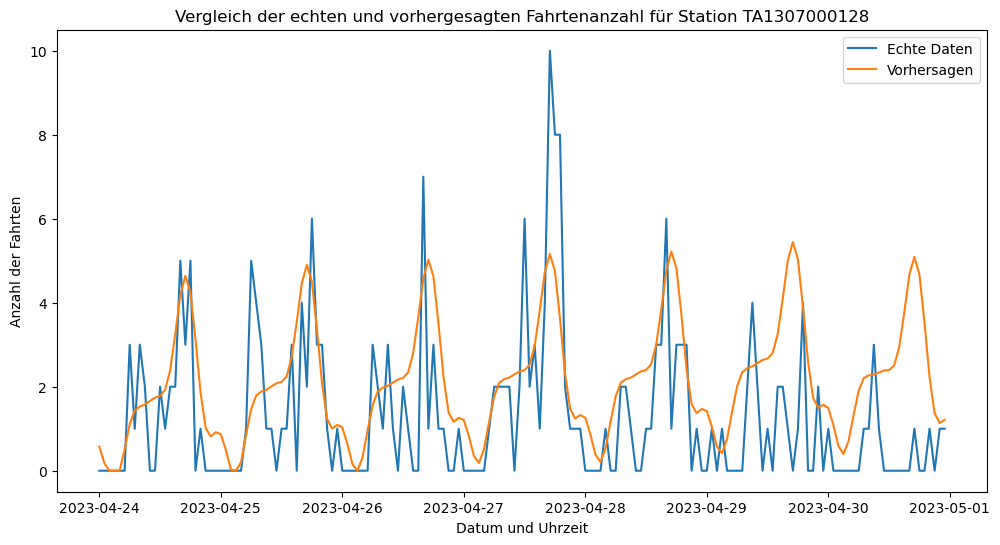

13:23:39 - cmdstanpy - INFO - Chain [1] start processing
13:23:40 - cmdstanpy - INFO - Chain [1] done processing


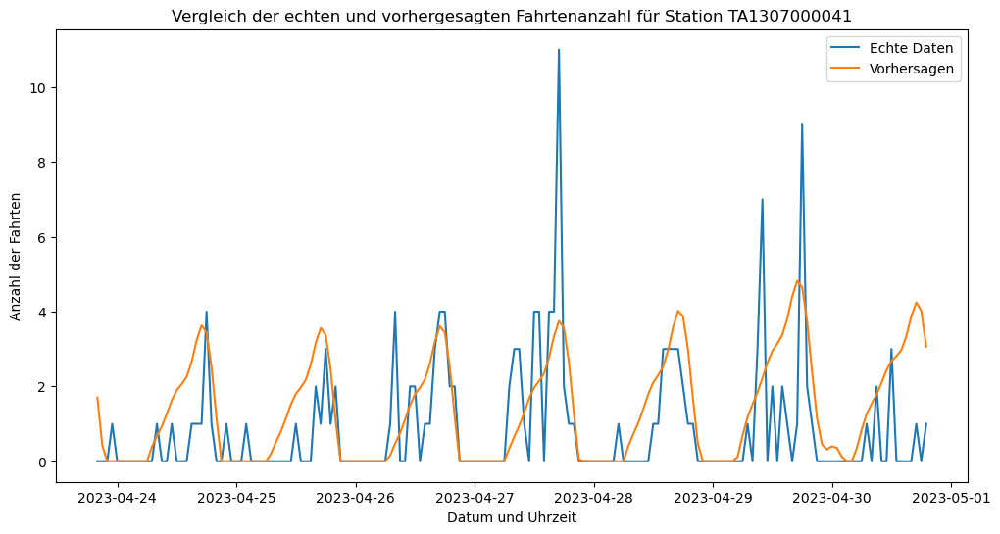

13:23:42 - cmdstanpy - INFO - Chain [1] start processing
13:23:43 - cmdstanpy - INFO - Chain [1] done processing


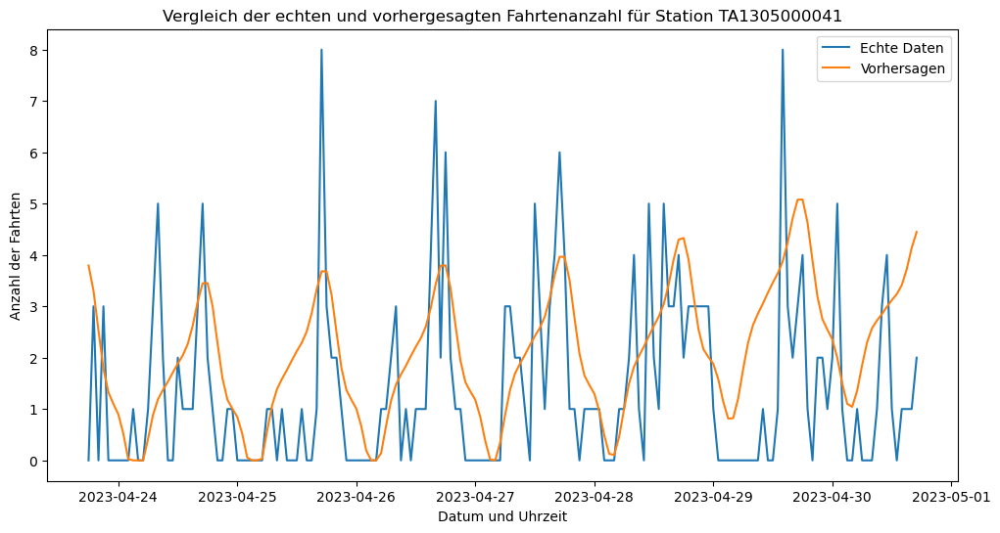

13:23:45 - cmdstanpy - INFO - Chain [1] start processing
13:23:46 - cmdstanpy - INFO - Chain [1] done processing


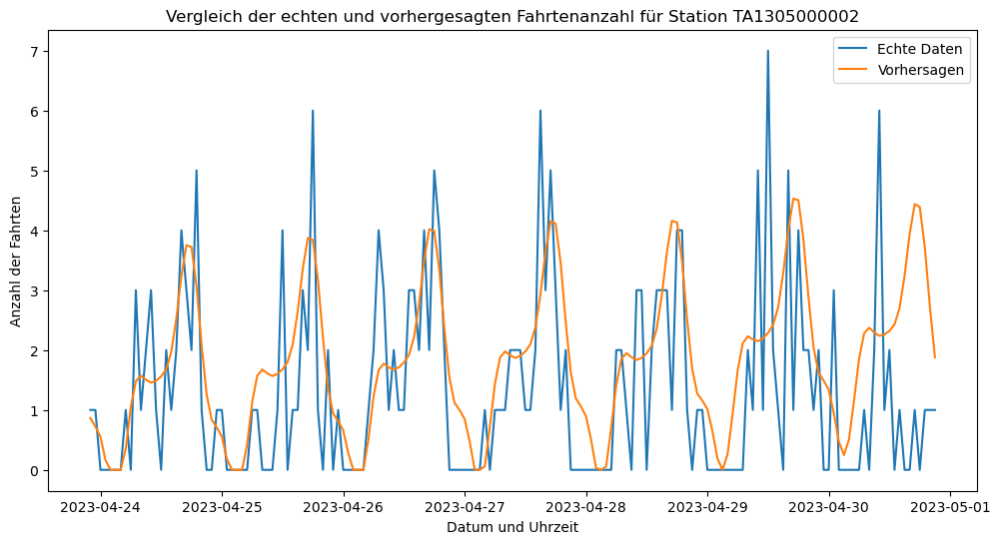

13:23:49 - cmdstanpy - INFO - Chain [1] start processing
13:23:50 - cmdstanpy - INFO - Chain [1] done processing


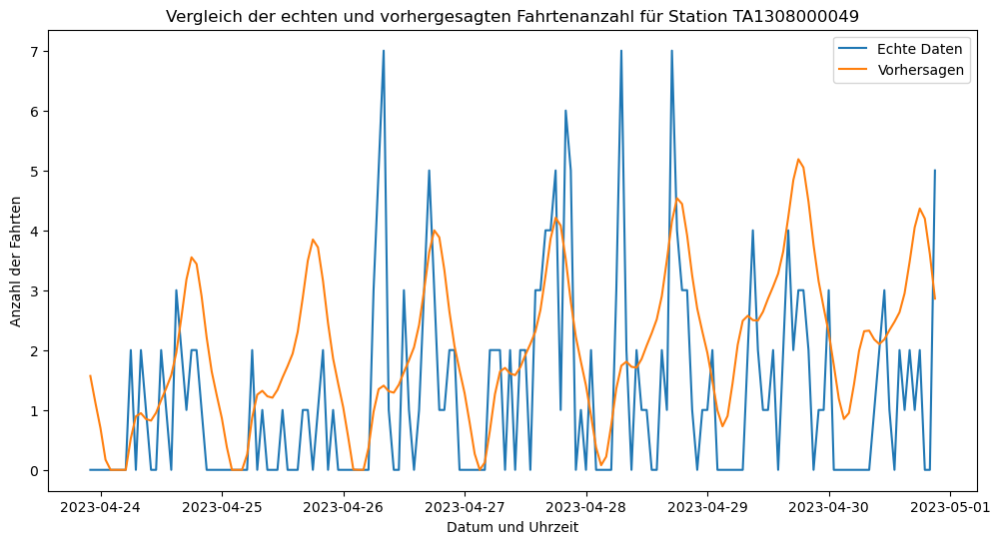

13:23:52 - cmdstanpy - INFO - Chain [1] start processing
13:23:53 - cmdstanpy - INFO - Chain [1] done processing


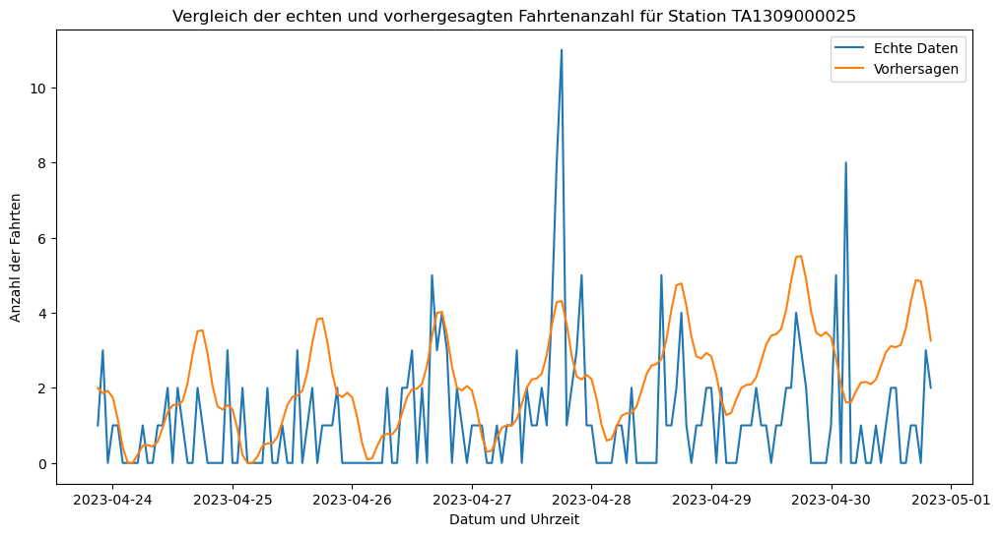

13:23:55 - cmdstanpy - INFO - Chain [1] start processing
13:23:56 - cmdstanpy - INFO - Chain [1] done processing


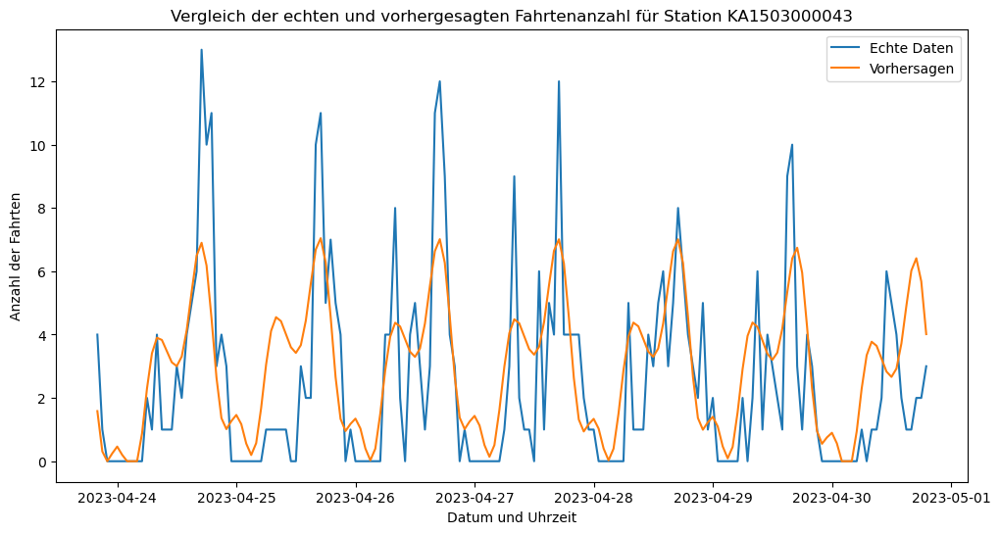

13:23:58 - cmdstanpy - INFO - Chain [1] start processing
13:23:58 - cmdstanpy - INFO - Chain [1] done processing


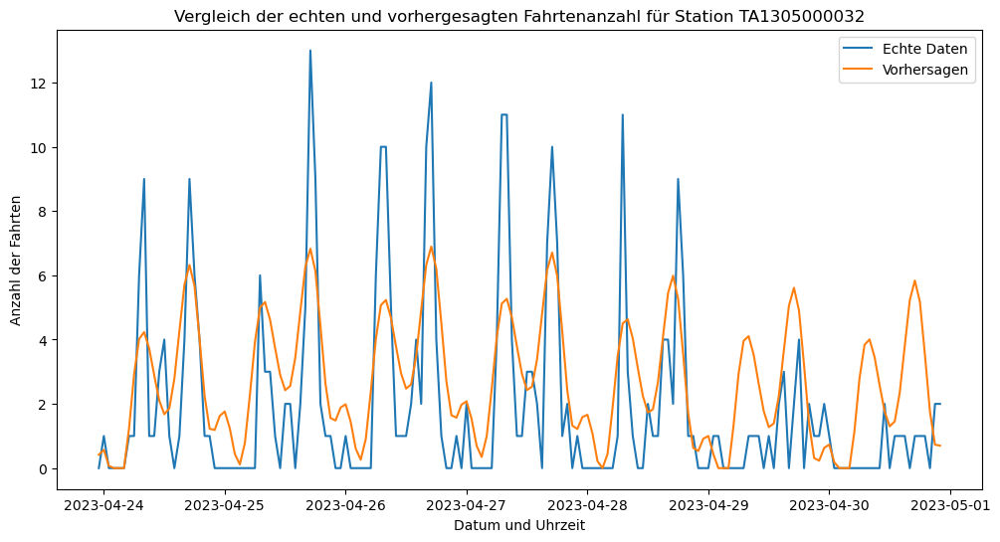

13:24:01 - cmdstanpy - INFO - Chain [1] start processing
13:24:01 - cmdstanpy - INFO - Chain [1] done processing


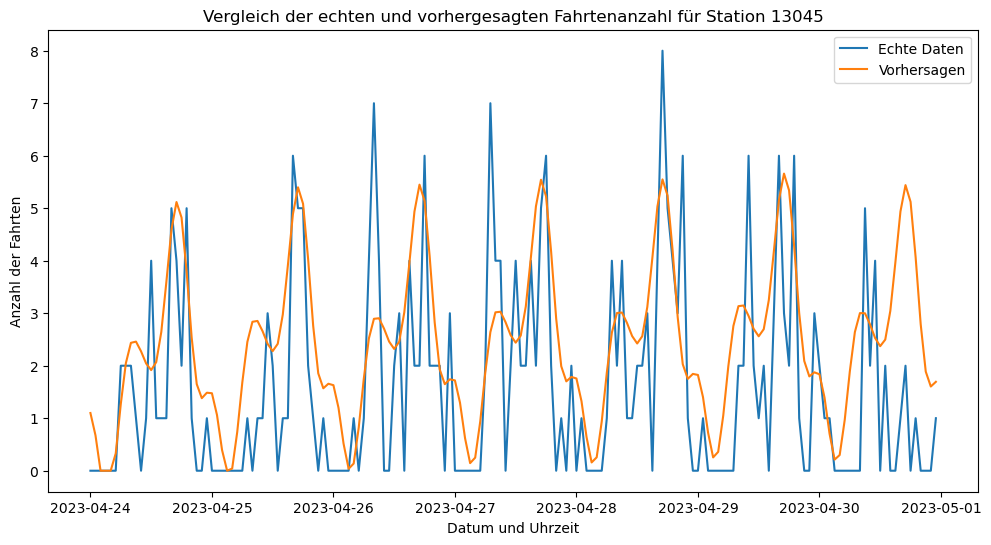

13:24:04 - cmdstanpy - INFO - Chain [1] start processing
13:24:04 - cmdstanpy - INFO - Chain [1] done processing


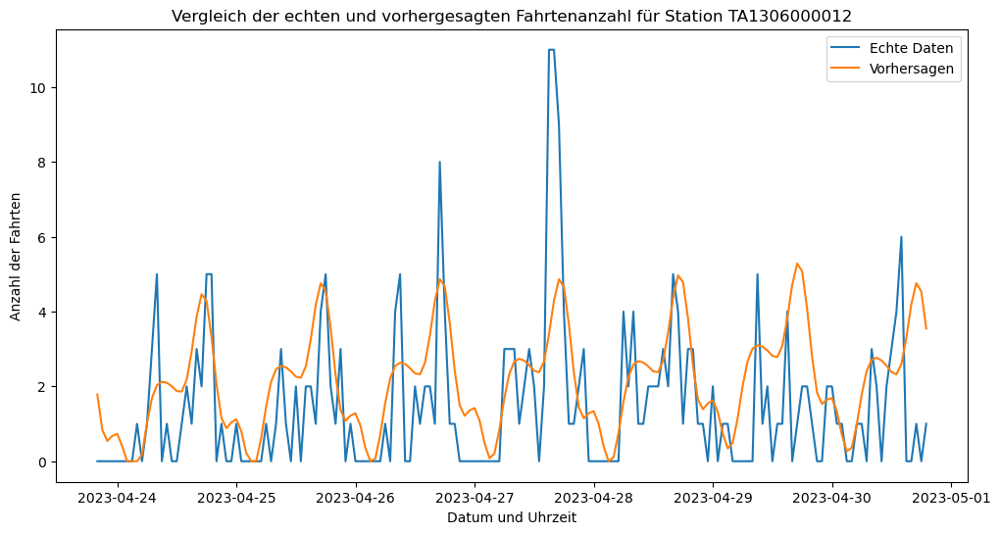

13:24:07 - cmdstanpy - INFO - Chain [1] start processing
13:24:07 - cmdstanpy - INFO - Chain [1] done processing


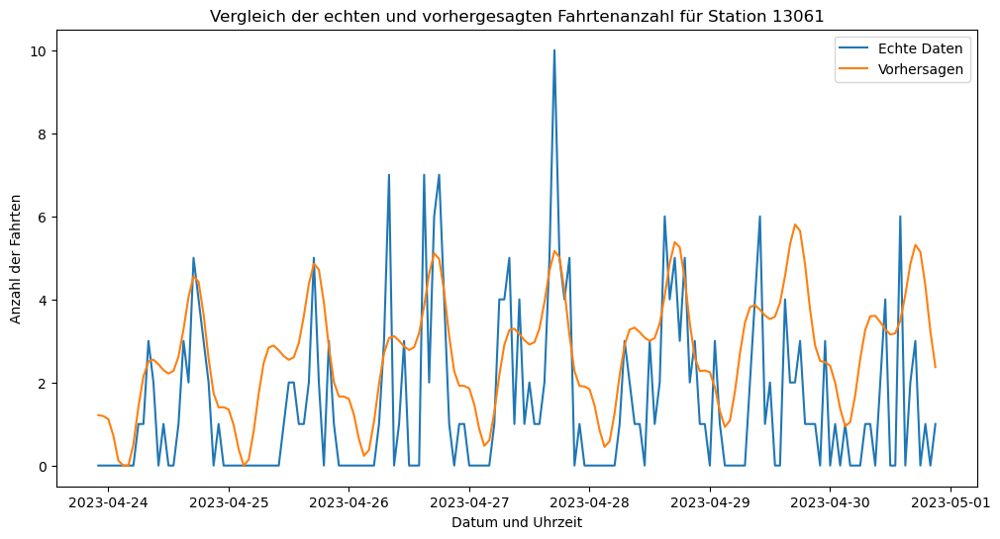

13:24:10 - cmdstanpy - INFO - Chain [1] start processing
13:24:10 - cmdstanpy - INFO - Chain [1] done processing


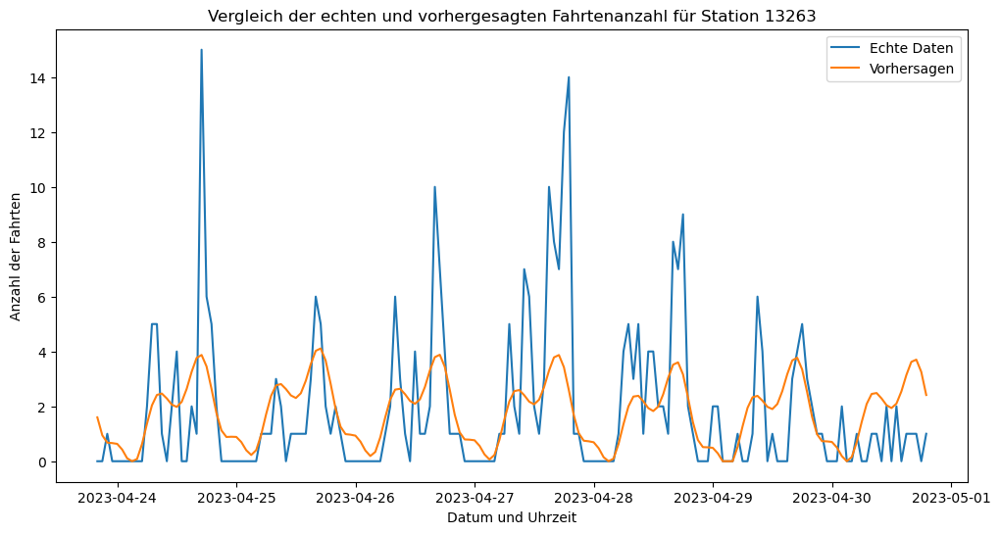

13:24:13 - cmdstanpy - INFO - Chain [1] start processing
13:24:13 - cmdstanpy - INFO - Chain [1] done processing


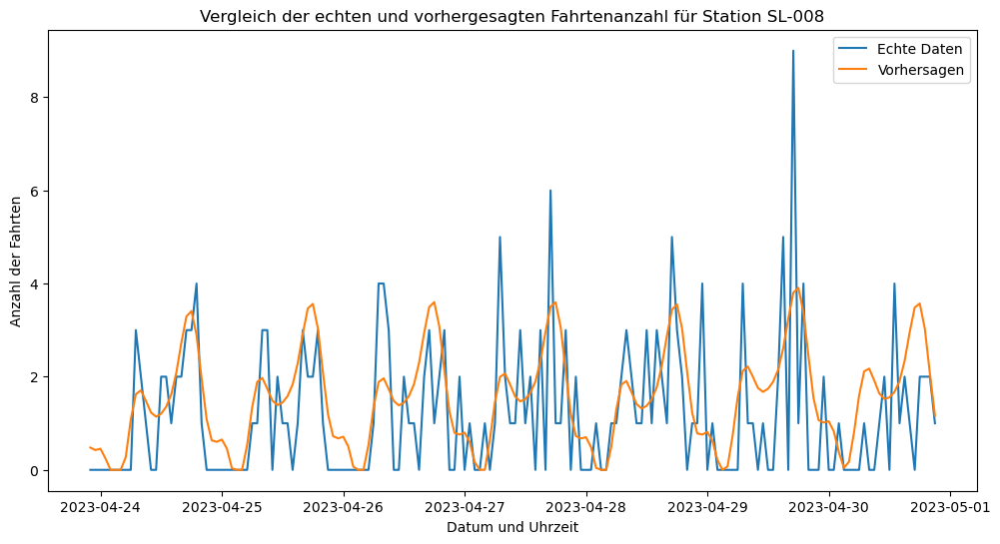

13:24:16 - cmdstanpy - INFO - Chain [1] start processing
13:24:16 - cmdstanpy - INFO - Chain [1] done processing


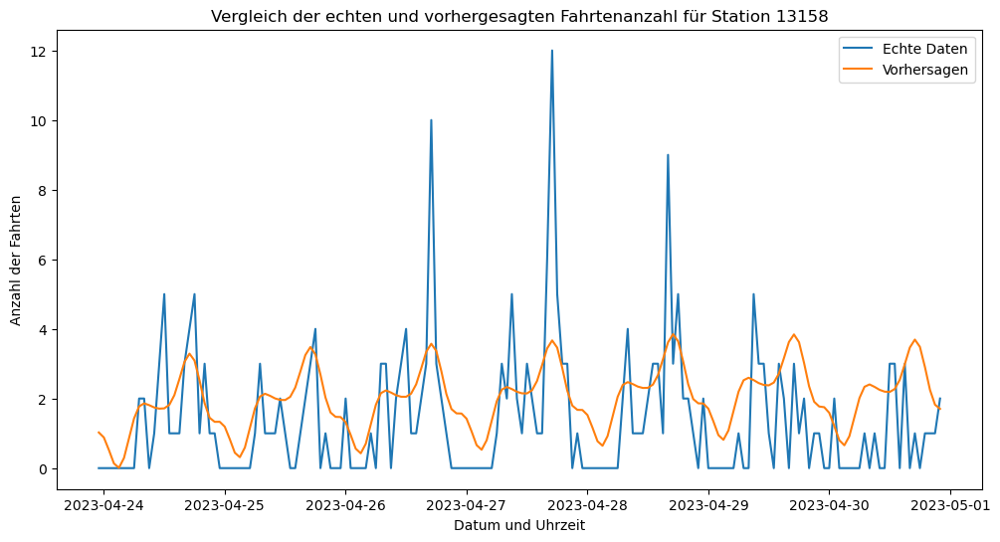

13:24:18 - cmdstanpy - INFO - Chain [1] start processing
13:24:19 - cmdstanpy - INFO - Chain [1] done processing


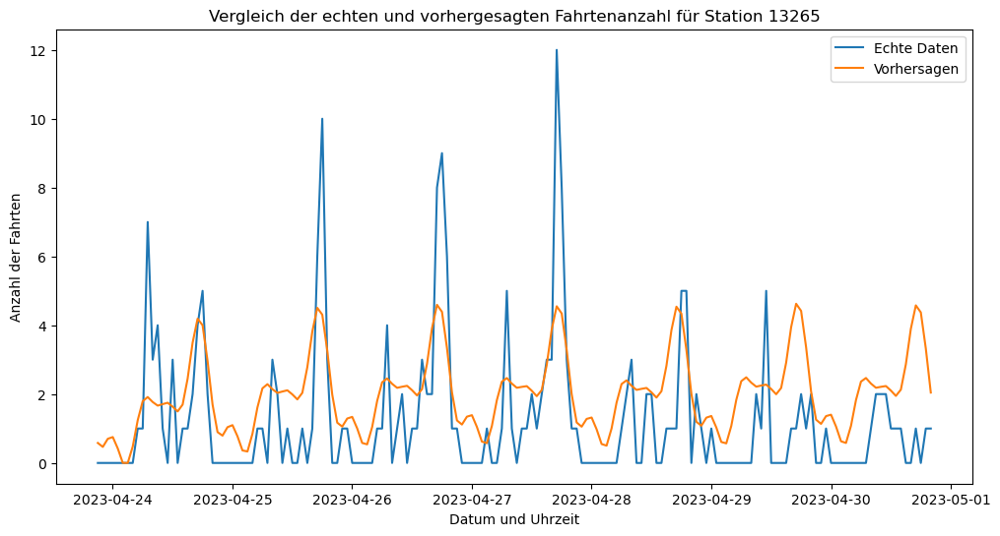

13:24:21 - cmdstanpy - INFO - Chain [1] start processing
13:24:22 - cmdstanpy - INFO - Chain [1] done processing


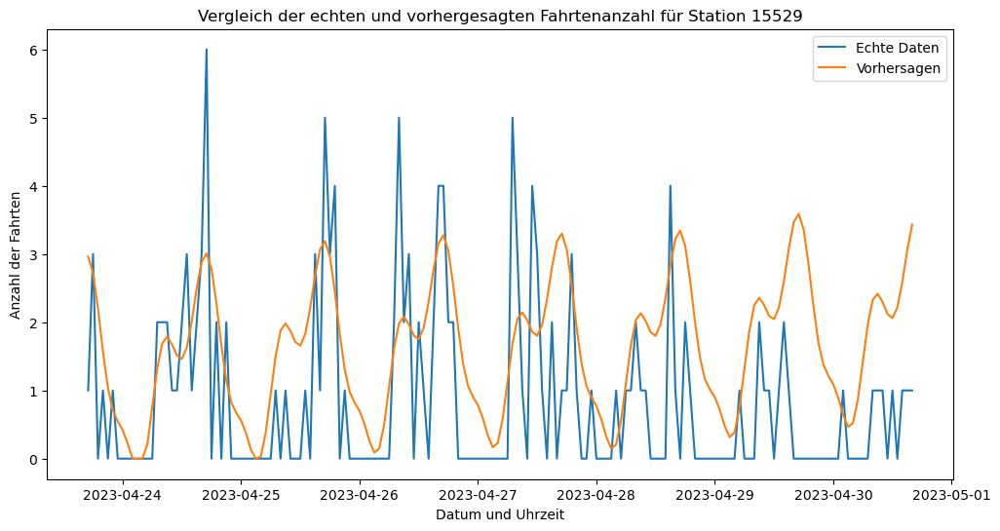

13:24:24 - cmdstanpy - INFO - Chain [1] start processing
13:24:24 - cmdstanpy - INFO - Chain [1] done processing


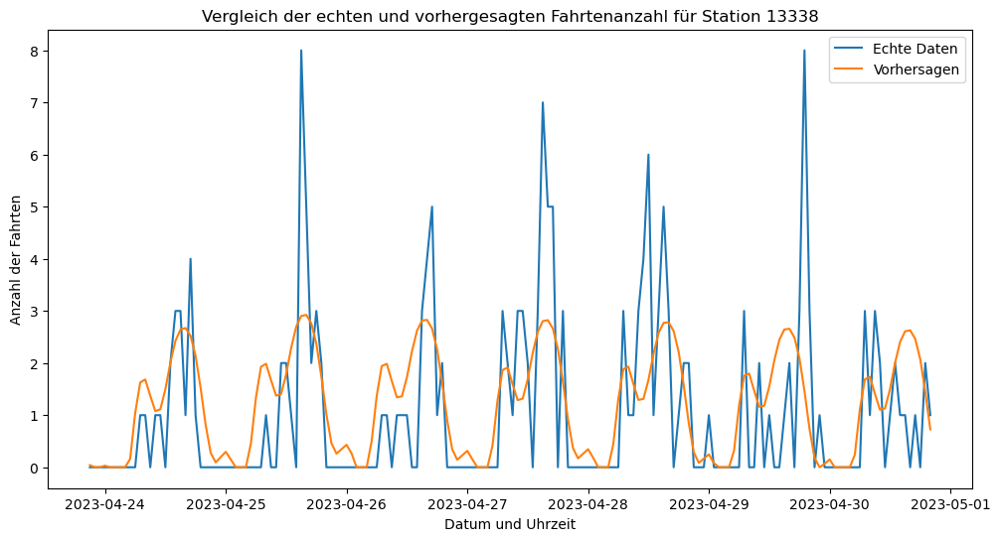

13:24:27 - cmdstanpy - INFO - Chain [1] start processing
13:24:28 - cmdstanpy - INFO - Chain [1] done processing


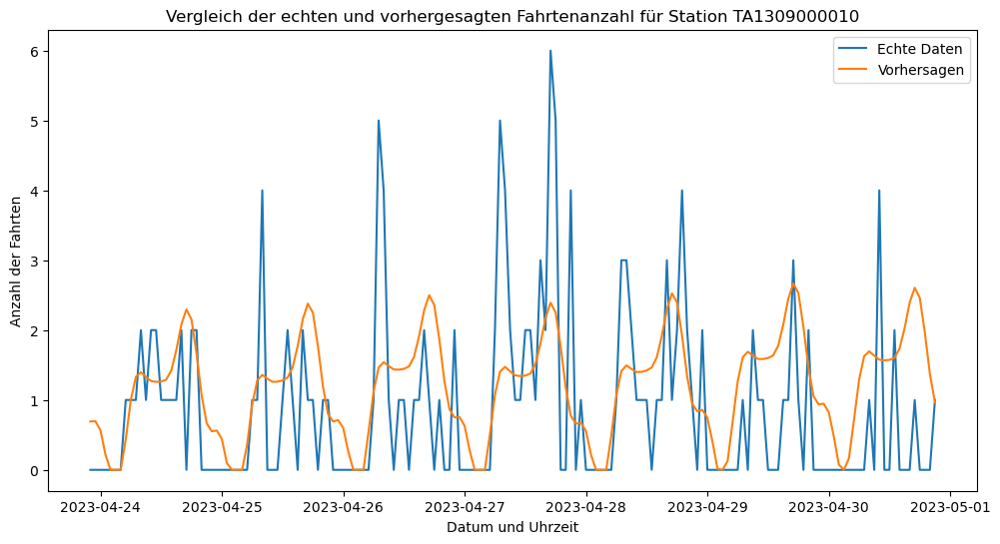

13:24:30 - cmdstanpy - INFO - Chain [1] start processing
13:24:31 - cmdstanpy - INFO - Chain [1] done processing


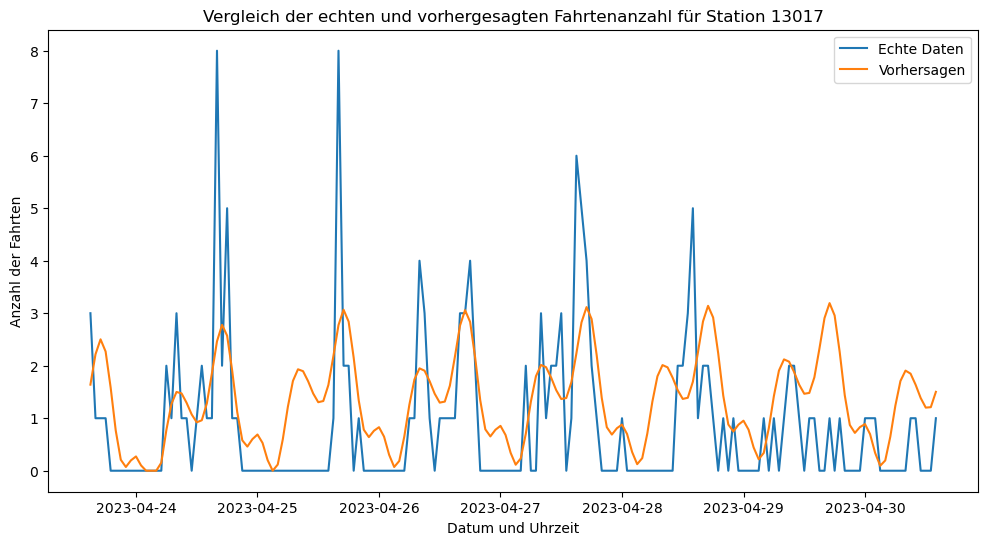

13:24:33 - cmdstanpy - INFO - Chain [1] start processing
13:24:34 - cmdstanpy - INFO - Chain [1] done processing


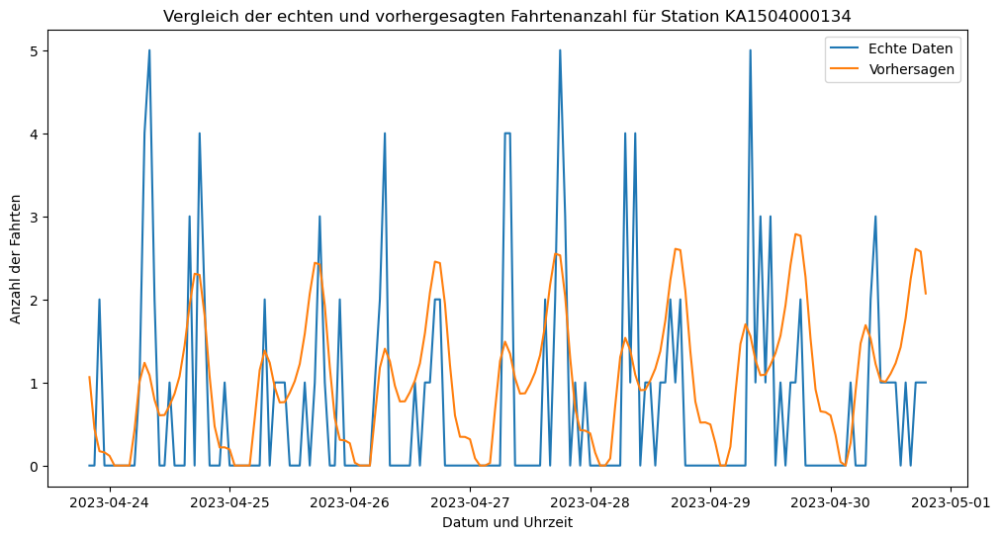

13:24:36 - cmdstanpy - INFO - Chain [1] start processing
13:24:37 - cmdstanpy - INFO - Chain [1] done processing


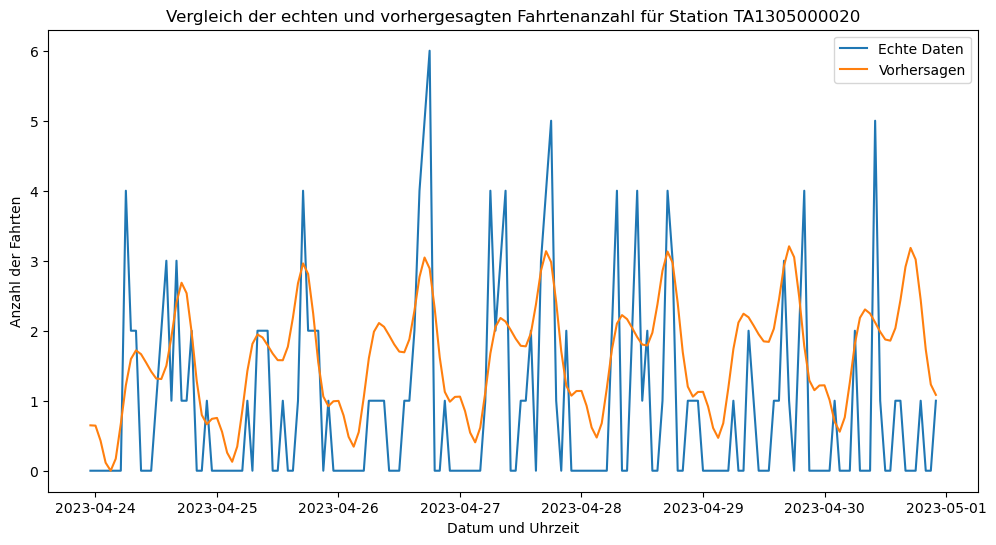

13:24:39 - cmdstanpy - INFO - Chain [1] start processing
13:24:39 - cmdstanpy - INFO - Chain [1] done processing


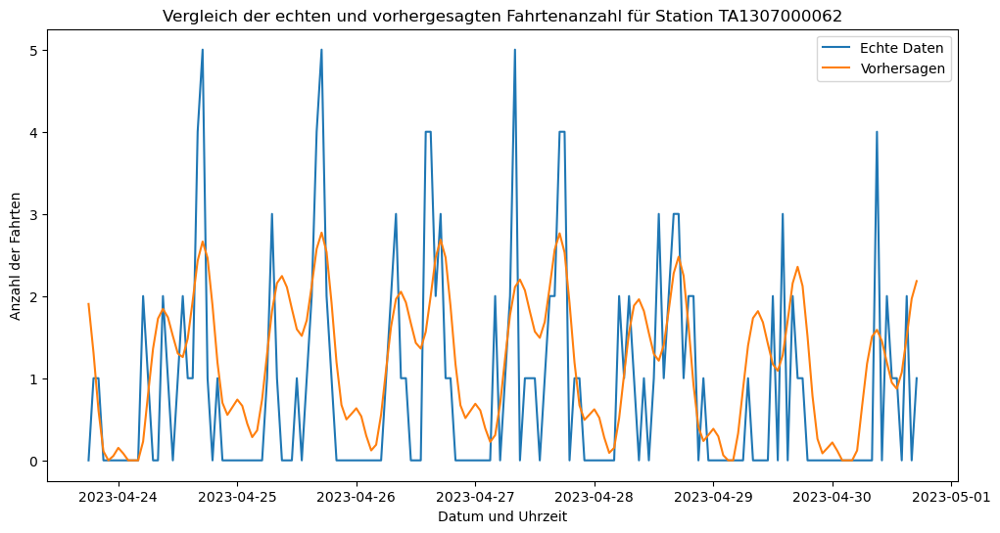

13:24:42 - cmdstanpy - INFO - Chain [1] start processing
13:24:42 - cmdstanpy - INFO - Chain [1] done processing


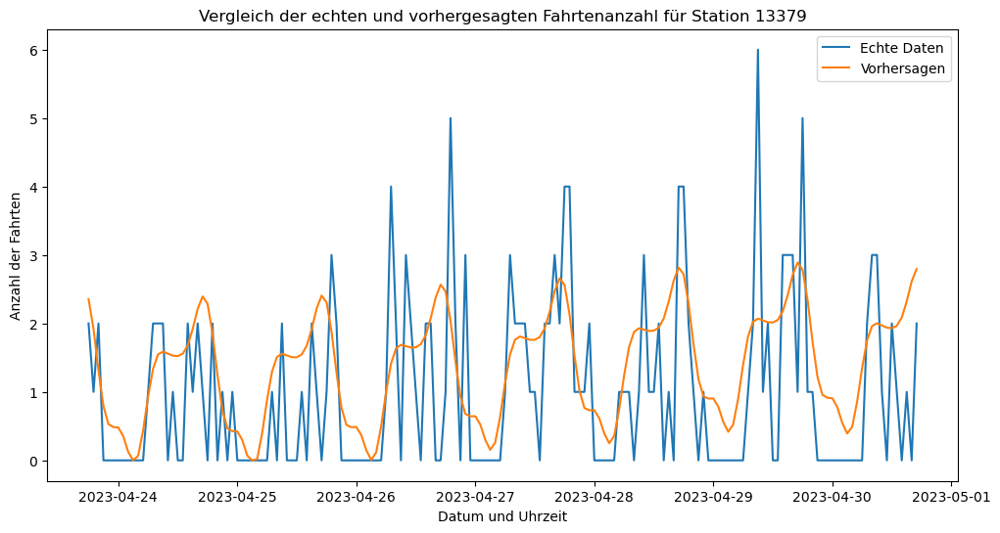

13:24:45 - cmdstanpy - INFO - Chain [1] start processing
13:24:45 - cmdstanpy - INFO - Chain [1] done processing


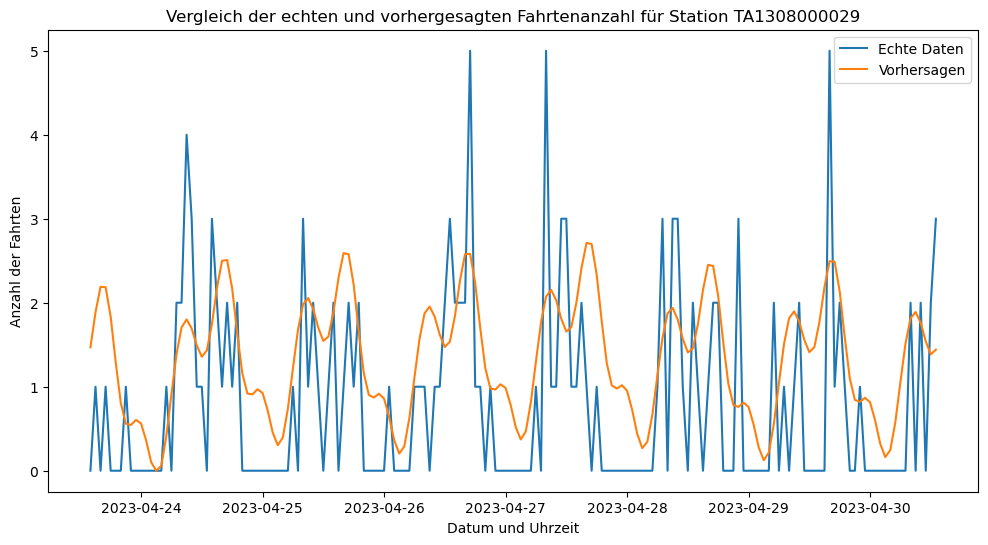

13:24:48 - cmdstanpy - INFO - Chain [1] start processing
13:24:48 - cmdstanpy - INFO - Chain [1] done processing


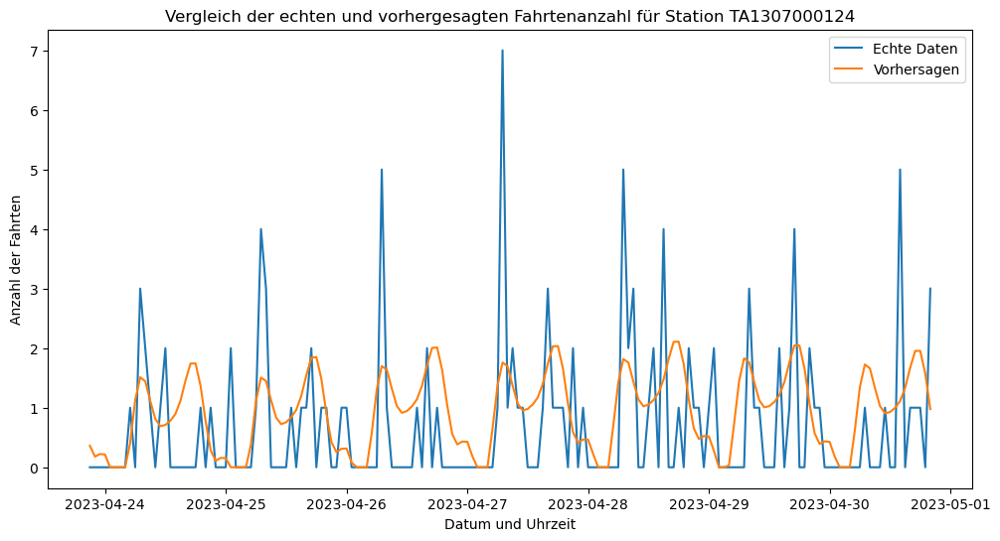

13:24:51 - cmdstanpy - INFO - Chain [1] start processing
13:24:51 - cmdstanpy - INFO - Chain [1] done processing


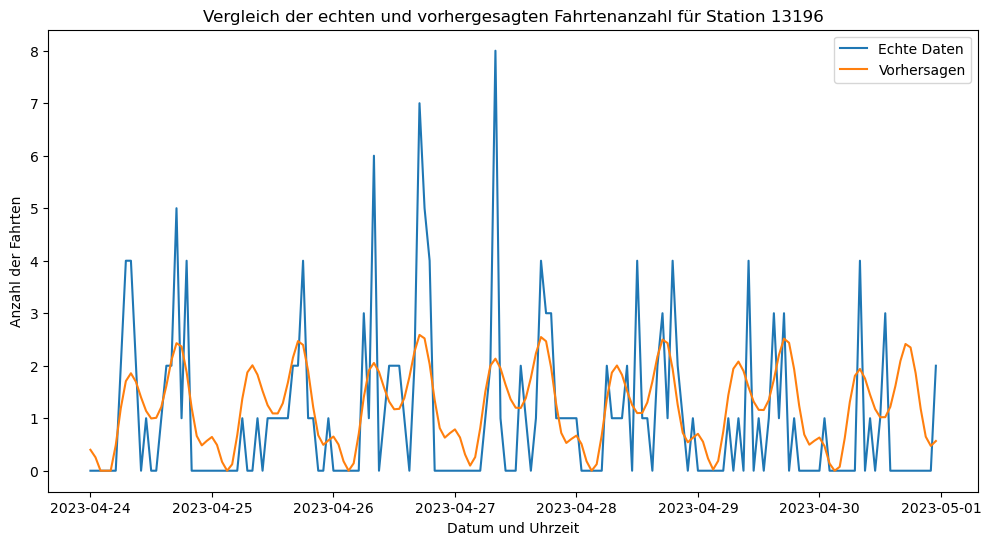

13:24:53 - cmdstanpy - INFO - Chain [1] start processing
13:24:54 - cmdstanpy - INFO - Chain [1] done processing


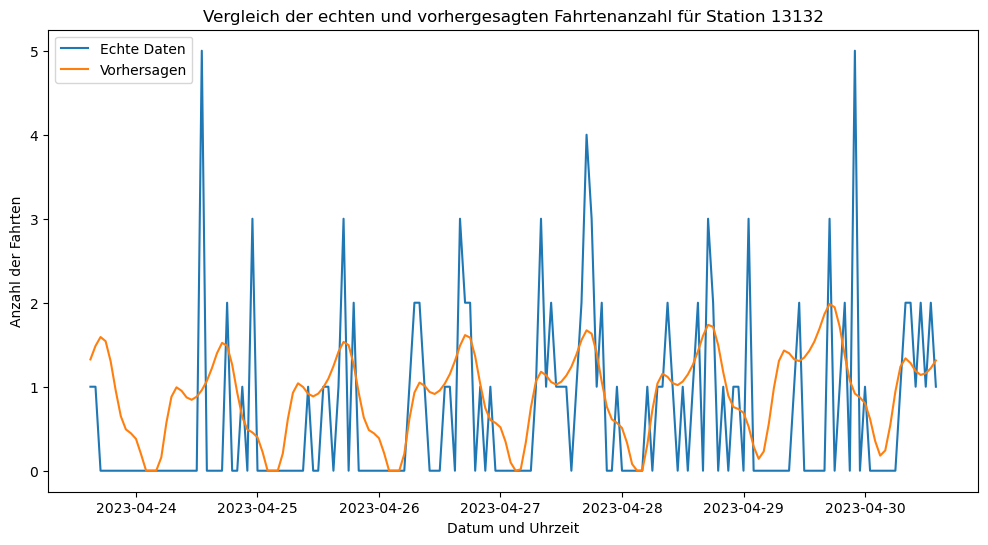

In [193]:
import numpy as np
df = pd.read_csv('/Users/mariu/Desktop/Masterarbeit/archive/data_start.csv')
# DataFrame vorbereiten und wichtige Spalten hinzufügen
df = df.copy()
df['started_at'] = pd.to_datetime(df['started_at'])
df['hour'] = df['started_at'].dt.hour
df['weekday'] = df['started_at'].dt.dayofweek
df['weekday_hour'] = df['weekday'].astype(str) + "_" + df['hour'].astype(str).str.zfill(2)
df.reset_index(inplace=True)
def calculate_mape(y_true, y_pred):
    """
    Berechnet den Mean Absolute Percentage Error zwischen den tatsächlichen und vorhergesagten Werten.
    Vermeidet die Division durch Null, indem Null-Werte ausgeschlossen oder geringfügig angepasst werden.
    """
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero_mask = y_true != 0
    y_true = y_true[non_zero_mask]
    y_pred = y_pred[non_zero_mask]
    if len(y_true) == 0:  # Vermeiden von Division durch Null, falls keine gültigen Werte vorhanden sind
        return np.nan
    mape = np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    return mape

# Berechnung von MSE, MAE und MAPE innerhalb der Schleife für jede Station
for station_id in important_station_ids:
    station_data = df[df['start_station_id'] == station_id]
    hourly_data = station_data.resample('H', on='started_at').count()['ride_id'].reset_index(name='y')
    hourly_data.rename(columns={'started_at': 'ds'}, inplace=True)

    test_size = 168  # 7 Tage * 24 Stunden
    train_data = hourly_data[:-test_size]
    test_data = hourly_data[-test_size:]

    model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
    model.fit(train_data)

    future = model.make_future_dataframe(periods=test_size, freq='H')
    forecast = model.predict(future)
    forecast['yhat'] = forecast['yhat'].clip(lower=0)

    forecasted_values = forecast['yhat'][-test_size:]
    forecasts_approach1[station_id] = forecasted_values.reset_index(drop=True)

    actual_values = test_data['y']
    mse = mean_squared_error(actual_values, forecasted_values)
    mae = mean_absolute_error(actual_values, forecasted_values)
    mape = calculate_mape(actual_values, forecasted_values)  # MAPE hinzufügen

    evaluation_results1[station_id] = {'MSE': mse, 'MAE': mae, 'MAPE': mape}

    plt.figure(figsize=(12, 6))
    plt.plot(test_data['ds'], actual_values, label='Echte Daten')
    plt.plot(test_data['ds'], forecasted_values, label='Vorhersagen')
    plt.title(f"Vergleich der echten und vorhergesagten Fahrtenanzahl für Station {station_id}")
    plt.xlabel('Datum und Uhrzeit')
    plt.ylabel('Anzahl der Fahrten')
    plt.legend()
    plt.show()


In [194]:
evaluation_results1

{'WL-012': {'MSE': 13.26021523825008,
  'MAE': 2.4827001807513516,
  'MAPE': 96.81868081855391},
 '13016': {'MSE': 3.4540183502048234,
  'MAE': 1.2847839745272283,
  'MAPE': 96.28760528026768},
 '13001': {'MSE': 2.856773538230604,
  'MAE': 1.2293900575368024,
  'MAPE': 52.3475943190966},
 '13430': {'MSE': 4.486766619822307,
  'MAE': 1.5397281088162487,
  'MAPE': 87.39922703218181},
 '13011': {'MSE': 7.09567863842317,
  'MAE': 1.9012014535571768,
  'MAPE': 90.5865890146665},
 'TA1305000011': {'MSE': 3.0629350627529845,
  'MAE': 1.343777472894864,
  'MAPE': 65.50396865989786},
 'TA1307000151': {'MSE': 4.9673568487299935,
  'MAE': 1.6042656392493755,
  'MAPE': 83.10662935891106},
 '15544': {'MSE': 9.2505921709811,
  'MAE': 1.6411810563458982,
  'MAPE': 101.19304055326639},
 '13022': {'MSE': 27.766310049840133,
  'MAE': 3.3093159241145584,
  'MAPE': 206.82247029337063},
 '13300': {'MSE': 12.630308135627107,
  'MAE': 2.333439357068573,
  'MAPE': 126.05699536511523},
 '13042': {'MSE': 10.759

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_1372/3607229900.py:11: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  important_stations_df = station_counts[station_counts.groupby('cluster')['cumulative_percentage'].apply(lambda x: x <= threshold)]
10:30:58 - cmdstanpy - INFO - Chain [1] start processing
10:30:58 - cmdstanpy - INFO - Chain [1] done processing


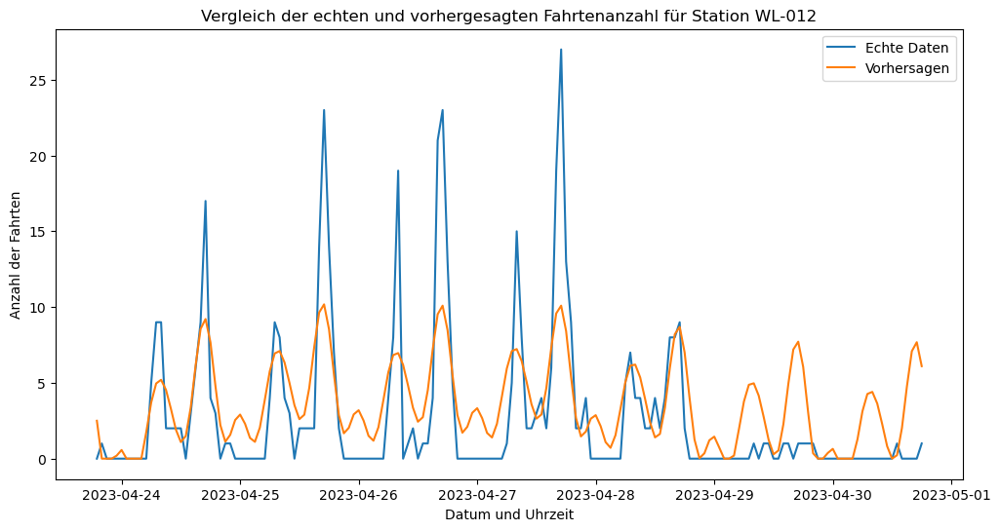

10:31:00 - cmdstanpy - INFO - Chain [1] start processing
10:31:00 - cmdstanpy - INFO - Chain [1] done processing


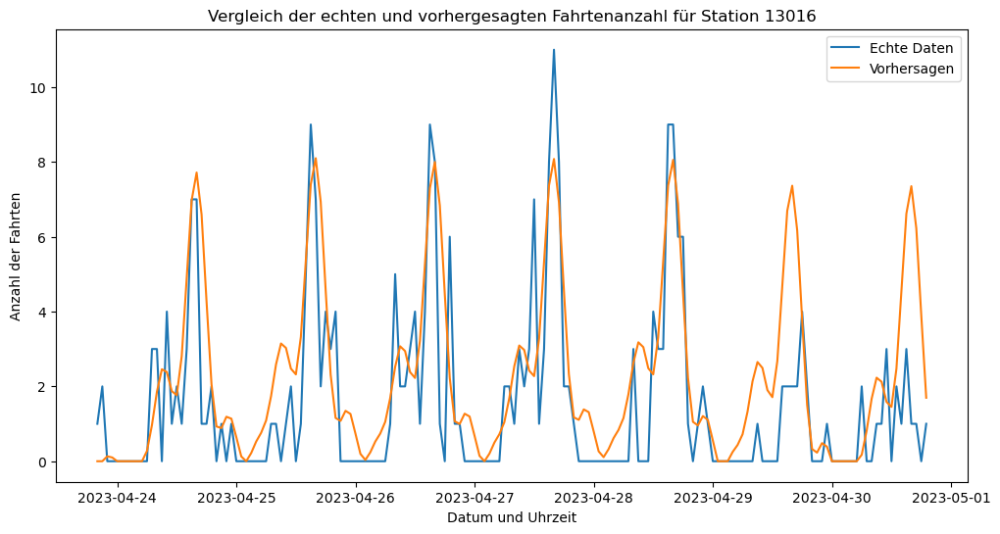

10:31:02 - cmdstanpy - INFO - Chain [1] start processing
10:31:02 - cmdstanpy - INFO - Chain [1] done processing


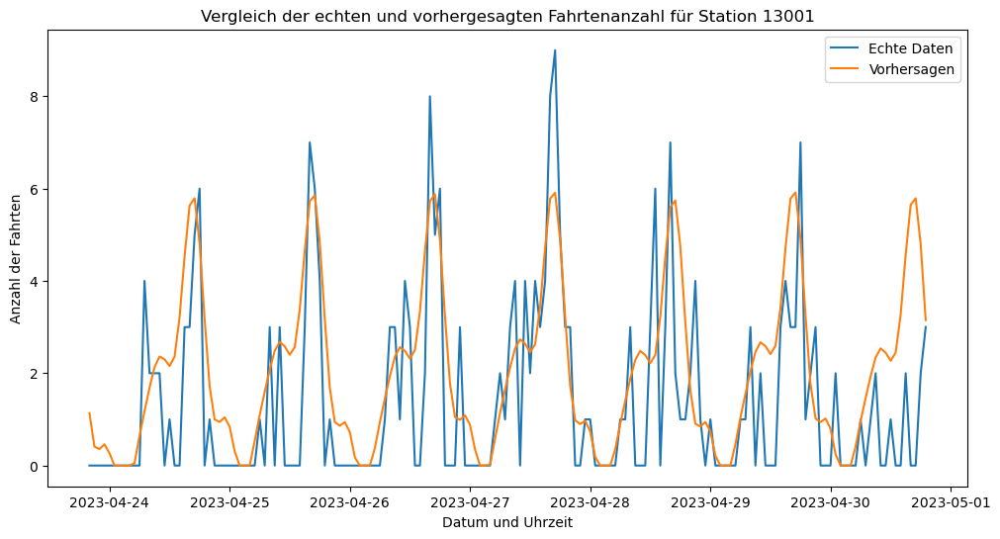

10:31:05 - cmdstanpy - INFO - Chain [1] start processing
10:31:05 - cmdstanpy - INFO - Chain [1] done processing


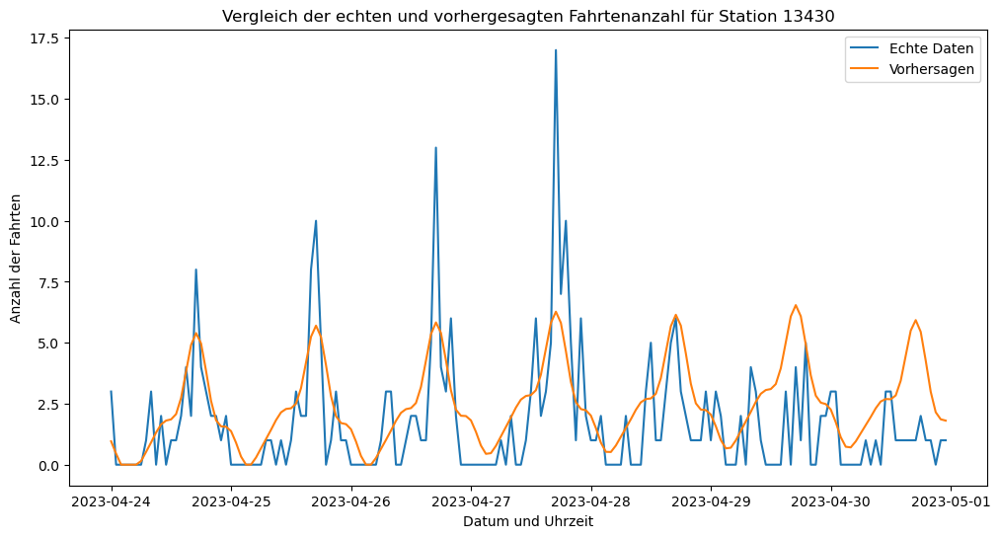

10:31:07 - cmdstanpy - INFO - Chain [1] start processing
10:31:07 - cmdstanpy - INFO - Chain [1] done processing


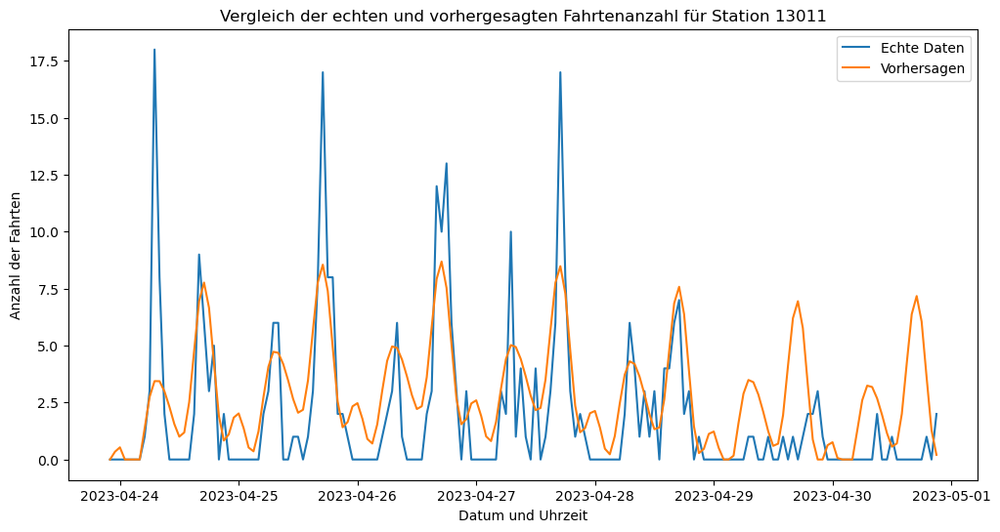

10:31:09 - cmdstanpy - INFO - Chain [1] start processing
10:31:09 - cmdstanpy - INFO - Chain [1] done processing


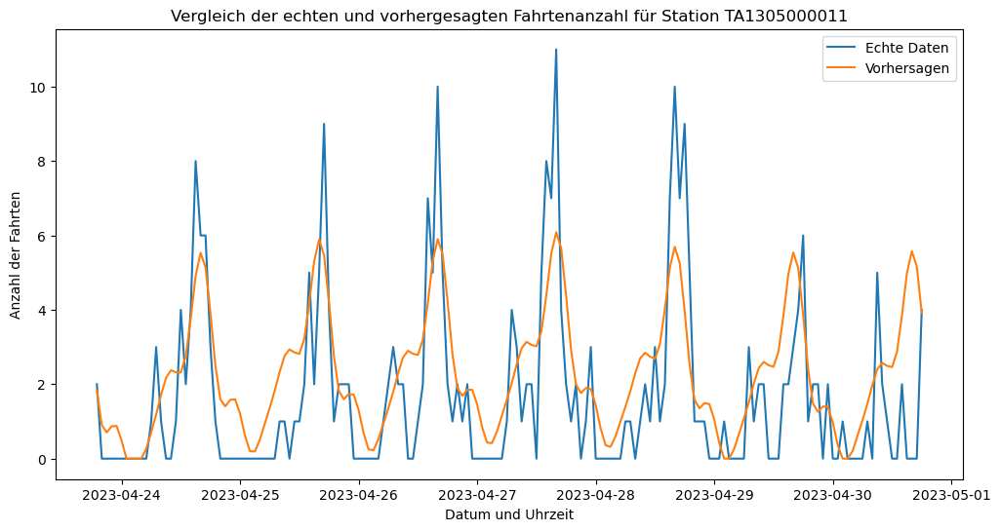

10:31:11 - cmdstanpy - INFO - Chain [1] start processing
10:31:11 - cmdstanpy - INFO - Chain [1] done processing


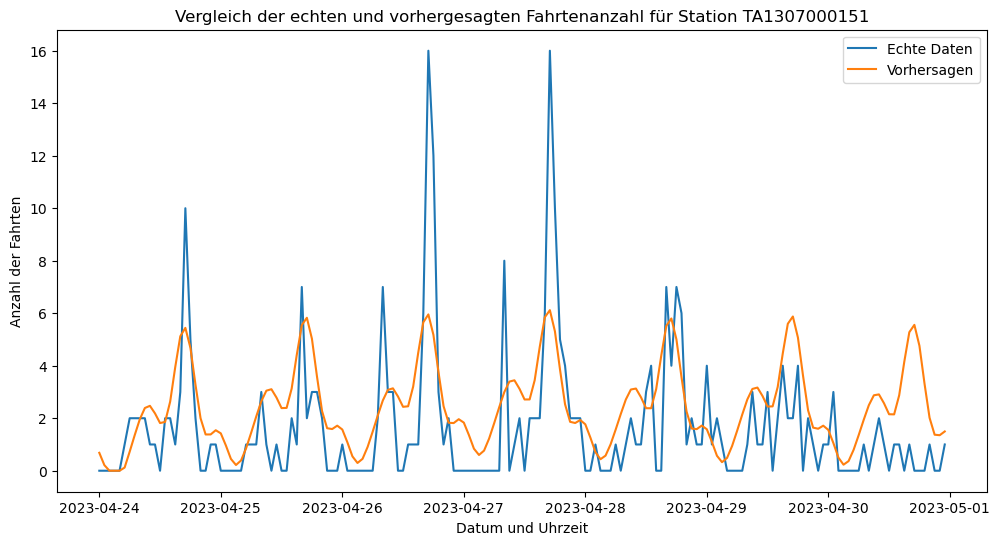

10:31:14 - cmdstanpy - INFO - Chain [1] start processing
10:31:14 - cmdstanpy - INFO - Chain [1] done processing


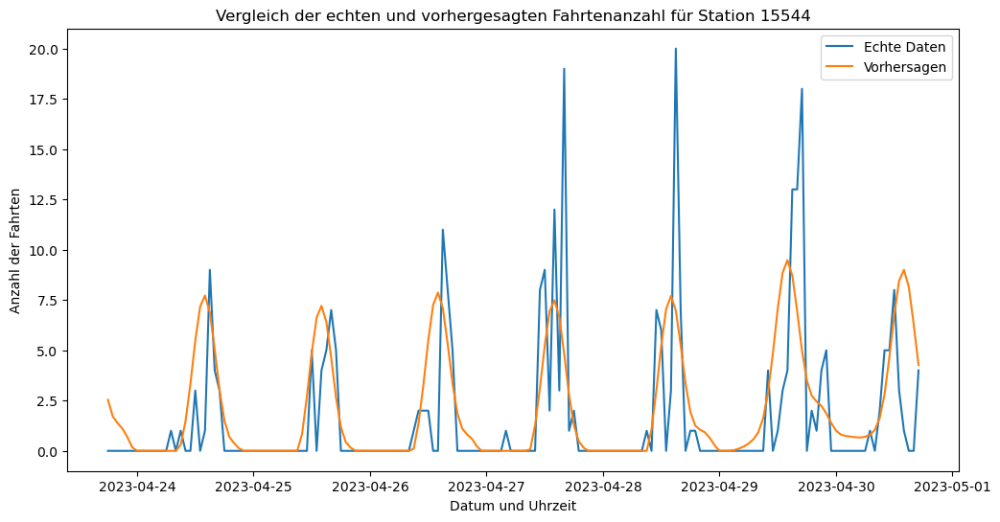

10:31:16 - cmdstanpy - INFO - Chain [1] start processing
10:31:16 - cmdstanpy - INFO - Chain [1] done processing


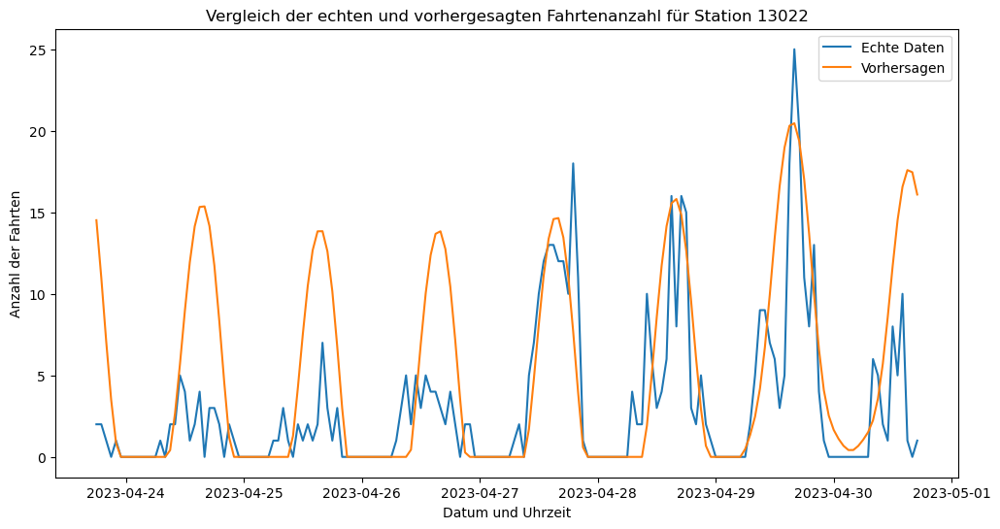

10:31:18 - cmdstanpy - INFO - Chain [1] start processing
10:31:18 - cmdstanpy - INFO - Chain [1] done processing


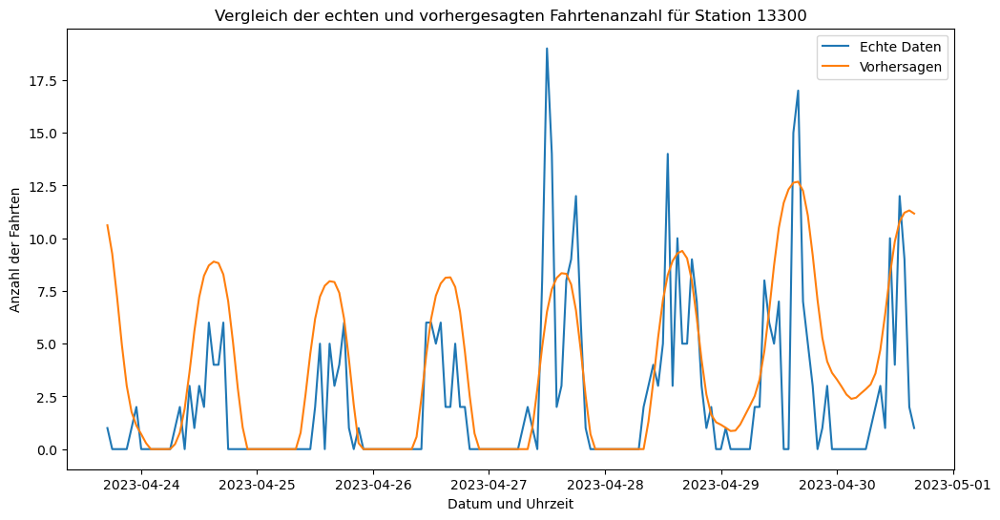

10:31:20 - cmdstanpy - INFO - Chain [1] start processing
10:31:20 - cmdstanpy - INFO - Chain [1] done processing


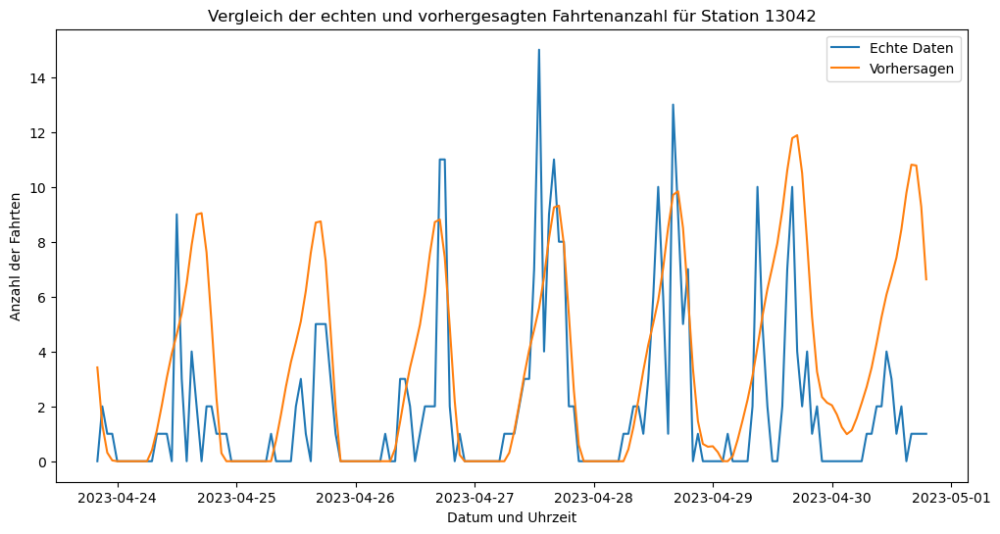

10:31:22 - cmdstanpy - INFO - Chain [1] start processing
10:31:23 - cmdstanpy - INFO - Chain [1] done processing


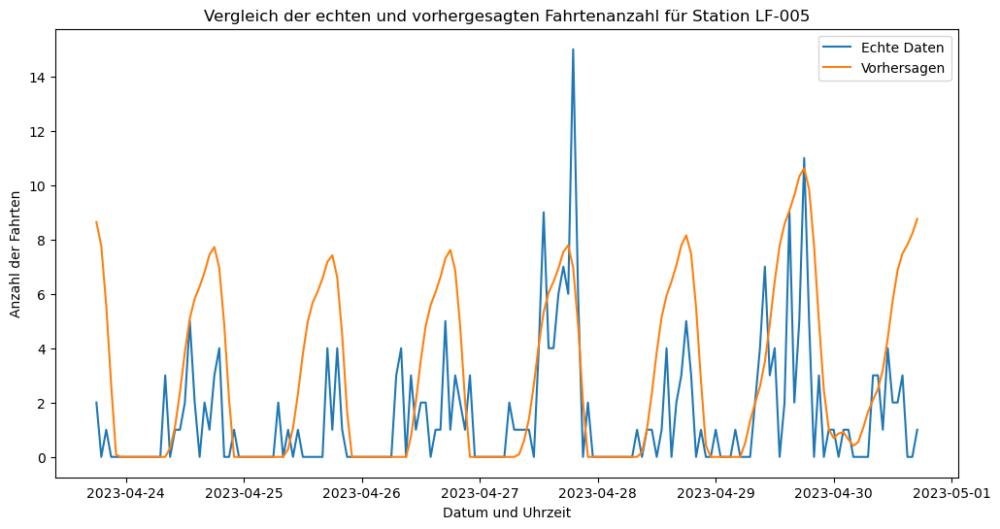

10:31:25 - cmdstanpy - INFO - Chain [1] start processing
10:31:25 - cmdstanpy - INFO - Chain [1] done processing


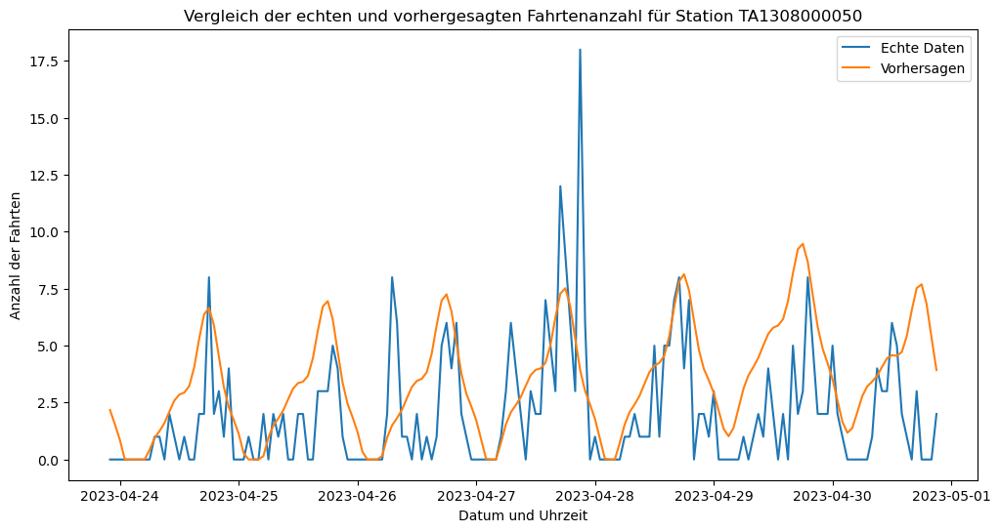

10:31:27 - cmdstanpy - INFO - Chain [1] start processing
10:31:27 - cmdstanpy - INFO - Chain [1] done processing


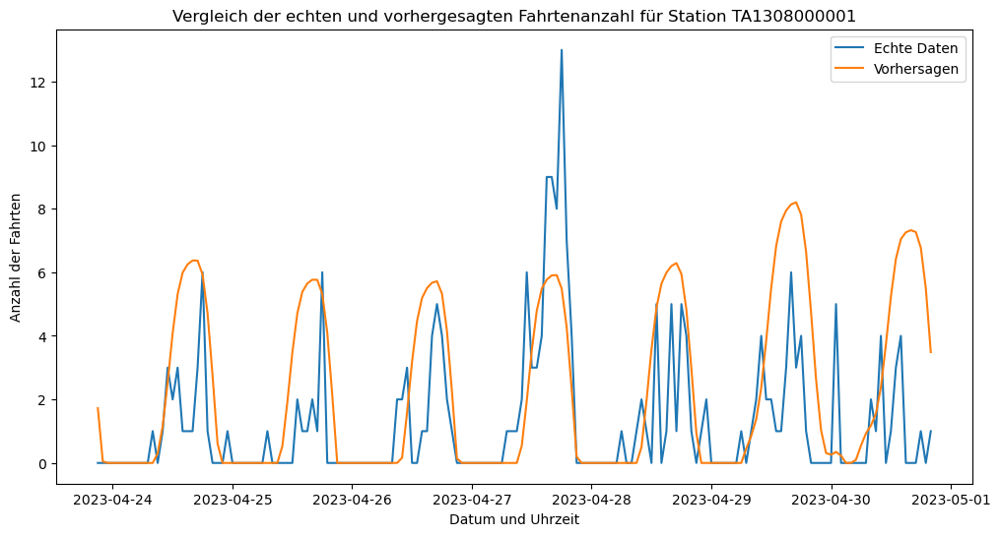

10:31:29 - cmdstanpy - INFO - Chain [1] start processing
10:31:29 - cmdstanpy - INFO - Chain [1] done processing


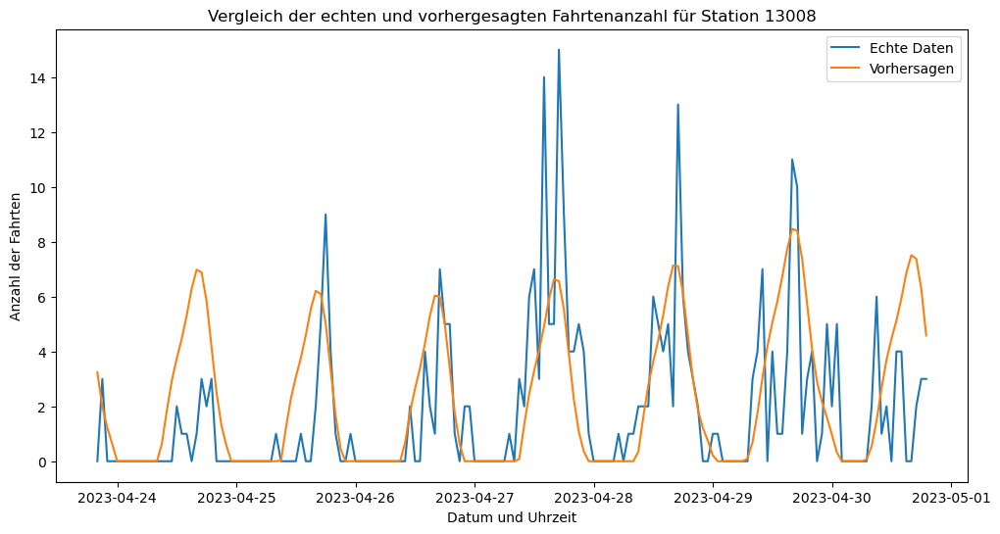

10:31:31 - cmdstanpy - INFO - Chain [1] start processing
10:31:32 - cmdstanpy - INFO - Chain [1] done processing


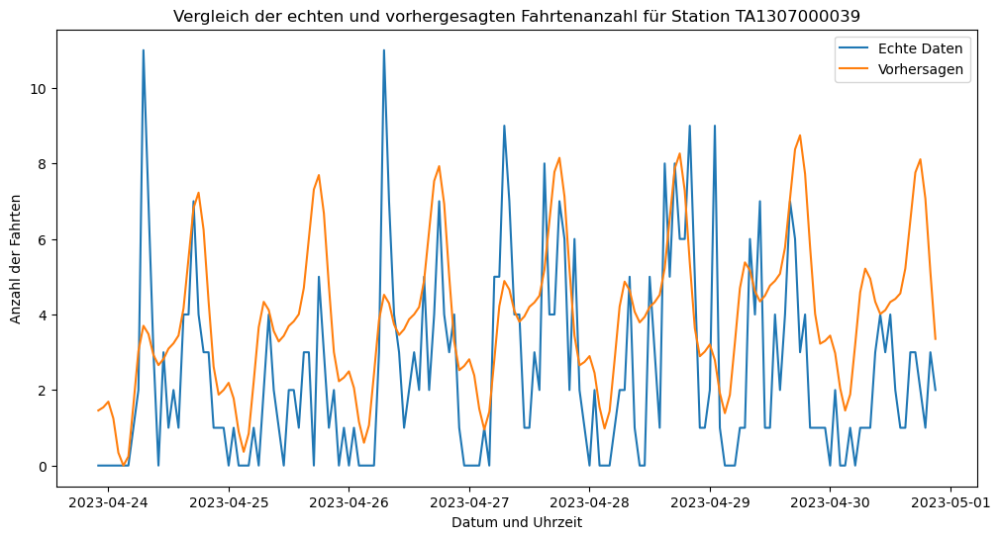

10:31:34 - cmdstanpy - INFO - Chain [1] start processing
10:31:34 - cmdstanpy - INFO - Chain [1] done processing


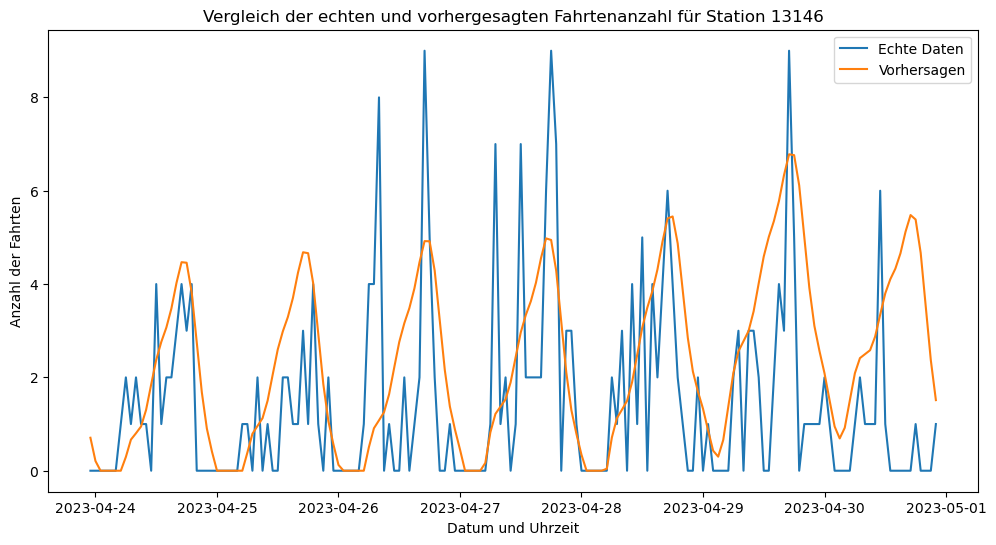

10:31:36 - cmdstanpy - INFO - Chain [1] start processing
10:31:36 - cmdstanpy - INFO - Chain [1] done processing


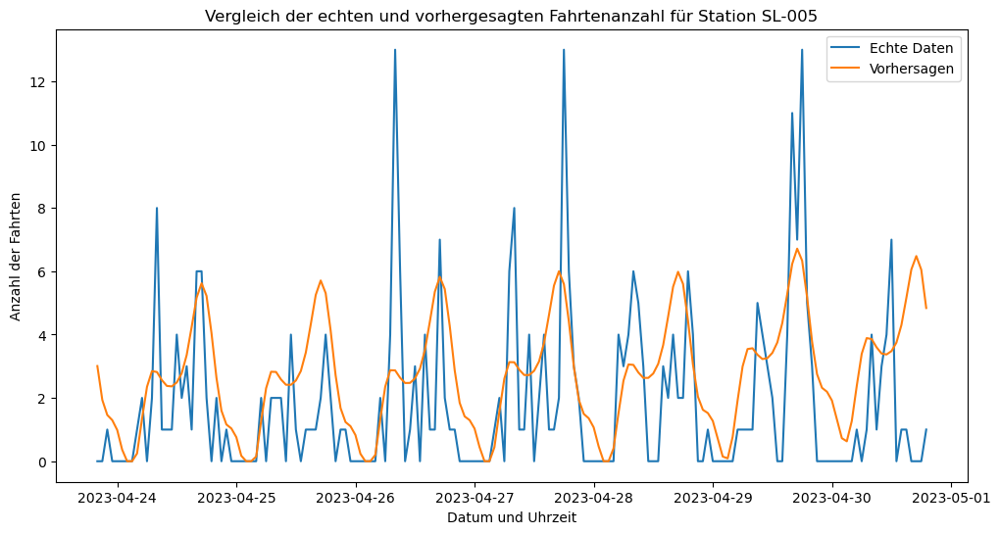

10:31:38 - cmdstanpy - INFO - Chain [1] start processing
10:31:38 - cmdstanpy - INFO - Chain [1] done processing


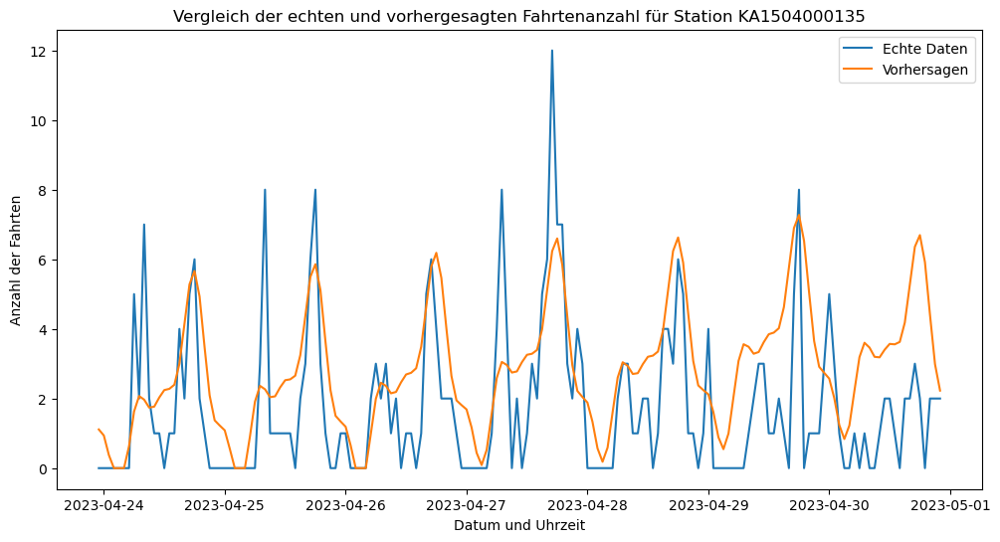

10:31:40 - cmdstanpy - INFO - Chain [1] start processing
10:31:41 - cmdstanpy - INFO - Chain [1] done processing


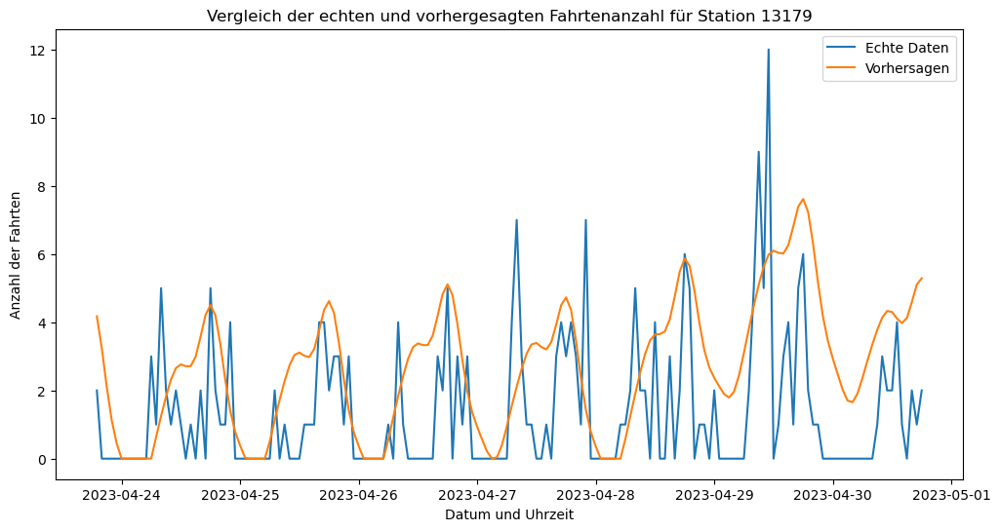

10:31:43 - cmdstanpy - INFO - Chain [1] start processing
10:31:43 - cmdstanpy - INFO - Chain [1] done processing


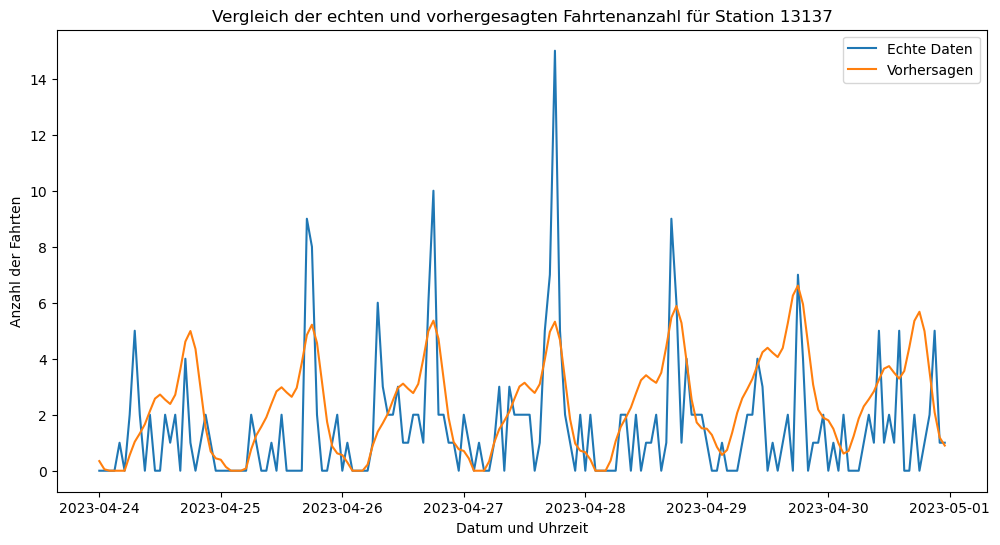

10:31:45 - cmdstanpy - INFO - Chain [1] start processing
10:31:45 - cmdstanpy - INFO - Chain [1] done processing


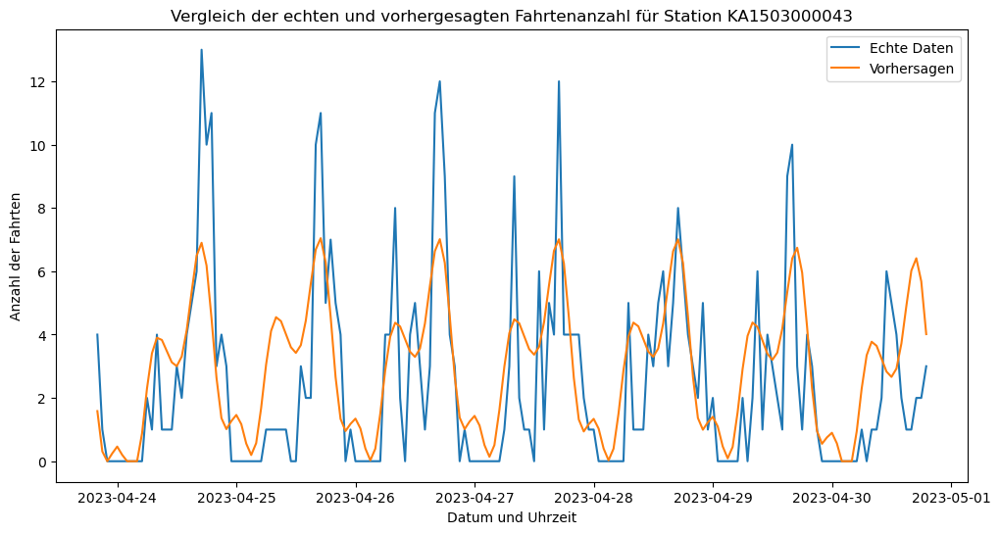

10:31:47 - cmdstanpy - INFO - Chain [1] start processing
10:31:48 - cmdstanpy - INFO - Chain [1] done processing


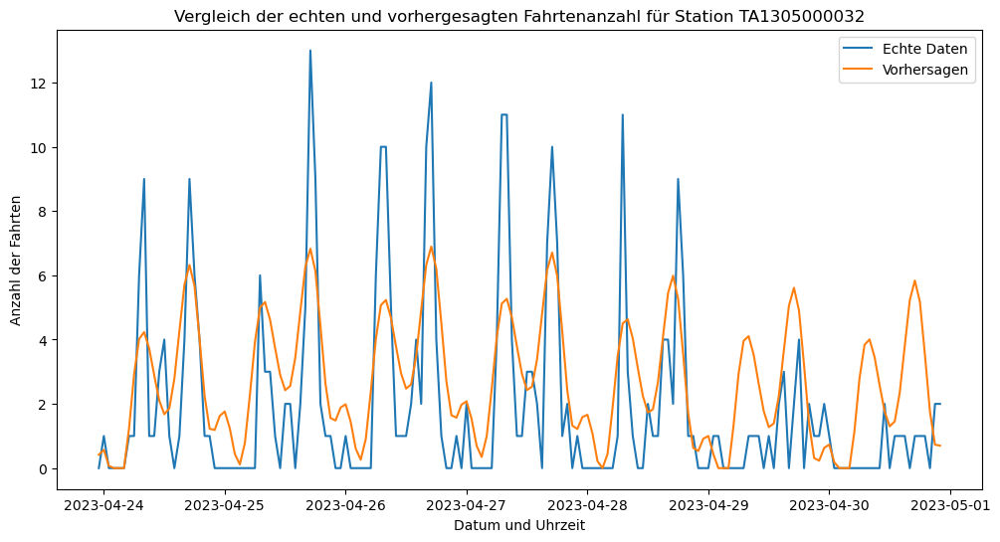

10:31:50 - cmdstanpy - INFO - Chain [1] start processing
10:31:50 - cmdstanpy - INFO - Chain [1] done processing


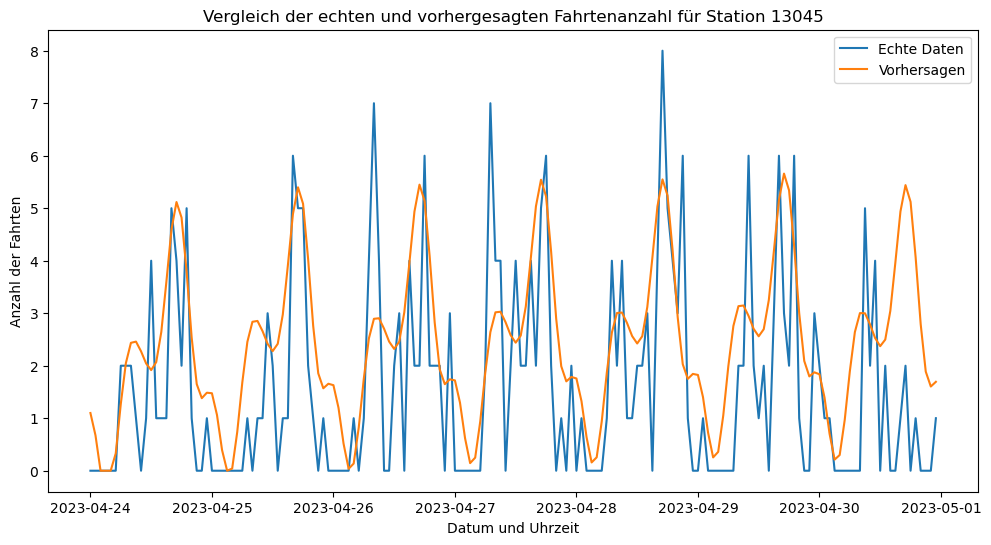

10:31:52 - cmdstanpy - INFO - Chain [1] start processing
10:31:52 - cmdstanpy - INFO - Chain [1] done processing


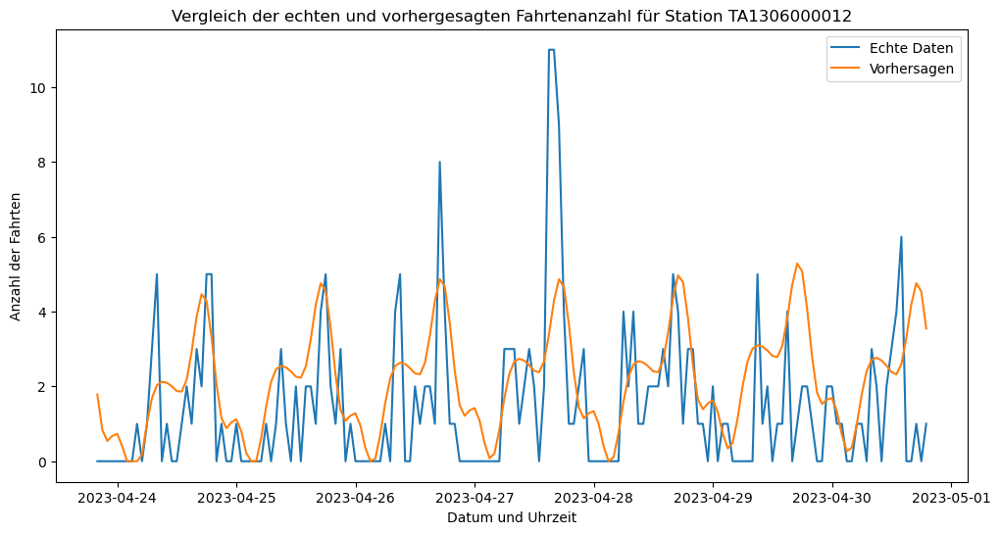

10:31:54 - cmdstanpy - INFO - Chain [1] start processing
10:31:54 - cmdstanpy - INFO - Chain [1] done processing


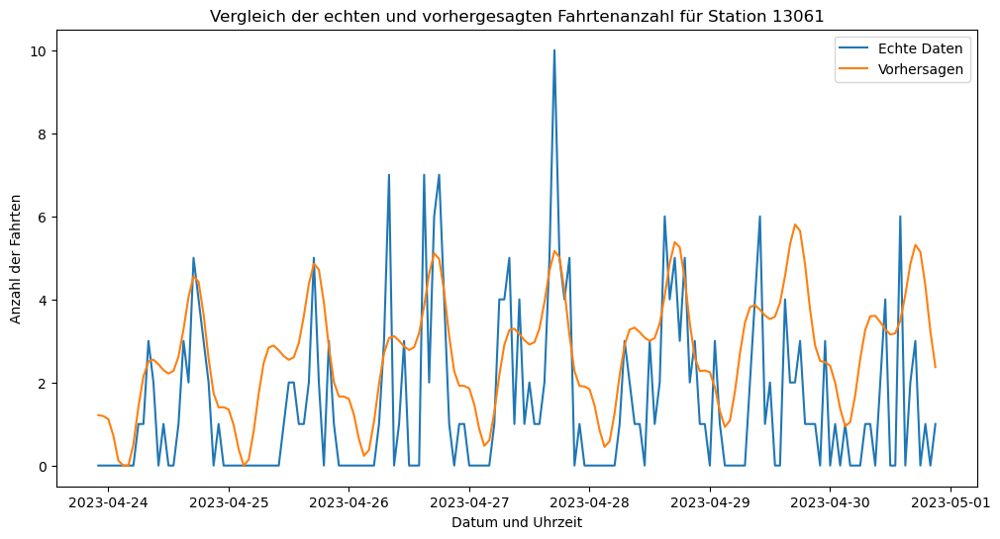

10:31:56 - cmdstanpy - INFO - Chain [1] start processing
10:31:57 - cmdstanpy - INFO - Chain [1] done processing


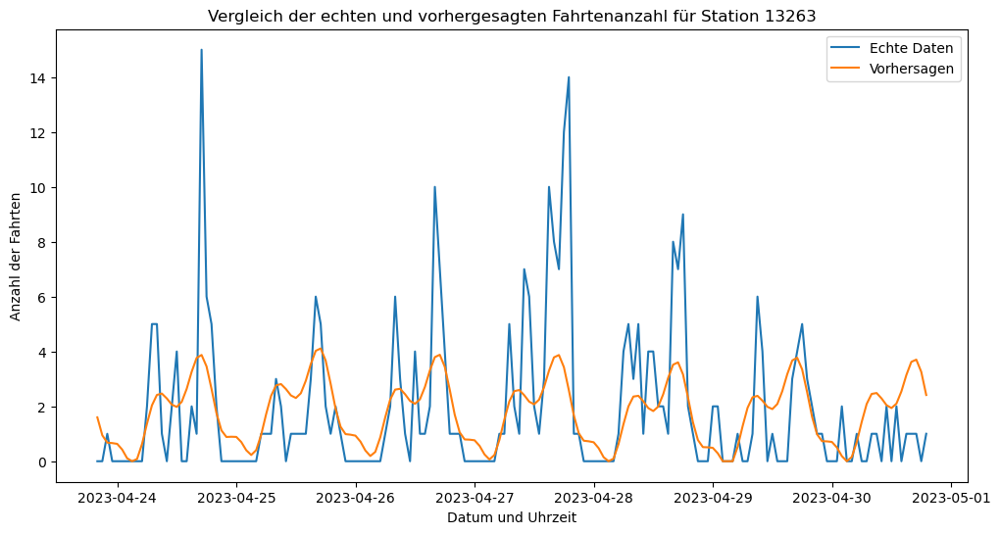

10:31:59 - cmdstanpy - INFO - Chain [1] start processing
10:31:59 - cmdstanpy - INFO - Chain [1] done processing


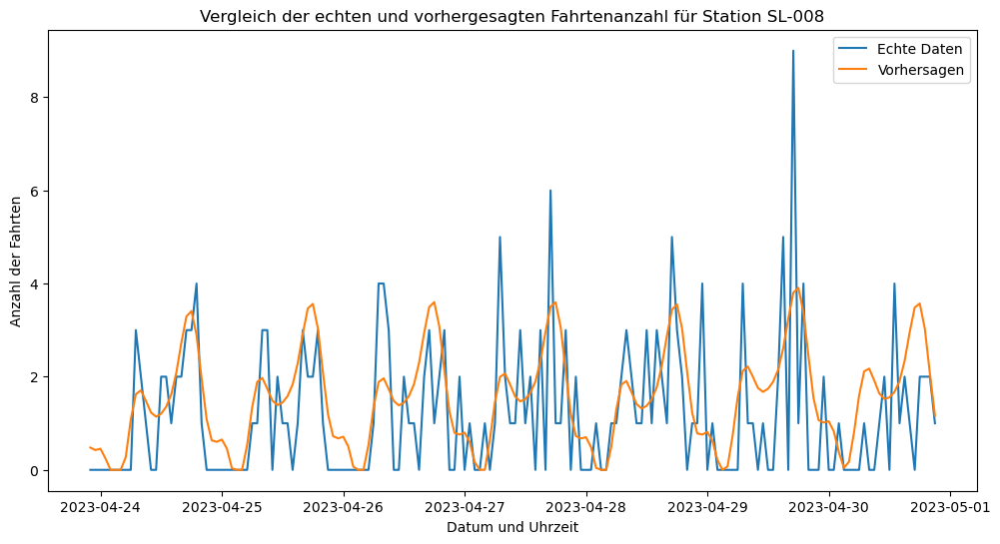

In [6]:
df = pd.read_csv('/Users/mariu/Desktop/Masterarbeit/archive/data_start.csv')
# DataFrame vorbereiten und wichtige Spalten hinzufügen
df = df.copy()
df['started_at'] = pd.to_datetime(df['started_at'])
df['hour'] = df['started_at'].dt.hour
df['weekday'] = df['started_at'].dt.dayofweek
df['weekday_hour'] = df['weekday'].astype(str) + "_" + df['hour'].astype(str).str.zfill(2)
df.reset_index(inplace=True)
# Identifizieren wichtiger Stationen basierend auf einem Schwellenwert
threshold = 20
important_stations_df = station_counts[station_counts.groupby('cluster')['cumulative_percentage'].apply(lambda x: x <= threshold)]
important_station_ids = important_stations_df['station'].unique()

# Speichern der Vorhersagen in einem Dictionary
forecasts_approach1 = {}
evaluation_results1 = {}

for station_id in important_station_ids:
    station_data = df[df['start_station_id'] == station_id]
    hourly_data = station_data.resample('H', on='started_at').count()['ride_id'].reset_index(name='y')
    hourly_data.rename(columns={'started_at': 'ds'}, inplace=True)

    test_size = 168  # 7 Tage * 24 Stunden
    train_data = hourly_data[:-test_size]
    test_data = hourly_data[-test_size:]

    model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
    model.fit(train_data)

    future = model.make_future_dataframe(periods=test_size, freq='H')
    forecast = model.predict(future)
    forecast['yhat'] = forecast['yhat'].clip(lower=0)

    forecasted_values = forecast['yhat'][-test_size:]
    forecasts_approach1[station_id] = forecasted_values.reset_index(drop=True)

    actual_values = test_data['y']
    mse = mean_squared_error(actual_values, forecasted_values)
    mae = mean_absolute_error(actual_values, forecasted_values)
    evaluation_results1[station_id] = {'MSE': mse, 'MAE': mae}

    plt.figure(figsize=(12, 6))
    plt.plot(test_data['ds'], actual_values, label='Echte Daten')
    plt.plot(test_data['ds'], forecasted_values, label='Vorhersagen')
    plt.title(f"Vergleich der echten und vorhergesagten Fahrtenanzahl für Station {station_id}")
    plt.xlabel('Datum und Uhrzeit')
    plt.ylabel('Anzahl der Fahrten')
    plt.legend()
    plt.show()


In [8]:
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error
import pandas as pd

# Daten einlesen und vorbereiten
df = pd.read_csv('/Users/mariu/Desktop/Masterarbeit/archive/data_start.csv')
df['started_at'] = pd.to_datetime(df['started_at'])
df['hour'] = df['started_at'].dt.hour
df['weekday'] = df['started_at'].dt.dayofweek
df['weekday_hour'] = df['weekday'].astype(str) + "_" + df['hour'].astype(str).str.zfill(2)
df.reset_index(inplace=True)

# Annahme, dass `station_counts` und `cluster` korrekt definiert sind
important_stations_df = station_counts[station_counts.groupby('cluster')['cumulative_percentage'].apply(lambda x: x <= threshold)]
important_station_ids = important_stations_df['station'].unique()

# Kreuzvalidierung für jede wichtige Station
results = {}
for station_id in important_station_ids:
    station_data = df[df['start_station_id'] == station_id]
    hourly_data = station_data.resample('H', on='started_at').count()['ride_id'].reset_index(name='y')
    hourly_data.rename(columns={'started_at': 'ds'}, inplace=True)
    
    model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
    model.fit(hourly_data[['ds', 'y']])

    df_cv = cross_validation(model, initial='180 days', period='90 days', horizon='168 hours')  # Anpassen basierend auf verfügbaren Daten
    df_p = performance_metrics(df_cv)

    # Durchschnitt der Metriken berechnen
    mse_avg = df_p['mse'].mean()
    mae_avg = df_p['mae'].mean()

    # Ergebnisse speichern
    results[station_id] = {
        'hourly_mse': mse_avg,
        'hourly_mae': mae_avg
    }

# Ergebnisse ausgeben
for station_id, metrics in results.items():
    print(f"Ergebnisse für Station {station_id}:\n{metrics}")


/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_1372/2204543838.py:15: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  important_stations_df = station_counts[station_counts.groupby('cluster')['cumulative_percentage'].apply(lambda x: x <= threshold)]
10:46:22 - cmdstanpy - INFO - Chain [1] start processing
10:46:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:23 - cmdstanpy - INFO - Chain [1] start processing
10:46:23 - cmdstanpy - INFO - Chain [1] done processing
10:46:24 - cmdstanpy - INFO - Chain [1] start processing
10:46:24 - cmdstanpy - INFO - Chain [1] done processing
10:46:25 - cmdstanpy - INFO - Chain [1] start processing
10:46:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:25 - cmdstanpy - INFO - Chain [1] start processing
10:46:25 - cmdstanpy - INFO - Chain [1] done processing
10:46:26 - cmdstanpy - INFO - Chain [1] start processing
10:46:26 - cmdstanpy - INFO - Chain [1] done processing
10:46:27 - cmdstanpy - INFO - Chain [1] start processing
10:46:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:27 - cmdstanpy - INFO - Chain [1] start processing
10:46:27 - cmdstanpy - INFO - Chain [1] done processing
10:46:28 - cmdstanpy - INFO - Chain [1] start processing
10:46:28 - cmdstanpy - INFO - Chain [1] done processing
10:46:29 - cmdstanpy - INFO - Chain [1] start processing
10:46:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:29 - cmdstanpy - INFO - Chain [1] start processing
10:46:30 - cmdstanpy - INFO - Chain [1] done processing
10:46:30 - cmdstanpy - INFO - Chain [1] start processing
10:46:30 - cmdstanpy - INFO - Chain [1] done processing
10:46:31 - cmdstanpy - INFO - Chain [1] start processing
10:46:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:32 - cmdstanpy - INFO - Chain [1] start processing
10:46:32 - cmdstanpy - INFO - Chain [1] done processing
10:46:32 - cmdstanpy - INFO - Chain [1] start processing
10:46:33 - cmdstanpy - INFO - Chain [1] done processing
10:46:33 - cmdstanpy - INFO - Chain [1] start processing
10:46:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:34 - cmdstanpy - INFO - Chain [1] start processing
10:46:34 - cmdstanpy - INFO - Chain [1] done processing
10:46:35 - cmdstanpy - INFO - Chain [1] start processing
10:46:35 - cmdstanpy - INFO - Chain [1] done processing
10:46:36 - cmdstanpy - INFO - Chain [1] start processing
10:46:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:36 - cmdstanpy - INFO - Chain [1] start processing
10:46:36 - cmdstanpy - INFO - Chain [1] done processing
10:46:37 - cmdstanpy - INFO - Chain [1] start processing
10:46:37 - cmdstanpy - INFO - Chain [1] done processing
10:46:38 - cmdstanpy - INFO - Chain [1] start processing
10:46:38 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:38 - cmdstanpy - INFO - Chain [1] start processing
10:46:38 - cmdstanpy - INFO - Chain [1] done processing
10:46:39 - cmdstanpy - INFO - Chain [1] start processing
10:46:39 - cmdstanpy - INFO - Chain [1] done processing
10:46:40 - cmdstanpy - INFO - Chain [1] start processing
10:46:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:40 - cmdstanpy - INFO - Chain [1] start processing
10:46:41 - cmdstanpy - INFO - Chain [1] done processing
10:46:41 - cmdstanpy - INFO - Chain [1] start processing
10:46:41 - cmdstanpy - INFO - Chain [1] done processing
10:46:42 - cmdstanpy - INFO - Chain [1] start processing
10:46:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:43 - cmdstanpy - INFO - Chain [1] start processing
10:46:43 - cmdstanpy - INFO - Chain [1] done processing
10:46:43 - cmdstanpy - INFO - Chain [1] start processing
10:46:43 - cmdstanpy - INFO - Chain [1] done processing
10:46:44 - cmdstanpy - INFO - Chain [1] start processing
10:46:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:45 - cmdstanpy - INFO - Chain [1] start processing
10:46:45 - cmdstanpy - INFO - Chain [1] done processing
10:46:45 - cmdstanpy - INFO - Chain [1] start processing
10:46:46 - cmdstanpy - INFO - Chain [1] done processing
10:46:46 - cmdstanpy - INFO - Chain [1] start processing
10:46:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:47 - cmdstanpy - INFO - Chain [1] start processing
10:46:47 - cmdstanpy - INFO - Chain [1] done processing
10:46:48 - cmdstanpy - INFO - Chain [1] start processing
10:46:48 - cmdstanpy - INFO - Chain [1] done processing
10:46:48 - cmdstanpy - INFO - Chain [1] start processing
10:46:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:49 - cmdstanpy - INFO - Chain [1] start processing
10:46:49 - cmdstanpy - INFO - Chain [1] done processing
10:46:50 - cmdstanpy - INFO - Chain [1] start processing
10:46:50 - cmdstanpy - INFO - Chain [1] done processing
10:46:51 - cmdstanpy - INFO - Chain [1] start processing
10:46:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:51 - cmdstanpy - INFO - Chain [1] start processing
10:46:51 - cmdstanpy - INFO - Chain [1] done processing
10:46:52 - cmdstanpy - INFO - Chain [1] start processing
10:46:52 - cmdstanpy - INFO - Chain [1] done processing
10:46:53 - cmdstanpy - INFO - Chain [1] start processing
10:46:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:53 - cmdstanpy - INFO - Chain [1] start processing
10:46:53 - cmdstanpy - INFO - Chain [1] done processing
10:46:54 - cmdstanpy - INFO - Chain [1] start processing
10:46:54 - cmdstanpy - INFO - Chain [1] done processing
10:46:55 - cmdstanpy - INFO - Chain [1] start processing
10:46:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:55 - cmdstanpy - INFO - Chain [1] start processing
10:46:56 - cmdstanpy - INFO - Chain [1] done processing
10:46:56 - cmdstanpy - INFO - Chain [1] start processing
10:46:56 - cmdstanpy - INFO - Chain [1] done processing
10:46:57 - cmdstanpy - INFO - Chain [1] start processing
10:46:57 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:46:58 - cmdstanpy - INFO - Chain [1] start processing
10:46:58 - cmdstanpy - INFO - Chain [1] done processing
10:46:58 - cmdstanpy - INFO - Chain [1] start processing
10:46:58 - cmdstanpy - INFO - Chain [1] done processing
10:46:59 - cmdstanpy - INFO - Chain [1] start processing
10:46:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:47:00 - cmdstanpy - INFO - Chain [1] start processing
10:47:00 - cmdstanpy - INFO - Chain [1] done processing
10:47:00 - cmdstanpy - INFO - Chain [1] start processing
10:47:01 - cmdstanpy - INFO - Chain [1] done processing
10:47:01 - cmdstanpy - INFO - Chain [1] start processing
10:47:02 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:47:02 - cmdstanpy - INFO - Chain [1] start processing
10:47:02 - cmdstanpy - INFO - Chain [1] done processing
10:47:02 - cmdstanpy - INFO - Chain [1] start processing
10:47:03 - cmdstanpy - INFO - Chain [1] done processing
10:47:04 - cmdstanpy - INFO - Chain [1] start processing
10:47:04 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:47:04 - cmdstanpy - INFO - Chain [1] start processing
10:47:04 - cmdstanpy - INFO - Chain [1] done processing
10:47:05 - cmdstanpy - INFO - Chain [1] start processing
10:47:05 - cmdstanpy - INFO - Chain [1] done processing
10:47:06 - cmdstanpy - INFO - Chain [1] start processing
10:47:06 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:47:06 - cmdstanpy - INFO - Chain [1] start processing
10:47:06 - cmdstanpy - INFO - Chain [1] done processing
10:47:07 - cmdstanpy - INFO - Chain [1] start processing
10:47:07 - cmdstanpy - INFO - Chain [1] done processing
10:47:08 - cmdstanpy - INFO - Chain [1] start processing
10:47:08 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:47:08 - cmdstanpy - INFO - Chain [1] start processing
10:47:08 - cmdstanpy - INFO - Chain [1] done processing
10:47:09 - cmdstanpy - INFO - Chain [1] start processing
10:47:09 - cmdstanpy - INFO - Chain [1] done processing
10:47:10 - cmdstanpy - INFO - Chain [1] start processing
10:47:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:47:10 - cmdstanpy - INFO - Chain [1] start processing
10:47:10 - cmdstanpy - INFO - Chain [1] done processing
10:47:11 - cmdstanpy - INFO - Chain [1] start processing
10:47:11 - cmdstanpy - INFO - Chain [1] done processing
10:47:12 - cmdstanpy - INFO - Chain [1] start processing
10:47:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:47:12 - cmdstanpy - INFO - Chain [1] start processing
10:47:13 - cmdstanpy - INFO - Chain [1] done processing
10:47:13 - cmdstanpy - INFO - Chain [1] start processing
10:47:13 - cmdstanpy - INFO - Chain [1] done processing
10:47:14 - cmdstanpy - INFO - Chain [1] start processing
10:47:14 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:47:15 - cmdstanpy - INFO - Chain [1] start processing
10:47:15 - cmdstanpy - INFO - Chain [1] done processing
10:47:15 - cmdstanpy - INFO - Chain [1] start processing
10:47:15 - cmdstanpy - INFO - Chain [1] done processing
10:47:16 - cmdstanpy - INFO - Chain [1] start processing
10:47:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:47:17 - cmdstanpy - INFO - Chain [1] start processing
10:47:17 - cmdstanpy - INFO - Chain [1] done processing
10:47:17 - cmdstanpy - INFO - Chain [1] start processing
10:47:18 - cmdstanpy - INFO - Chain [1] done processing
10:47:18 - cmdstanpy - INFO - Chain [1] start processing
10:47:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:47:19 - cmdstanpy - INFO - Chain [1] start processing
10:47:19 - cmdstanpy - INFO - Chain [1] done processing
10:47:19 - cmdstanpy - INFO - Chain [1] start processing
10:47:20 - cmdstanpy - INFO - Chain [1] done processing
10:47:20 - cmdstanpy - INFO - Chain [1] start processing
10:47:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

10:47:21 - cmdstanpy - INFO - Chain [1] start processing
10:47:21 - cmdstanpy - INFO - Chain [1] done processing
10:47:22 - cmdstanpy - INFO - Chain [1] start processing
10:47:22 - cmdstanpy - INFO - Chain [1] done processing


Ergebnisse für Station WL-012:
{'hourly_mse': 10.141646146531393, 'hourly_mae': 2.338540776087797}
Ergebnisse für Station 13016:
{'hourly_mse': 3.5374285261548066, 'hourly_mae': 1.4325312402711696}
Ergebnisse für Station 13001:
{'hourly_mse': 3.226512757213092, 'hourly_mae': 1.4363612916551902}
Ergebnisse für Station 13430:
{'hourly_mse': 3.8479631052020804, 'hourly_mae': 1.4899699150960832}
Ergebnisse für Station 13011:
{'hourly_mse': 5.472152647484347, 'hourly_mae': 1.7544265305622828}
Ergebnisse für Station TA1305000011:
{'hourly_mse': 2.8190194084344693, 'hourly_mae': 1.3419207126161723}
Ergebnisse für Station TA1307000151:
{'hourly_mse': 4.019525647242428, 'hourly_mae': 1.4660471607779784}
Ergebnisse für Station 15544:
{'hourly_mse': 14.323313444620668, 'hourly_mae': 2.957914429043137}
Ergebnisse für Station 13022:
{'hourly_mse': 68.35244668247488, 'hourly_mae': 6.799521968468793}
Ergebnisse für Station 13300:
{'hourly_mse': 23.59673911161192, 'hourly_mae': 3.8392418755162683}
Erg

In [120]:
from sklearn.metrics import r2_score

# Berechnen des R²-Werts für approach 1
r2_approach1 = r2_score(actual_values, forecasted_values)

# Berechnen des R²-Werts für approach 2
r2_approach2 = r2_score(last_week_actuals, pd.Series(detailed_forecasts, index=last_week_actuals.index))

print("R²-Wert für Approach 1:", r2_approach1)
print("R²-Wert für Approach 2:", r2_approach2)


R²-Wert für Approach 1: 0.23099397557615653
R²-Wert für Approach 2: -0.17523755026371624


In [123]:
last_week_actuals

weekday  hour
5        0       1
         1       1
         2       0
         3       0
         4       0
                ..
6        17      0
         18      2
         19      2
         20      2
         21      1
Name: ride_id, Length: 718, dtype: int64

In [119]:
evaluation_results

{'WL-012': {'MSE': 17.486839578643046, 'MAE': 3.131534335434604},
 '13016': {'MSE': 9.328585167842112, 'MAE': 2.0891666972038494},
 '13001': {'MSE': 8.043464644008976, 'MAE': 2.002596059513951},
 '13430': {'MSE': 19.52294474006188, 'MAE': 3.1489531406003226},
 '13011': {'MSE': 9.604051627029216, 'MAE': 2.2795663800732253},
 'TA1305000011': {'MSE': 14.955568243092339, 'MAE': 2.7319509283170387},
 'TA1307000151': {'MSE': 7.6188289758547425, 'MAE': 1.9018397668579612},
 '15544': {'MSE': 9.419449706348077, 'MAE': 1.9699680423254997},
 '13022': {'MSE': 39.62139216258243, 'MAE': 4.613591019104242},
 '13300': {'MSE': 25.96722061310116, 'MAE': 3.622839273663365},
 '13042': {'MSE': 23.877953395372955, 'MAE': 3.335937702963071},
 'LF-005': {'MSE': 13.219663728419867, 'MAE': 2.6631450195896127},
 'TA1308000050': {'MSE': 31.691365920711497, 'MAE': 4.495422411479849},
 'TA1308000001': {'MSE': 28.800013353381946, 'MAE': 2.9316439724980046},
 '13008': {'MSE': 11.582499911860515, 'MAE': 2.365515282140

In [115]:
evaluation_results1

{'WL-012': {'MSE': 13.26021523825008, 'MAE': 2.4827001807513516},
 '13016': {'MSE': 3.4540183502048234, 'MAE': 1.2847839745272283},
 '13001': {'MSE': 2.856773538230604, 'MAE': 1.2293900575368024},
 '13430': {'MSE': 4.486766619822307, 'MAE': 1.5397281088162487},
 '13011': {'MSE': 7.09567863842317, 'MAE': 1.9012014535571768},
 'TA1305000011': {'MSE': 3.0629350627529845, 'MAE': 1.343777472894864},
 'TA1307000151': {'MSE': 4.9673568487299935, 'MAE': 1.6042656392493755},
 '15544': {'MSE': 9.2505921709811, 'MAE': 1.6411810563458982},
 '13022': {'MSE': 27.766310049840133, 'MAE': 3.3093159241145584},
 '13300': {'MSE': 12.630308135627107, 'MAE': 2.333439357068573},
 '13042': {'MSE': 10.759503195649595, 'MAE': 2.1217405060467707},
 'LF-005': {'MSE': 9.802608135598561, 'MAE': 2.05938083571419},
 'TA1308000050': {'MSE': 8.284236633775457, 'MAE': 2.1156820791597473},
 'TA1308000001': {'MSE': 6.634568127618921, 'MAE': 1.6418240592584912},
 '13008': {'MSE': 6.495250888325155, 'MAE': 1.624099973411735

In [205]:
import pandas as pd
import matplotlib.pyplot as plt

# Daten in DataFrame umwandeln
data = {
    'Station': [],
    'MSE weekly': [],
    'MAE weekly': [],
    'MSE hourly': [],
    'MAE hourly': []
}

for station, metrics in evaluation_results.items():
    data['Station'].append(station)
    data['MSE weekly'].append(metrics['MSE'])
    data['MAE weekly'].append(metrics['MAE'])
    data['MSE hourly'].append(evaluation_results1[station]['MSE'])
    data['MAE hourly'].append(evaluation_results1[station]['MAE'])

df = pd.DataFrame(data)


In [179]:
df

,Station,MSE weekly,MAE weekly,MSE hourly,MAE hourly
0,WL-012,17.486840,3.131534,13.260215,2.482700
1,13016,9.328585,2.089167,3.454018,1.284784
2,13001,8.043465,2.002596,2.856774,1.229390
3,13430,19.522945,3.148953,4.486767,1.539728
4,13011,9.604052,2.279566,7.095679,1.901201
5,TA1305000011,14.955568,2.731951,3.062935,1.343777
6,TA1307000151,7.618829,1.901840,4.967357,1.604266
7,15544,9.419450,1.969968,9.250592,1.641181
8,13022,39.621392,4.613591,27.766310,3.309316
9,13300,25.967221,3.622839,12.630308,2.333439


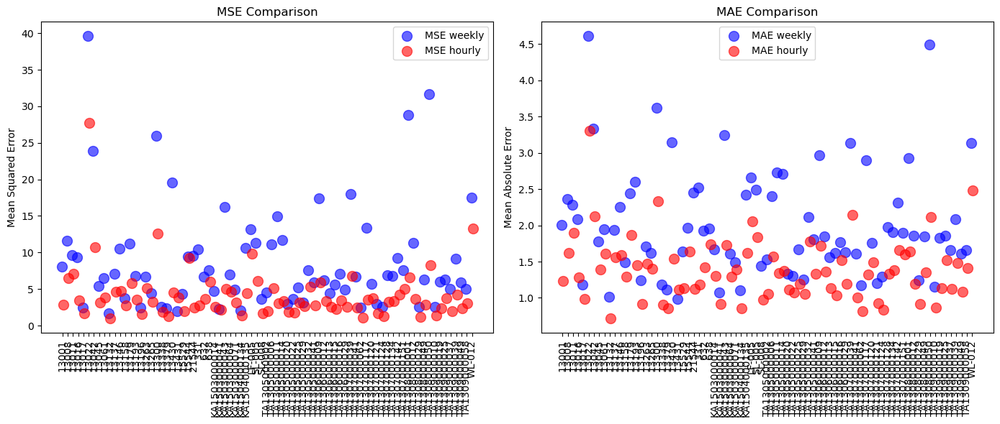

In [206]:
import matplotlib.pyplot as plt
import numpy as np

# Scatter Plots für MSE und MAE
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# Stationen alphabetisch sortieren für konsistente Darstellung
df.sort_values('Station', inplace=True)

# Berechne Positionen für die Punkte, damit sie nebeneinander stehen
positions = np.arange(len(df['Station']))
width = 0.3  # Breite für die Verschiebung der Punkte

# MSE Scatter Plot
ax[0].scatter(positions - width/2, df['MSE weekly'], color='b', label='MSE weekly', alpha=0.6, s=100)
ax[0].scatter(positions + width/2, df['MSE hourly'], color='r', label='MSE hourly', alpha=0.6, s=100)
ax[0].set_title('MSE Comparison')
ax[0].set_xticks(positions)
ax[0].set_xticklabels(df['Station'], rotation=90)
ax[0].set_ylabel('Mean Squared Error')
ax[0].legend()

# MAE Scatter Plot
ax[1].scatter(positions - width/2, df['MAE weekly'], color='b', label='MAE weekly', alpha=0.6, s=100)
ax[1].scatter(positions + width/2, df['MAE hourly'], color='r', label='MAE hourly', alpha=0.6, s=100)
ax[1].set_title('MAE Comparison')
ax[1].set_xticks(positions)
ax[1].set_xticklabels(df['Station'], rotation=90)
ax[1].set_ylabel('Mean Absolute Error')
ax[1].legend()

plt.tight_layout()
plt.show()


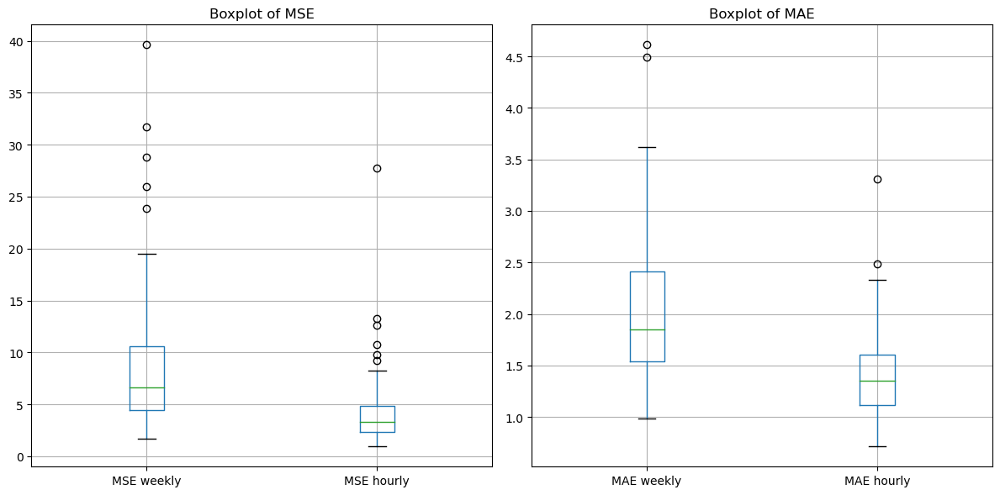

In [207]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

df.boxplot(column=['MSE weekly', 'MSE hourly'], ax=ax[0])
df.boxplot(column=['MAE weekly', 'MAE hourly'], ax=ax[1])

ax[0].set_title('Boxplot of MSE')
ax[1].set_title('Boxplot of MAE')

plt.tight_layout()
plt.show()


In [135]:
results

{'WL-012': {'weekly_mse': 97761.96600606557,
  'weekly_mae': 312.6690998580857,
  'hourly_mse': 15.848549884302317,
  'hourly_mae': 2.981809813348998},
 '13016': {'weekly_mse': 53833.18646057536,
  'weekly_mae': 232.0197975617067,
  'hourly_mse': 10.675124219958617,
  'hourly_mae': 2.2424620261446218},
 '13001': {'weekly_mse': 51425.63984201318,
  'weekly_mae': 226.77222017260664,
  'hourly_mse': 9.173395733811416,
  'hourly_mae': 2.137869905829675},
 '13430': {'weekly_mse': 56591.62367658659,
  'weekly_mae': 237.8899402593279,
  'hourly_mse': 19.533273930243322,
  'hourly_mae': 3.1497864519216905},
 '13011': {'weekly_mse': 81679.61872006496,
  'weekly_mae': 285.7964637990907,
  'hourly_mse': 8.91027978922432,
  'hourly_mae': 2.188435677029983},
 'TA1305000011': {'weekly_mse': 42010.02149731395,
  'weekly_mae': 204.9634638107825,
  'hourly_mse': 17.73762225037042,
  'hourly_mae': 2.9769115164098308},
 'TA1307000151': {'weekly_mse': 69573.54952822533,
  'weekly_mae': 263.7679842744857,


In [203]:


# Angenommen, 'results' und 'result_2' sind Dictionaries, die die Ergebnisse enthalten
data = {
    "MSE Hourly 1": [v['hourly_mse'] for v in results.values()],
    "MSE weekly 2": [v['hourly_mse'] for v in results_2.values()],
    "MAE Hourly 1": [v['hourly_mae'] for v in results.values()],
    "MAE weekly 2": [v['hourly_mae'] for v in results_2.values()],
}

lol = pd.DataFrame(data)

# Anzeige der ersten paar Zeilen zur Überprüfung
print(lol.head())


   MSE Hourly 1  MSE weekly 2  MAE Hourly 1  MAE weekly 2
0     10.141646     15.848550      2.338541      2.981810
1      3.537429     10.675124      1.432531      2.242462
2      3.226513      9.173396      1.436361      2.137870
3      3.847963     19.533274      1.489970      3.149786
4      5.472153      8.910280      1.754427      2.188436


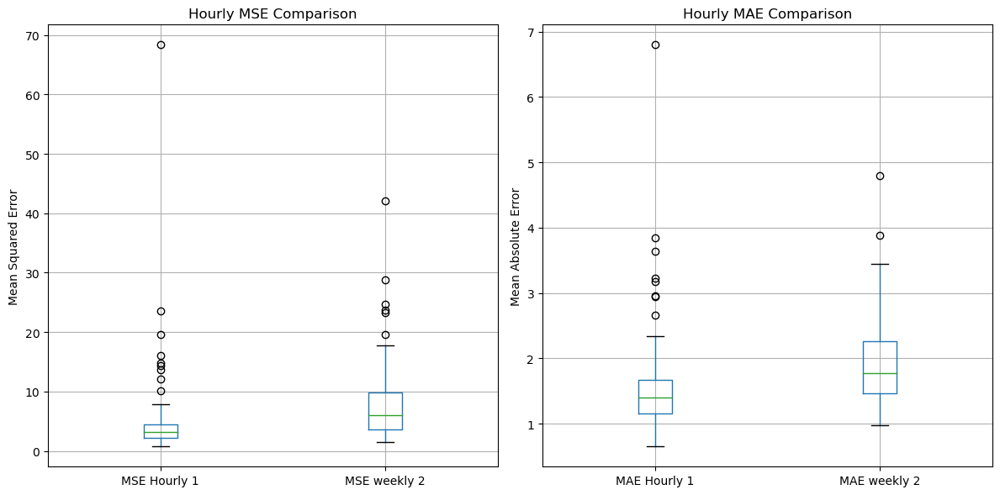

In [204]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 6))

lol.boxplot(column=["MSE Hourly 1", "MSE weekly 2"], ax=axes[0])
lol.boxplot(column=["MAE Hourly 1", "MAE weekly 2"], ax=axes[1])

axes[0].set_title("Hourly MSE Comparison")
axes[1].set_title("Hourly MAE Comparison")
axes[0].set_ylabel("Mean Squared Error")
axes[1].set_ylabel("Mean Absolute Error")

plt.tight_layout()
plt.show()


In [198]:


# Daten für zwei Ansätze
data = {
    'Station': [],
    'MAPE 1': [],
    'MAPE 2': []
}

# Daten aus den Ergebnisdictionaries extrahieren
for station in evaluation_results1.keys():
    data['Station'].append(station)
    data['MAPE 1'].append(evaluation_results1[station]['MAPE'])
    if station in evaluation_results:
        data['MAPE 2'].append(evaluation_results[station]['MAPE'])
    else:
        data['MAPE 2'].append(None)  # Für den Fall, dass eine Station nicht in beiden Ergebnissen vorhanden ist

df = pd.DataFrame(data)


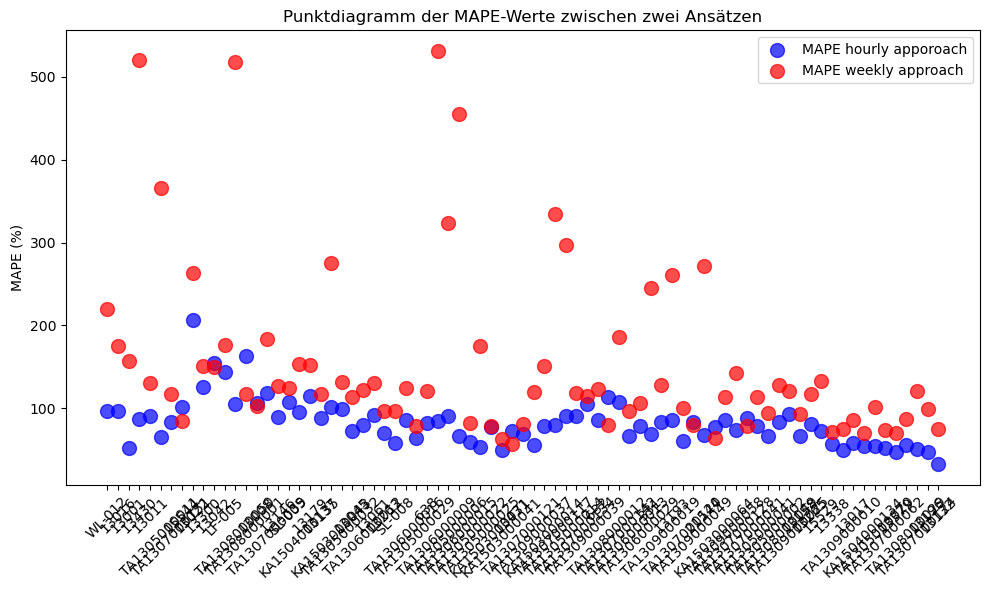

In [199]:


# Punktdiagramm erstellen
fig, ax = plt.subplots(figsize=(10, 6))

# Positionen der Punkte
positions = range(len(df['Station']))

# Punkte für beide Ansätze
ax.scatter(positions, df['MAPE 1'], color='blue', alpha=0.7, label='MAPE hourly apporoach', s=100)
ax.scatter(positions, df['MAPE 2'], color='red', alpha=0.7, label='MAPE weekly approach', s=100)

# Verbesserung der Darstellung
ax.set_ylabel('MAPE (%)')
ax.set_title('Punktdiagramm der MAPE-Werte zwischen zwei Ansätzen')
ax.set_xticks(positions)
ax.set_xticklabels(df['Station'], rotation=45)
ax.legend()

plt.tight_layout()
plt.show()


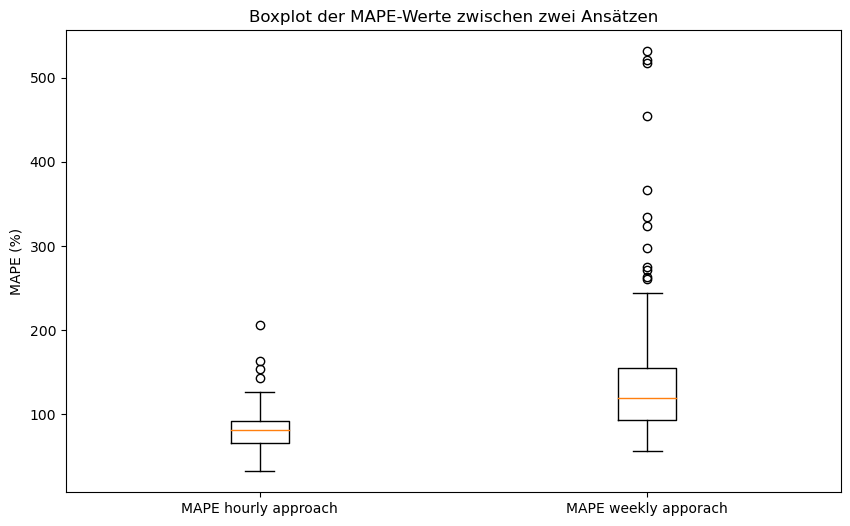

In [200]:
# Boxplot erstellen
fig, ax = plt.subplots(figsize=(10, 6))

# Boxplot-Daten
data_to_plot = [df['MAPE 1'].dropna(), df['MAPE 2'].dropna()]

# Erstellung des Boxplots
ax.boxplot(data_to_plot, labels=['MAPE hourly approach', 'MAPE weekly apporach'])

# Verbesserung der Darstellung
ax.set_ylabel('MAPE (%)')
ax.set_title('Boxplot der MAPE-Werte zwischen zwei Ansätzen')

plt.show()


In [174]:
important_stations_df

,cluster,station,count,cumulative_percentage
98,0,WL-012,21208,3.064408
4,0,13016,20311,5.999205
1,0,13001,19673,8.841816
24,0,13430,19155,11.609580
3,0,13011,18879,14.337463
74,0,TA1305000011,18365,16.991078
90,0,TA1307000151,18149,19.613481
109,1,15544,22246,12.811638
226,2,13022,64538,3.171983
279,2,13300,36139,4.948182


In [201]:


# Daten einlesen und vorbereiten
df = pd.read_csv('/Users/mariu/Desktop/Masterarbeit/archive/data_start.csv')
df['started_at'] = pd.to_datetime(df['started_at'])
df.set_index('started_at', inplace=True)

# Annahme: demand_patterns ist bereits für jedes Cluster berechnet
# Beispiel für ein demand_pattern, das für jedes Cluster erstellt wird
# demand_patterns = {cluster_id: {(weekday, hour): proportion, ...}, ...}



results_2 = {}
for station_id in important_station_ids:
    station_data = df[df['start_station_id'] == station_id]
    
    # Aggregation der Daten auf Wochenbasis
    weekly_data = station_data.resample('W').count()['ride_id'].reset_index(name='y')
    weekly_data.rename(columns={'started_at': 'ds'}, inplace=True)

    if len(weekly_data) > 4:  # Sicherstellen, dass genügend Daten vorhanden sind
        model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
        model.fit(weekly_data[['ds', 'y']])

        # Durchführen der Kreuzvalidierung
        df_cv = cross_validation(model, initial='180 days', period='90 days', horizon='168 hours')
        df_p = performance_metrics(df_cv)
        mse = df_p['mse'].values[-1]
        mae = df_p['mae'].values[-1]
        
        # Berechnung der stündlichen Vorhersagen basierend auf den letzten Vorhersagen
        future = model.make_future_dataframe(periods=1, freq='W')
        forecast = model.predict(future)
        last_week_forecast = forecast.iloc[-1]['yhat']

        cluster_id = df.loc[df['start_station_id'] == station_id, 'cluster'].iloc[0]
        hourly_proportions = demand_patterns[cluster_id]

        detailed_forecasts = {}
        for (weekday, hour), proportion in hourly_proportions.items():
            forecast_value = last_week_forecast * proportion
            detailed_forecasts[(weekday, hour)] = forecast_value
        
        # Erstellen einer Series aus detailed_forecasts mit passendem Index
        detailed_forecasts_series = pd.Series(detailed_forecasts)
        detailed_forecasts_series.index = pd.MultiIndex.from_tuples(detailed_forecasts_series.index, names=['weekday', 'hour'])

        # Letzte Woche tatsächliche Daten aggregieren und deren Index anpassen
        last_week_actuals = station_data.last('1W').resample('H').count()['ride_id']
        last_week_actuals.index = pd.MultiIndex.from_arrays([last_week_actuals.index.weekday, last_week_actuals.index.hour], names=['weekday', 'hour'])

        # Fehlermetriken berechnen
        hourly_mse = mean_squared_error(last_week_actuals, detailed_forecasts_series.reindex(last_week_actuals.index))
        hourly_mae = mean_absolute_error(last_week_actuals, detailed_forecasts_series.reindex(last_week_actuals.index))

        results_2[station_id] = {'weekly_mse': mse, 'weekly_mae': mae, 'hourly_mse': hourly_mse, 'hourly_mae': hourly_mae}
    else:
        print(f"Nicht genügend Daten für Station {station_id} zur Analyse vorhanden.")

# Ergebnisse ausgeben
for station_id, metrics in results_2.items():
    print(f"Ergebnisse für Station {station_id}:\n{metrics}")


13:40:20 - cmdstanpy - INFO - Chain [1] start processing
13:40:20 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:20 - cmdstanpy - INFO - Chain [1] start processing
13:40:20 - cmdstanpy - INFO - Chain [1] done processing
13:40:20 - cmdstanpy - INFO - Chain [1] start processing
13:40:20 - cmdstanpy - INFO - Chain [1] done processing
13:40:21 - cmdstanpy - INFO - Chain [1] start processing
13:40:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:21 - cmdstanpy - INFO - Chain [1] start processing
13:40:21 - cmdstanpy - INFO - Chain [1] done processing
13:40:21 - cmdstanpy - INFO - Chain [1] start processing
13:40:21 - cmdstanpy - INFO - Chain [1] done processing
13:40:22 - cmdstanpy - INFO - Chain [1] start processing
13:40:22 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:22 - cmdstanpy - INFO - Chain [1] start processing
13:40:22 - cmdstanpy - INFO - Chain [1] done processing
13:40:22 - cmdstanpy - INFO - Chain [1] start processing
13:40:22 - cmdstanpy - INFO - Chain [1] done processing
13:40:23 - cmdstanpy - INFO - Chain [1] start processing
13:40:23 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:23 - cmdstanpy - INFO - Chain [1] start processing
13:40:23 - cmdstanpy - INFO - Chain [1] done processing
13:40:23 - cmdstanpy - INFO - Chain [1] start processing
13:40:23 - cmdstanpy - INFO - Chain [1] done processing
13:40:24 - cmdstanpy - INFO - Chain [1] start processing
13:40:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:24 - cmdstanpy - INFO - Chain [1] start processing
13:40:24 - cmdstanpy - INFO - Chain [1] done processing
13:40:24 - cmdstanpy - INFO - Chain [1] start processing
13:40:24 - cmdstanpy - INFO - Chain [1] done processing
13:40:25 - cmdstanpy - INFO - Chain [1] start processing
13:40:25 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:25 - cmdstanpy - INFO - Chain [1] start processing
13:40:25 - cmdstanpy - INFO - Chain [1] done processing
13:40:25 - cmdstanpy - INFO - Chain [1] start processing
13:40:25 - cmdstanpy - INFO - Chain [1] done processing
13:40:26 - cmdstanpy - INFO - Chain [1] start processing
13:40:26 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:26 - cmdstanpy - INFO - Chain [1] start processing
13:40:26 - cmdstanpy - INFO - Chain [1] done processing
13:40:26 - cmdstanpy - INFO - Chain [1] start processing
13:40:26 - cmdstanpy - INFO - Chain [1] done processing
13:40:26 - cmdstanpy - INFO - Chain [1] start processing
13:40:26 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:27 - cmdstanpy - INFO - Chain [1] start processing
13:40:27 - cmdstanpy - INFO - Chain [1] done processing
13:40:27 - cmdstanpy - INFO - Chain [1] start processing
13:40:27 - cmdstanpy - INFO - Chain [1] done processing
13:40:27 - cmdstanpy - INFO - Chain [1] start processing
13:40:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:27 - cmdstanpy - INFO - Chain [1] start processing
13:40:28 - cmdstanpy - INFO - Chain [1] done processing
13:40:28 - cmdstanpy - INFO - Chain [1] start processing
13:40:28 - cmdstanpy - INFO - Chain [1] done processing
13:40:28 - cmdstanpy - INFO - Chain [1] start processing
13:40:28 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:28 - cmdstanpy - INFO - Chain [1] start processing
13:40:29 - cmdstanpy - INFO - Chain [1] done processing
13:40:29 - cmdstanpy - INFO - Chain [1] start processing
13:40:29 - cmdstanpy - INFO - Chain [1] done processing
13:40:29 - cmdstanpy - INFO - Chain [1] start processing
13:40:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:30 - cmdstanpy - INFO - Chain [1] start processing
13:40:30 - cmdstanpy - INFO - Chain [1] done processing
13:40:30 - cmdstanpy - INFO - Chain [1] start processing
13:40:30 - cmdstanpy - INFO - Chain [1] done processing
13:40:30 - cmdstanpy - INFO - Chain [1] start processing
13:40:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:30 - cmdstanpy - INFO - Chain [1] start processing
13:40:31 - cmdstanpy - INFO - Chain [1] done processing
13:40:31 - cmdstanpy - INFO - Chain [1] start processing
13:40:31 - cmdstanpy - INFO - Chain [1] done processing
13:40:31 - cmdstanpy - INFO - Chain [1] start processing
13:40:31 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:31 - cmdstanpy - INFO - Chain [1] start processing
13:40:31 - cmdstanpy - INFO - Chain [1] done processing
13:40:31 - cmdstanpy - INFO - Chain [1] start processing
13:40:31 - cmdstanpy - INFO - Chain [1] done processing
13:40:32 - cmdstanpy - INFO - Chain [1] start processing
13:40:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:32 - cmdstanpy - INFO - Chain [1] start processing
13:40:32 - cmdstanpy - INFO - Chain [1] done processing
13:40:32 - cmdstanpy - INFO - Chain [1] start processing
13:40:32 - cmdstanpy - INFO - Chain [1] done processing
13:40:33 - cmdstanpy - INFO - Chain [1] start processing
13:40:33 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:33 - cmdstanpy - INFO - Chain [1] start processing
13:40:33 - cmdstanpy - INFO - Chain [1] done processing
13:40:33 - cmdstanpy - INFO - Chain [1] start processing
13:40:33 - cmdstanpy - INFO - Chain [1] done processing
13:40:33 - cmdstanpy - INFO - Chain [1] start processing
13:40:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:34 - cmdstanpy - INFO - Chain [1] start processing
13:40:34 - cmdstanpy - INFO - Chain [1] done processing
13:40:34 - cmdstanpy - INFO - Chain [1] start processing
13:40:34 - cmdstanpy - INFO - Chain [1] done processing
13:40:34 - cmdstanpy - INFO - Chain [1] start processing
13:40:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:34 - cmdstanpy - INFO - Chain [1] start processing
13:40:34 - cmdstanpy - INFO - Chain [1] done processing
13:40:34 - cmdstanpy - INFO - Chain [1] start processing
13:40:35 - cmdstanpy - INFO - Chain [1] done processing
13:40:35 - cmdstanpy - INFO - Chain [1] start processing
13:40:35 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:35 - cmdstanpy - INFO - Chain [1] start processing
13:40:35 - cmdstanpy - INFO - Chain [1] done processing
13:40:35 - cmdstanpy - INFO - Chain [1] start processing
13:40:35 - cmdstanpy - INFO - Chain [1] done processing
13:40:36 - cmdstanpy - INFO - Chain [1] start processing
13:40:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:36 - cmdstanpy - INFO - Chain [1] start processing
13:40:36 - cmdstanpy - INFO - Chain [1] done processing
13:40:36 - cmdstanpy - INFO - Chain [1] start processing
13:40:36 - cmdstanpy - INFO - Chain [1] done processing
13:40:36 - cmdstanpy - INFO - Chain [1] start processing
13:40:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:37 - cmdstanpy - INFO - Chain [1] start processing
13:40:37 - cmdstanpy - INFO - Chain [1] done processing
13:40:37 - cmdstanpy - INFO - Chain [1] start processing
13:40:37 - cmdstanpy - INFO - Chain [1] done processing
13:40:37 - cmdstanpy - INFO - Chain [1] start processing
13:40:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:37 - cmdstanpy - INFO - Chain [1] start processing
13:40:37 - cmdstanpy - INFO - Chain [1] done processing
13:40:37 - cmdstanpy - INFO - Chain [1] start processing
13:40:37 - cmdstanpy - INFO - Chain [1] done processing
13:40:38 - cmdstanpy - INFO - Chain [1] start processing
13:40:38 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:38 - cmdstanpy - INFO - Chain [1] start processing
13:40:39 - cmdstanpy - INFO - Chain [1] done processing
13:40:39 - cmdstanpy - INFO - Chain [1] start processing
13:40:39 - cmdstanpy - INFO - Chain [1] done processing
13:40:39 - cmdstanpy - INFO - Chain [1] start processing
13:40:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:39 - cmdstanpy - INFO - Chain [1] start processing
13:40:40 - cmdstanpy - INFO - Chain [1] done processing
13:40:40 - cmdstanpy - INFO - Chain [1] start processing
13:40:40 - cmdstanpy - INFO - Chain [1] done processing
13:40:40 - cmdstanpy - INFO - Chain [1] start processing
13:40:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:40 - cmdstanpy - INFO - Chain [1] start processing
13:40:40 - cmdstanpy - INFO - Chain [1] done processing
13:40:40 - cmdstanpy - INFO - Chain [1] start processing
13:40:41 - cmdstanpy - INFO - Chain [1] done processing
13:40:41 - cmdstanpy - INFO - Chain [1] start processing
13:40:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:41 - cmdstanpy - INFO - Chain [1] start processing
13:40:41 - cmdstanpy - INFO - Chain [1] done processing
13:40:41 - cmdstanpy - INFO - Chain [1] start processing
13:40:41 - cmdstanpy - INFO - Chain [1] done processing
13:40:42 - cmdstanpy - INFO - Chain [1] start processing
13:40:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:42 - cmdstanpy - INFO - Chain [1] start processing
13:40:42 - cmdstanpy - INFO - Chain [1] done processing
13:40:42 - cmdstanpy - INFO - Chain [1] start processing
13:40:42 - cmdstanpy - INFO - Chain [1] done processing
13:40:43 - cmdstanpy - INFO - Chain [1] start processing
13:40:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:43 - cmdstanpy - INFO - Chain [1] start processing
13:40:43 - cmdstanpy - INFO - Chain [1] done processing
13:40:43 - cmdstanpy - INFO - Chain [1] start processing
13:40:43 - cmdstanpy - INFO - Chain [1] done processing
13:40:43 - cmdstanpy - INFO - Chain [1] start processing
13:40:43 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:43 - cmdstanpy - INFO - Chain [1] start processing
13:40:44 - cmdstanpy - INFO - Chain [1] done processing
13:40:44 - cmdstanpy - INFO - Chain [1] start processing
13:40:44 - cmdstanpy - INFO - Chain [1] done processing
13:40:44 - cmdstanpy - INFO - Chain [1] start processing
13:40:44 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:44 - cmdstanpy - INFO - Chain [1] start processing
13:40:45 - cmdstanpy - INFO - Chain [1] done processing
13:40:45 - cmdstanpy - INFO - Chain [1] start processing
13:40:45 - cmdstanpy - INFO - Chain [1] done processing
13:40:45 - cmdstanpy - INFO - Chain [1] start processing
13:40:45 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:45 - cmdstanpy - INFO - Chain [1] start processing
13:40:45 - cmdstanpy - INFO - Chain [1] done processing
13:40:45 - cmdstanpy - INFO - Chain [1] start processing
13:40:45 - cmdstanpy - INFO - Chain [1] done processing
13:40:46 - cmdstanpy - INFO - Chain [1] start processing
13:40:46 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:46 - cmdstanpy - INFO - Chain [1] start processing
13:40:46 - cmdstanpy - INFO - Chain [1] done processing
13:40:46 - cmdstanpy - INFO - Chain [1] start processing
13:40:46 - cmdstanpy - INFO - Chain [1] done processing
13:40:47 - cmdstanpy - INFO - Chain [1] start processing
13:40:47 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:47 - cmdstanpy - INFO - Chain [1] start processing
13:40:47 - cmdstanpy - INFO - Chain [1] done processing
13:40:47 - cmdstanpy - INFO - Chain [1] start processing
13:40:47 - cmdstanpy - INFO - Chain [1] done processing
13:40:47 - cmdstanpy - INFO - Chain [1] start processing
13:40:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:48 - cmdstanpy - INFO - Chain [1] start processing
13:40:48 - cmdstanpy - INFO - Chain [1] done processing
13:40:48 - cmdstanpy - INFO - Chain [1] start processing
13:40:48 - cmdstanpy - INFO - Chain [1] done processing
13:40:48 - cmdstanpy - INFO - Chain [1] start processing
13:40:48 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:48 - cmdstanpy - INFO - Chain [1] start processing
13:40:48 - cmdstanpy - INFO - Chain [1] done processing
13:40:49 - cmdstanpy - INFO - Chain [1] start processing
13:40:49 - cmdstanpy - INFO - Chain [1] done processing
13:40:49 - cmdstanpy - INFO - Chain [1] start processing
13:40:49 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:49 - cmdstanpy - INFO - Chain [1] start processing
13:40:49 - cmdstanpy - INFO - Chain [1] done processing
13:40:49 - cmdstanpy - INFO - Chain [1] start processing
13:40:49 - cmdstanpy - INFO - Chain [1] done processing
13:40:50 - cmdstanpy - INFO - Chain [1] start processing
13:40:50 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:50 - cmdstanpy - INFO - Chain [1] start processing
13:40:50 - cmdstanpy - INFO - Chain [1] done processing
13:40:50 - cmdstanpy - INFO - Chain [1] start processing
13:40:50 - cmdstanpy - INFO - Chain [1] done processing
13:40:51 - cmdstanpy - INFO - Chain [1] start processing
13:40:51 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:51 - cmdstanpy - INFO - Chain [1] start processing
13:40:51 - cmdstanpy - INFO - Chain [1] done processing
13:40:51 - cmdstanpy - INFO - Chain [1] start processing
13:40:51 - cmdstanpy - INFO - Chain [1] done processing
13:40:51 - cmdstanpy - INFO - Chain [1] start processing
13:40:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:52 - cmdstanpy - INFO - Chain [1] start processing
13:40:52 - cmdstanpy - INFO - Chain [1] done processing
13:40:52 - cmdstanpy - INFO - Chain [1] start processing
13:40:52 - cmdstanpy - INFO - Chain [1] done processing
13:40:52 - cmdstanpy - INFO - Chain [1] start processing
13:40:52 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:52 - cmdstanpy - INFO - Chain [1] start processing
13:40:53 - cmdstanpy - INFO - Chain [1] done processing
13:40:53 - cmdstanpy - INFO - Chain [1] start processing
13:40:53 - cmdstanpy - INFO - Chain [1] done processing
13:40:53 - cmdstanpy - INFO - Chain [1] start processing
13:40:53 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:53 - cmdstanpy - INFO - Chain [1] start processing
13:40:53 - cmdstanpy - INFO - Chain [1] done processing
13:40:54 - cmdstanpy - INFO - Chain [1] start processing
13:40:54 - cmdstanpy - INFO - Chain [1] done processing
13:40:54 - cmdstanpy - INFO - Chain [1] start processing
13:40:54 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:54 - cmdstanpy - INFO - Chain [1] start processing
13:40:54 - cmdstanpy - INFO - Chain [1] done processing
13:40:54 - cmdstanpy - INFO - Chain [1] start processing
13:40:54 - cmdstanpy - INFO - Chain [1] done processing
13:40:55 - cmdstanpy - INFO - Chain [1] start processing
13:40:55 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:55 - cmdstanpy - INFO - Chain [1] start processing
13:40:55 - cmdstanpy - INFO - Chain [1] done processing
13:40:55 - cmdstanpy - INFO - Chain [1] start processing
13:40:55 - cmdstanpy - INFO - Chain [1] done processing
13:40:56 - cmdstanpy - INFO - Chain [1] start processing
13:40:56 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:56 - cmdstanpy - INFO - Chain [1] start processing
13:40:56 - cmdstanpy - INFO - Chain [1] done processing
13:40:56 - cmdstanpy - INFO - Chain [1] start processing
13:40:56 - cmdstanpy - INFO - Chain [1] done processing
13:40:56 - cmdstanpy - INFO - Chain [1] start processing
13:40:57 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:57 - cmdstanpy - INFO - Chain [1] start processing
13:40:57 - cmdstanpy - INFO - Chain [1] done processing
13:40:57 - cmdstanpy - INFO - Chain [1] start processing
13:40:57 - cmdstanpy - INFO - Chain [1] done processing
13:40:57 - cmdstanpy - INFO - Chain [1] start processing
13:40:57 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:57 - cmdstanpy - INFO - Chain [1] start processing
13:40:58 - cmdstanpy - INFO - Chain [1] done processing
13:40:58 - cmdstanpy - INFO - Chain [1] start processing
13:40:58 - cmdstanpy - INFO - Chain [1] done processing
13:40:58 - cmdstanpy - INFO - Chain [1] start processing
13:40:58 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:58 - cmdstanpy - INFO - Chain [1] start processing
13:40:58 - cmdstanpy - INFO - Chain [1] done processing
13:40:58 - cmdstanpy - INFO - Chain [1] start processing
13:40:58 - cmdstanpy - INFO - Chain [1] done processing
13:40:59 - cmdstanpy - INFO - Chain [1] start processing
13:40:59 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:40:59 - cmdstanpy - INFO - Chain [1] start processing
13:40:59 - cmdstanpy - INFO - Chain [1] done processing
13:40:59 - cmdstanpy - INFO - Chain [1] start processing
13:40:59 - cmdstanpy - INFO - Chain [1] done processing
13:41:00 - cmdstanpy - INFO - Chain [1] start processing
13:41:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:00 - cmdstanpy - INFO - Chain [1] start processing
13:41:00 - cmdstanpy - INFO - Chain [1] done processing
13:41:00 - cmdstanpy - INFO - Chain [1] start processing
13:41:00 - cmdstanpy - INFO - Chain [1] done processing
13:41:00 - cmdstanpy - INFO - Chain [1] start processing
13:41:00 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:01 - cmdstanpy - INFO - Chain [1] start processing
13:41:01 - cmdstanpy - INFO - Chain [1] done processing
13:41:01 - cmdstanpy - INFO - Chain [1] start processing
13:41:01 - cmdstanpy - INFO - Chain [1] done processing
13:41:01 - cmdstanpy - INFO - Chain [1] start processing
13:41:01 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:01 - cmdstanpy - INFO - Chain [1] start processing
13:41:01 - cmdstanpy - INFO - Chain [1] done processing
13:41:01 - cmdstanpy - INFO - Chain [1] start processing
13:41:02 - cmdstanpy - INFO - Chain [1] done processing
13:41:02 - cmdstanpy - INFO - Chain [1] start processing
13:41:02 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:02 - cmdstanpy - INFO - Chain [1] start processing
13:41:02 - cmdstanpy - INFO - Chain [1] done processing
13:41:03 - cmdstanpy - INFO - Chain [1] start processing
13:41:03 - cmdstanpy - INFO - Chain [1] done processing
13:41:03 - cmdstanpy - INFO - Chain [1] start processing
13:41:03 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:03 - cmdstanpy - INFO - Chain [1] start processing
13:41:03 - cmdstanpy - INFO - Chain [1] done processing
13:41:03 - cmdstanpy - INFO - Chain [1] start processing
13:41:04 - cmdstanpy - INFO - Chain [1] done processing
13:41:04 - cmdstanpy - INFO - Chain [1] start processing
13:41:04 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:04 - cmdstanpy - INFO - Chain [1] start processing
13:41:04 - cmdstanpy - INFO - Chain [1] done processing
13:41:04 - cmdstanpy - INFO - Chain [1] start processing
13:41:05 - cmdstanpy - INFO - Chain [1] done processing
13:41:05 - cmdstanpy - INFO - Chain [1] start processing
13:41:05 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:05 - cmdstanpy - INFO - Chain [1] start processing
13:41:05 - cmdstanpy - INFO - Chain [1] done processing
13:41:05 - cmdstanpy - INFO - Chain [1] start processing
13:41:06 - cmdstanpy - INFO - Chain [1] done processing
13:41:07 - cmdstanpy - INFO - Chain [1] start processing
13:41:07 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:07 - cmdstanpy - INFO - Chain [1] start processing
13:41:07 - cmdstanpy - INFO - Chain [1] done processing
13:41:07 - cmdstanpy - INFO - Chain [1] start processing
13:41:07 - cmdstanpy - INFO - Chain [1] done processing
13:41:08 - cmdstanpy - INFO - Chain [1] start processing
13:41:09 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:09 - cmdstanpy - INFO - Chain [1] start processing
13:41:09 - cmdstanpy - INFO - Chain [1] done processing
13:41:09 - cmdstanpy - INFO - Chain [1] start processing
13:41:09 - cmdstanpy - INFO - Chain [1] done processing
13:41:10 - cmdstanpy - INFO - Chain [1] start processing
13:41:10 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:10 - cmdstanpy - INFO - Chain [1] start processing
13:41:10 - cmdstanpy - INFO - Chain [1] done processing
13:41:10 - cmdstanpy - INFO - Chain [1] start processing
13:41:11 - cmdstanpy - INFO - Chain [1] done processing
13:41:12 - cmdstanpy - INFO - Chain [1] start processing
13:41:12 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:12 - cmdstanpy - INFO - Chain [1] start processing
13:41:12 - cmdstanpy - INFO - Chain [1] done processing
13:41:12 - cmdstanpy - INFO - Chain [1] start processing
13:41:12 - cmdstanpy - INFO - Chain [1] done processing
13:41:13 - cmdstanpy - INFO - Chain [1] start processing
13:41:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:13 - cmdstanpy - INFO - Chain [1] start processing
13:41:13 - cmdstanpy - INFO - Chain [1] done processing
13:41:13 - cmdstanpy - INFO - Chain [1] start processing
13:41:13 - cmdstanpy - INFO - Chain [1] done processing
13:41:13 - cmdstanpy - INFO - Chain [1] start processing
13:41:13 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:13 - cmdstanpy - INFO - Chain [1] start processing
13:41:14 - cmdstanpy - INFO - Chain [1] done processing
13:41:14 - cmdstanpy - INFO - Chain [1] start processing
13:41:14 - cmdstanpy - INFO - Chain [1] done processing
13:41:14 - cmdstanpy - INFO - Chain [1] start processing
13:41:15 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:15 - cmdstanpy - INFO - Chain [1] start processing
13:41:15 - cmdstanpy - INFO - Chain [1] done processing
13:41:15 - cmdstanpy - INFO - Chain [1] start processing
13:41:15 - cmdstanpy - INFO - Chain [1] done processing
13:41:16 - cmdstanpy - INFO - Chain [1] start processing
13:41:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:16 - cmdstanpy - INFO - Chain [1] start processing
13:41:16 - cmdstanpy - INFO - Chain [1] done processing
13:41:16 - cmdstanpy - INFO - Chain [1] start processing
13:41:16 - cmdstanpy - INFO - Chain [1] done processing
13:41:16 - cmdstanpy - INFO - Chain [1] start processing
13:41:16 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:17 - cmdstanpy - INFO - Chain [1] start processing
13:41:17 - cmdstanpy - INFO - Chain [1] done processing
13:41:17 - cmdstanpy - INFO - Chain [1] start processing
13:41:17 - cmdstanpy - INFO - Chain [1] done processing
13:41:18 - cmdstanpy - INFO - Chain [1] start processing
13:41:18 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:18 - cmdstanpy - INFO - Chain [1] start processing
13:41:18 - cmdstanpy - INFO - Chain [1] done processing
13:41:18 - cmdstanpy - INFO - Chain [1] start processing
13:41:18 - cmdstanpy - INFO - Chain [1] done processing
13:41:19 - cmdstanpy - INFO - Chain [1] start processing
13:41:19 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:20 - cmdstanpy - INFO - Chain [1] start processing
13:41:20 - cmdstanpy - INFO - Chain [1] done processing
13:41:20 - cmdstanpy - INFO - Chain [1] start processing
13:41:20 - cmdstanpy - INFO - Chain [1] done processing
13:41:21 - cmdstanpy - INFO - Chain [1] start processing
13:41:21 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:21 - cmdstanpy - INFO - Chain [1] start processing
13:41:21 - cmdstanpy - INFO - Chain [1] done processing
13:41:21 - cmdstanpy - INFO - Chain [1] start processing
13:41:21 - cmdstanpy - INFO - Chain [1] done processing
13:41:22 - cmdstanpy - INFO - Chain [1] start processing
13:41:22 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:22 - cmdstanpy - INFO - Chain [1] start processing
13:41:22 - cmdstanpy - INFO - Chain [1] done processing
13:41:22 - cmdstanpy - INFO - Chain [1] start processing
13:41:22 - cmdstanpy - INFO - Chain [1] done processing
13:41:24 - cmdstanpy - INFO - Chain [1] start processing
13:41:24 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:24 - cmdstanpy - INFO - Chain [1] start processing
13:41:24 - cmdstanpy - INFO - Chain [1] done processing
13:41:24 - cmdstanpy - INFO - Chain [1] start processing
13:41:25 - cmdstanpy - INFO - Chain [1] done processing
13:41:27 - cmdstanpy - INFO - Chain [1] start processing
13:41:27 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:27 - cmdstanpy - INFO - Chain [1] start processing
13:41:28 - cmdstanpy - INFO - Chain [1] done processing
13:41:28 - cmdstanpy - INFO - Chain [1] start processing
13:41:28 - cmdstanpy - INFO - Chain [1] done processing
13:41:29 - cmdstanpy - INFO - Chain [1] start processing
13:41:29 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:29 - cmdstanpy - INFO - Chain [1] start processing
13:41:29 - cmdstanpy - INFO - Chain [1] done processing
13:41:29 - cmdstanpy - INFO - Chain [1] start processing
13:41:30 - cmdstanpy - INFO - Chain [1] done processing
13:41:30 - cmdstanpy - INFO - Chain [1] start processing
13:41:30 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:30 - cmdstanpy - INFO - Chain [1] start processing
13:41:31 - cmdstanpy - INFO - Chain [1] done processing
13:41:31 - cmdstanpy - INFO - Chain [1] start processing
13:41:31 - cmdstanpy - INFO - Chain [1] done processing
13:41:32 - cmdstanpy - INFO - Chain [1] start processing
13:41:32 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:32 - cmdstanpy - INFO - Chain [1] start processing
13:41:32 - cmdstanpy - INFO - Chain [1] done processing
13:41:32 - cmdstanpy - INFO - Chain [1] start processing
13:41:32 - cmdstanpy - INFO - Chain [1] done processing
13:41:33 - cmdstanpy - INFO - Chain [1] start processing
13:41:34 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:34 - cmdstanpy - INFO - Chain [1] start processing
13:41:34 - cmdstanpy - INFO - Chain [1] done processing
13:41:34 - cmdstanpy - INFO - Chain [1] start processing
13:41:34 - cmdstanpy - INFO - Chain [1] done processing
13:41:35 - cmdstanpy - INFO - Chain [1] start processing
13:41:36 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:36 - cmdstanpy - INFO - Chain [1] start processing
13:41:36 - cmdstanpy - INFO - Chain [1] done processing
13:41:36 - cmdstanpy - INFO - Chain [1] start processing
13:41:36 - cmdstanpy - INFO - Chain [1] done processing
13:41:37 - cmdstanpy - INFO - Chain [1] start processing
13:41:37 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:37 - cmdstanpy - INFO - Chain [1] start processing
13:41:37 - cmdstanpy - INFO - Chain [1] done processing
13:41:37 - cmdstanpy - INFO - Chain [1] start processing
13:41:38 - cmdstanpy - INFO - Chain [1] done processing
13:41:39 - cmdstanpy - INFO - Chain [1] start processing
13:41:39 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:39 - cmdstanpy - INFO - Chain [1] start processing
13:41:39 - cmdstanpy - INFO - Chain [1] done processing
13:41:39 - cmdstanpy - INFO - Chain [1] start processing
13:41:39 - cmdstanpy - INFO - Chain [1] done processing
13:41:40 - cmdstanpy - INFO - Chain [1] start processing
13:41:40 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:40 - cmdstanpy - INFO - Chain [1] start processing
13:41:40 - cmdstanpy - INFO - Chain [1] done processing
13:41:40 - cmdstanpy - INFO - Chain [1] start processing
13:41:40 - cmdstanpy - INFO - Chain [1] done processing
13:41:41 - cmdstanpy - INFO - Chain [1] start processing
13:41:41 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:42 - cmdstanpy - INFO - Chain [1] start processing
13:41:42 - cmdstanpy - INFO - Chain [1] done processing
13:41:42 - cmdstanpy - INFO - Chain [1] start processing
13:41:42 - cmdstanpy - INFO - Chain [1] done processing
13:41:42 - cmdstanpy - INFO - Chain [1] start processing
13:41:42 - cmdstanpy - INFO - Chain [1] done processing
Seasonality has period of 365.25 days which is larger than initial window. Consider increasing initial.


  0%|          | 0/2 [00:00<?, ?it/s]

13:41:42 - cmdstanpy - INFO - Chain [1] start processing
13:41:43 - cmdstanpy - INFO - Chain [1] done processing
13:41:43 - cmdstanpy - INFO - Chain [1] start processing
13:41:43 - cmdstanpy - INFO - Chain [1] done processing


Ergebnisse für Station WL-012:
{'weekly_mse': 97761.96600606557, 'weekly_mae': 312.6690998580857, 'hourly_mse': 15.848549884302317, 'hourly_mae': 2.981809813348998}
Ergebnisse für Station 13016:
{'weekly_mse': 53833.18646057536, 'weekly_mae': 232.0197975617067, 'hourly_mse': 10.675124219958617, 'hourly_mae': 2.2424620261446218}
Ergebnisse für Station 13001:
{'weekly_mse': 51425.63984201318, 'weekly_mae': 226.77222017260664, 'hourly_mse': 9.173395733811416, 'hourly_mae': 2.137869905829675}
Ergebnisse für Station 13430:
{'weekly_mse': 56591.62367658659, 'weekly_mae': 237.8899402593279, 'hourly_mse': 19.533273930243322, 'hourly_mae': 3.1497864519216905}
Ergebnisse für Station 13011:
{'weekly_mse': 81679.61872006496, 'weekly_mae': 285.7964637990907, 'hourly_mse': 8.91027978922432, 'hourly_mae': 2.188435677029983}
Ergebnisse für Station TA1305000011:
{'weekly_mse': 42010.02149731395, 'weekly_mae': 204.9634638107825, 'hourly_mse': 17.73762225037042, 'hourly_mae': 2.9769115164098308}
Ergebnis

In [166]:
def calculate_mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    non_zero = y_true != 0  # Vermeide Division durch Null
    if np.any(non_zero):
        return np.mean(np.abs((y_true[non_zero] - y_pred[non_zero]) / y_true[non_zero])) * 100
    return np.nan  # Rückgabe NaN, wenn alle Werte Null sind


In [168]:
evaluation_results

{'WL-012': {'MSE': 17.486839578643046,
  'MAE': 3.131534335434604,
  'MAPE': 219.20057637571668},
 '13016': {'MSE': 9.328585167842112,
  'MAE': 2.0891666972038494,
  'MAPE': 174.55057282826027},
 '13001': {'MSE': 8.043464644008976,
  'MAE': 2.002596059513951,
  'MAPE': 157.1870536343772},
 '13430': {'MSE': 19.52294474006188,
  'MAE': 3.1489531406003226,
  'MAPE': 520.604803408657},
 '13011': {'MSE': 9.604051627029216,
  'MAE': 2.2795663800732253,
  'MAPE': 130.458673817037},
 'TA1305000011': {'MSE': 14.955568243092339,
  'MAE': 2.7319509283170387,
  'MAPE': 366.40135542630446},
 'TA1307000151': {'MSE': 7.6188289758547425,
  'MAE': 1.9018397668579612,
  'MAPE': 116.85689160284782},
 '15544': {'MSE': 9.419449706348077,
  'MAE': 1.9699680423254997,
  'MAPE': 84.71206357254057},
 '13022': {'MSE': 39.62139216258243,
  'MAE': 4.613591019104242,
  'MAPE': 263.09710932745725},
 '13300': {'MSE': 25.96722061310116,
  'MAE': 3.622839273663365,
  'MAPE': 150.36815394537538},
 '13042': {'MSE': 23.8

In [7]:
df = pd.read_csv('data_start.csv')

# DataFrame vorbereiten
df.reset_index(inplace=True)  # Sicherstellen, dass die Indexierung zurückgesetzt wird, wenn zuvor Anpassungen vorgenommen wurden
df['started_at'] = pd.to_datetime(df['started_at'])
df.set_index('started_at', inplace=True)  # Setzen des DatetimeIndex für die Zeitreihenanalyse

# Annahme: demand_patterns ist bereits für jedes Cluster berechnet
# Beispiel für ein demand_pattern, das für jedes Cluster erstellt wird
# demand_patterns = {cluster_id: {(weekday, hour): proportion, ...}, ...}

# Vorbereitung für das Forecasting und die Darstellung
station_forecasts = {}
evaluation_results = {}

for station_id in important_station_ids:
    station_data = df[df['start_station_id'] == station_id]
    
    # Aggregation der Daten auf Wochenbasis
    weekly_data = station_data.resample('W').count()['ride_id'].reset_index(name='y')
    weekly_data.rename(columns={'started_at': 'ds'}, inplace=True)

    # Training und Vorhersage mit Prophet
    if len(weekly_data) > 4:  # Sicherstellen, dass genügend Daten vorhanden sind
        train_data = weekly_data[:-1]
        test_data = weekly_data[-1:]

        model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
        model.fit(train_data[['ds', 'y']])
        future = model.make_future_dataframe(periods=1, freq='W')
        forecast = model.predict(future)

        # Anwendung des demand_patterns, um stündliche Vorhersagen zu erhalten
        last_week_forecast = forecast.iloc[-1]['yhat']  # Vorhersage der letzten Woche
        cluster_id = df[df['start_station_id'] == station_id]['cluster'].iloc[0]
        hourly_proportions = demand_patterns[cluster_id]
        
        detailed_forecasts = {}
        for (weekday, hour), proportion in hourly_proportions.items():
            forecast_value = last_week_forecast * proportion
            detailed_forecasts[(weekday, hour)] = forecast_value
        station_forecasts[station_id] = detailed_forecasts 
        # Berechnung der stündlichen tatsächlichen Werte für die letzte Woche
        last_week_actuals = station_data.last('1W').resample('H').count()['ride_id']
        last_week_actuals.index = last_week_actuals.index.map(lambda dt: (dt.weekday(), dt.hour))

        # Berechnung der Fehlermetriken
        mse = mean_squared_error(last_week_actuals, pd.Series(detailed_forecasts, index=last_week_actuals.index))
        mae = mean_absolute_error(last_week_actuals, pd.Series(detailed_forecasts, index=last_week_actuals.index))
        mape = calculate_mape(last_week_actuals.values, pd.Series(detailed_forecasts, index=last_week_actuals.index).values)
        
        evaluation_results[station_id] = {'MSE': mse, 'MAE': mae, 'MAPE': mape}
      

        # Umwandeln des Tupel-Index in einen String für das Plotten
        last_week_actuals.index = [f"{day}-{hour}" for day, hour in last_week_actuals.index]
        detailed_forecasts_series = pd.Series(detailed_forecasts)
        detailed_forecasts_series.index = [f"{day}-{hour}" for (day, hour) in detailed_forecasts_series.index]


        # Konvertieren des Index in MultiIndex für last_week_actuals
        if isinstance(last_week_actuals.index[0], str):
            last_week_actuals.index = pd.MultiIndex.from_tuples(
                [tuple(map(int, idx.split('-'))) for idx in last_week_actuals.index], 
                names=['weekday', 'hour']
            )

        # Annahme, dass detailed_forecasts_series bereits ein passendes Format hat, wenn nicht, anpassen
        if isinstance(detailed_forecasts_series.index[0], str):
            detailed_forecasts_series.index = pd.MultiIndex.from_tuples(
                [tuple(map(int, idx.split('-'))) for idx in detailed_forecasts_series.index],
                names=['weekday', 'hour']
            )

        # Konvertieren des Index von last_week_actuals und detailed_forecasts_series in String-Format für das Plotten
        last_week_actuals_formatted_index = [f"{day}-{hour}" for day, hour in last_week_actuals.index]
        detailed_forecasts_formatted_index = [f"{day}-{hour}" for day, hour in detailed_forecasts_series.index]

        plt.figure(figsize=(14, 7))
        plt.plot(last_week_actuals_formatted_index, last_week_actuals.values, label='Tatsächliche Fahrten', marker='o')
        plt.plot(detailed_forecasts_formatted_index, detailed_forecasts_series.values, label='Vorhergesagte Fahrten', marker='x')

        plt.title(f'Vergleich der tatsächlichen und vorhergesagten Fahrtenanzahl für Station {station_id}')
        plt.xlabel('Wochentag-Stunde')
        plt.ylabel('Anzahl der Fahrten')
        plt.xticks(rotation=90)  # Drehen Sie die X-Achsen-Beschriftungen für bessere Lesbarkeit
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()
    else:
        print(f"Nicht genügend Daten für Station {station_id} zur Analyse vorhanden.")

10:41:38 - cmdstanpy - INFO - Chain [1] start processing
10:41:38 - cmdstanpy - INFO - Chain [1] done processing


NameError: name 'demand_patterns' is not defined

In [111]:
actual_values

8590    0
8591    0
8592    0
8593    0
8594    0
       ..
8753    0
8754    2
8755    2
8756    2
8757    1
Name: y, Length: 168, dtype: int64

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_1559/3887824754.py:11: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  important_stations_df = station_counts[station_counts.groupby('cluster')['cumulative_percentage'].apply(lambda x: x <= threshold)]
16:02:49 - cmdstanpy - INFO - Chain [1] start processing
16:02:49 - cmdstanpy - INFO - Chain [1] done processing


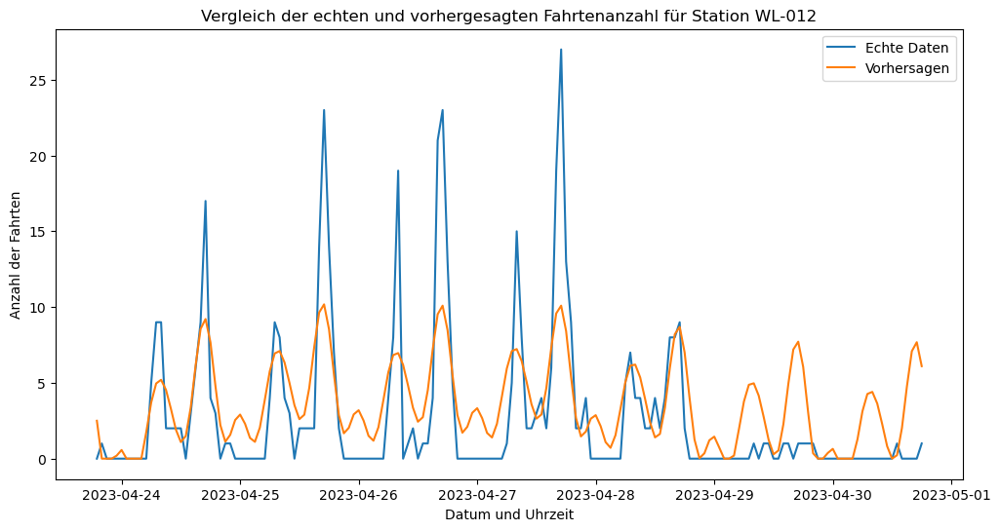

16:02:52 - cmdstanpy - INFO - Chain [1] start processing
16:02:52 - cmdstanpy - INFO - Chain [1] done processing


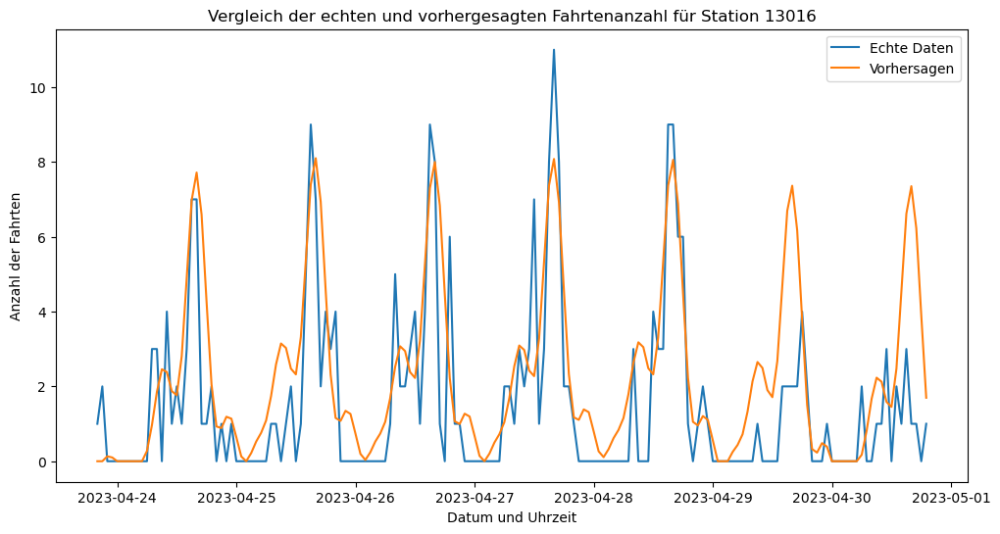

16:02:54 - cmdstanpy - INFO - Chain [1] start processing
16:02:54 - cmdstanpy - INFO - Chain [1] done processing


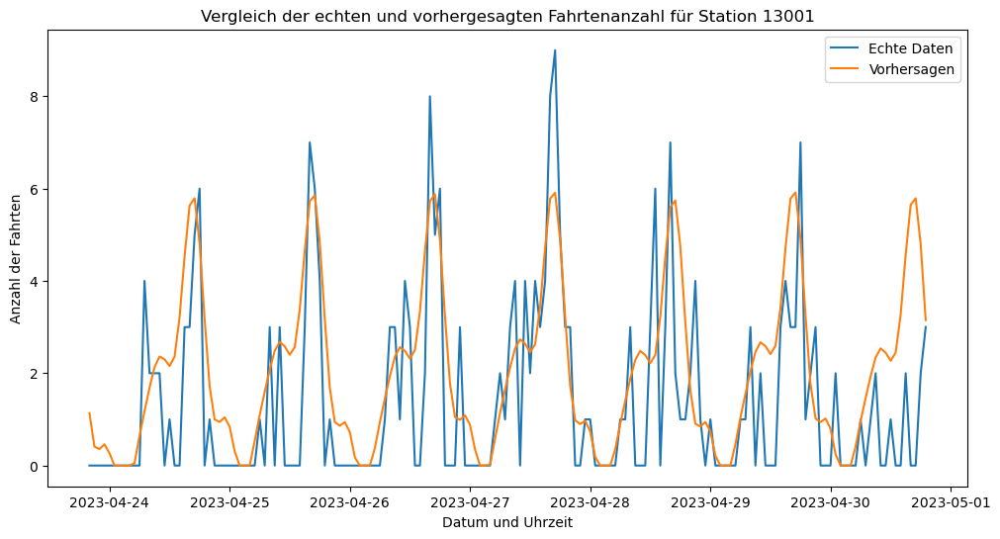

16:02:57 - cmdstanpy - INFO - Chain [1] start processing
16:02:57 - cmdstanpy - INFO - Chain [1] done processing


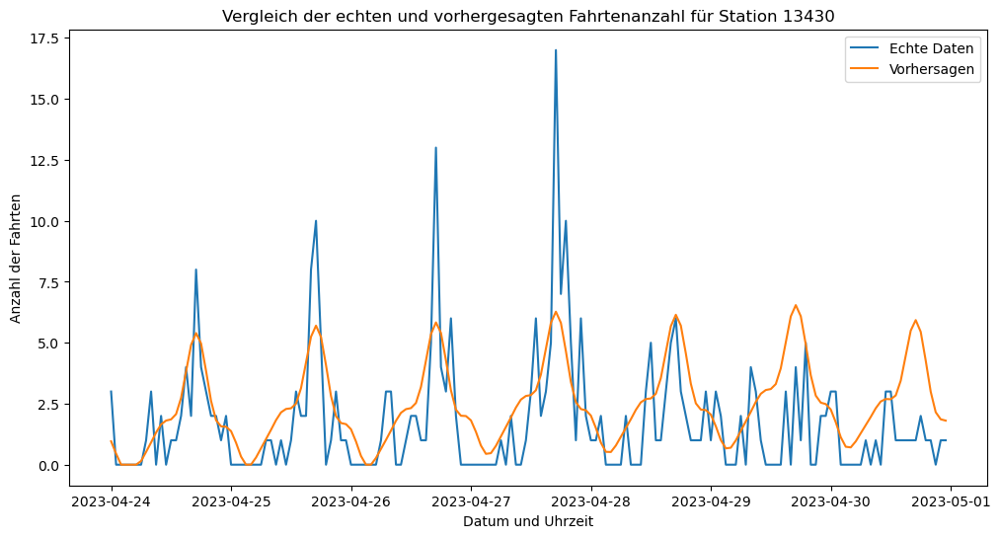

16:02:59 - cmdstanpy - INFO - Chain [1] start processing
16:03:00 - cmdstanpy - INFO - Chain [1] done processing


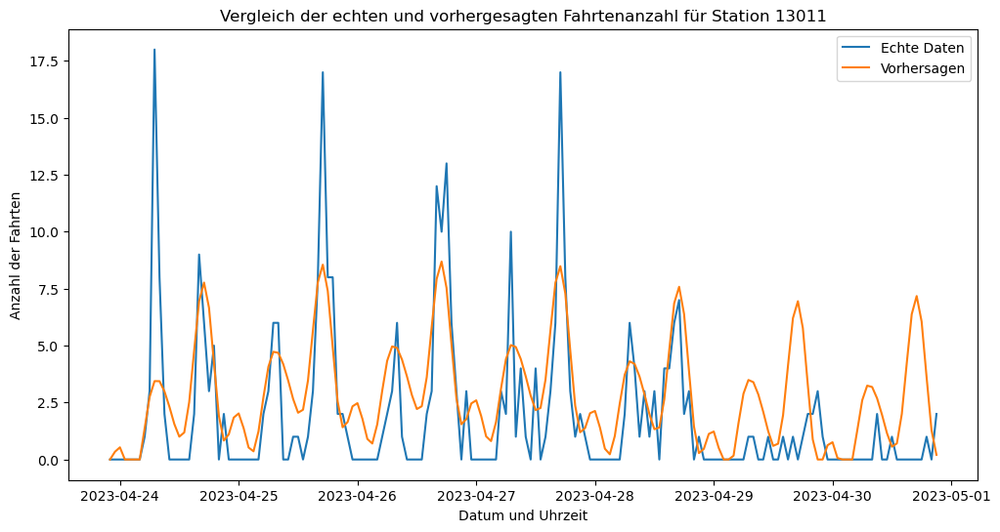

16:03:03 - cmdstanpy - INFO - Chain [1] start processing
16:03:04 - cmdstanpy - INFO - Chain [1] done processing


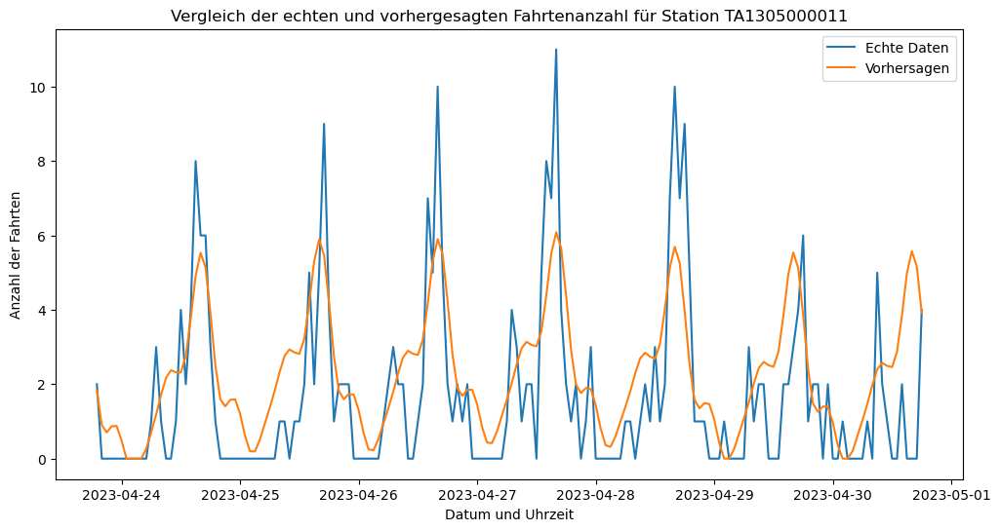

16:03:08 - cmdstanpy - INFO - Chain [1] start processing
16:03:09 - cmdstanpy - INFO - Chain [1] done processing


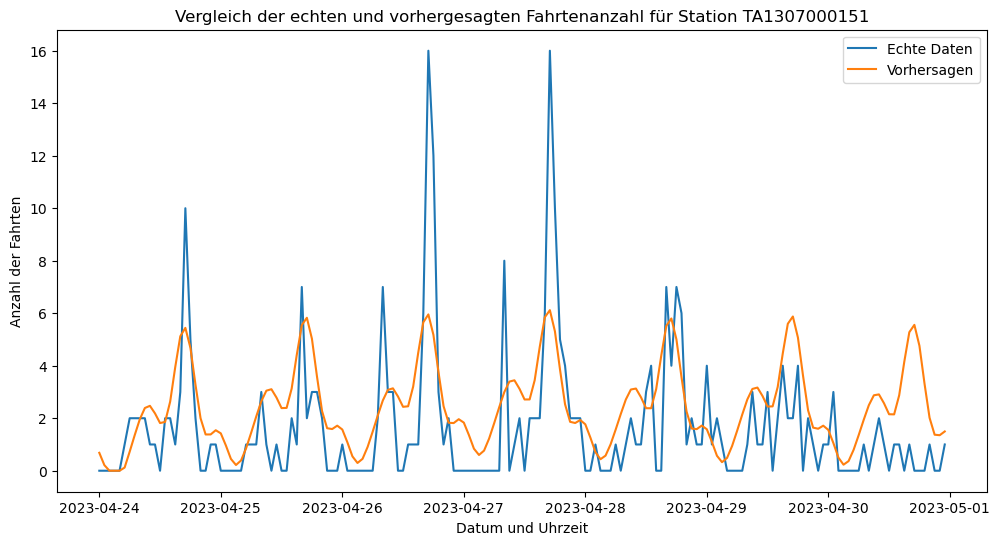

16:03:13 - cmdstanpy - INFO - Chain [1] start processing
16:03:13 - cmdstanpy - INFO - Chain [1] done processing


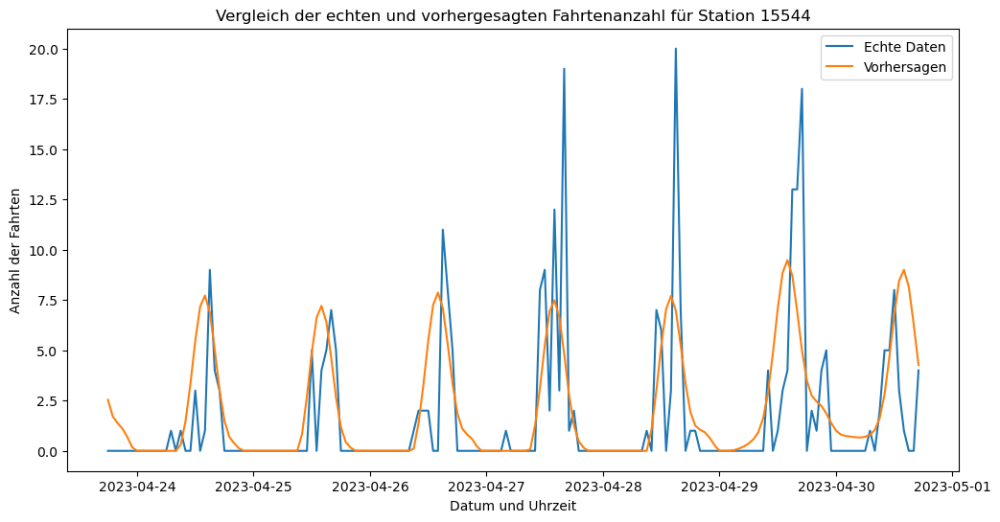

16:03:16 - cmdstanpy - INFO - Chain [1] start processing
16:03:16 - cmdstanpy - INFO - Chain [1] done processing


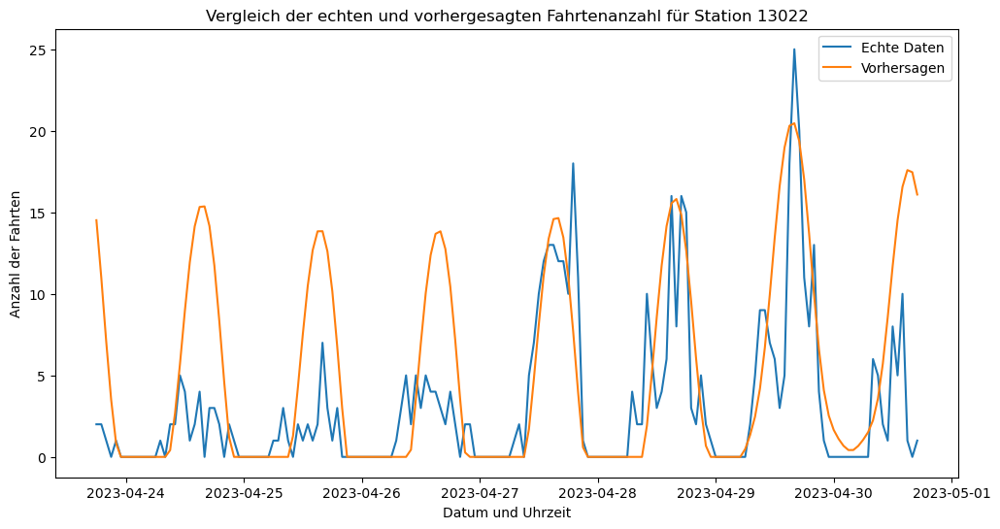

16:03:22 - cmdstanpy - INFO - Chain [1] start processing
16:03:22 - cmdstanpy - INFO - Chain [1] done processing


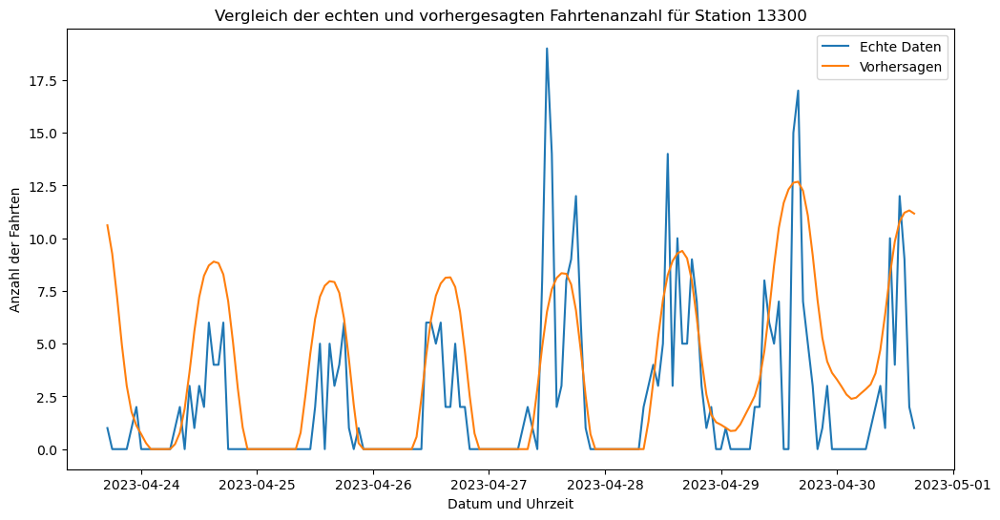

16:03:25 - cmdstanpy - INFO - Chain [1] start processing
16:03:26 - cmdstanpy - INFO - Chain [1] done processing


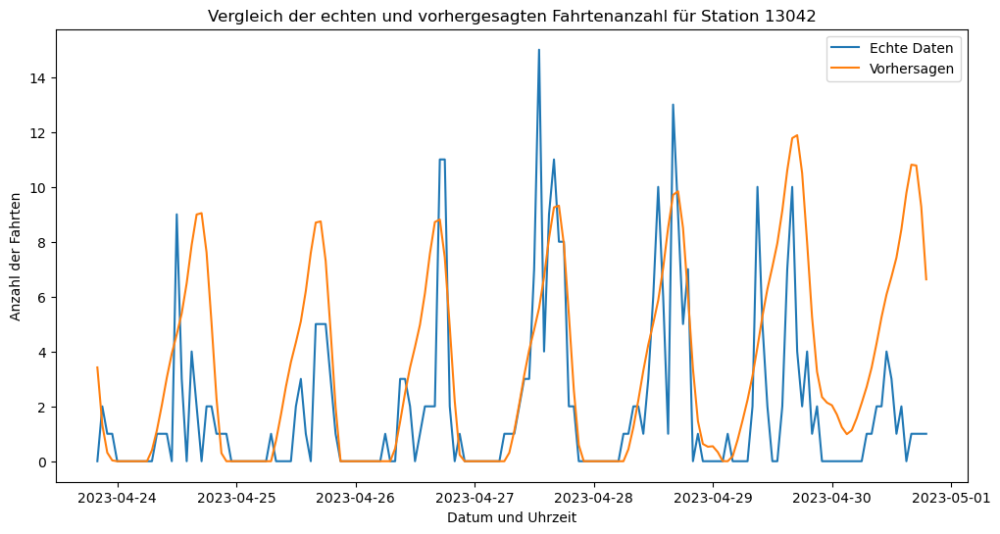

16:03:29 - cmdstanpy - INFO - Chain [1] start processing
16:03:29 - cmdstanpy - INFO - Chain [1] done processing


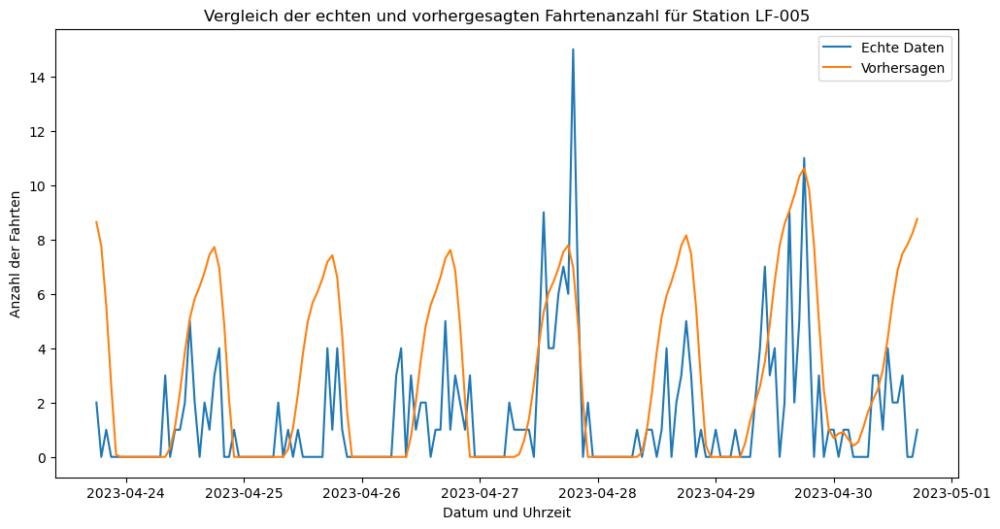

16:03:33 - cmdstanpy - INFO - Chain [1] start processing
16:03:33 - cmdstanpy - INFO - Chain [1] done processing


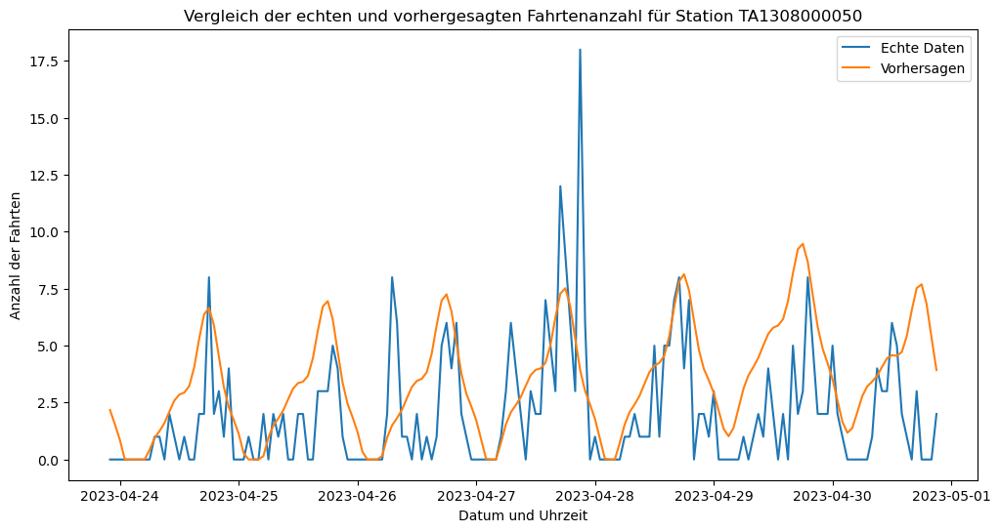

16:03:36 - cmdstanpy - INFO - Chain [1] start processing
16:03:36 - cmdstanpy - INFO - Chain [1] done processing


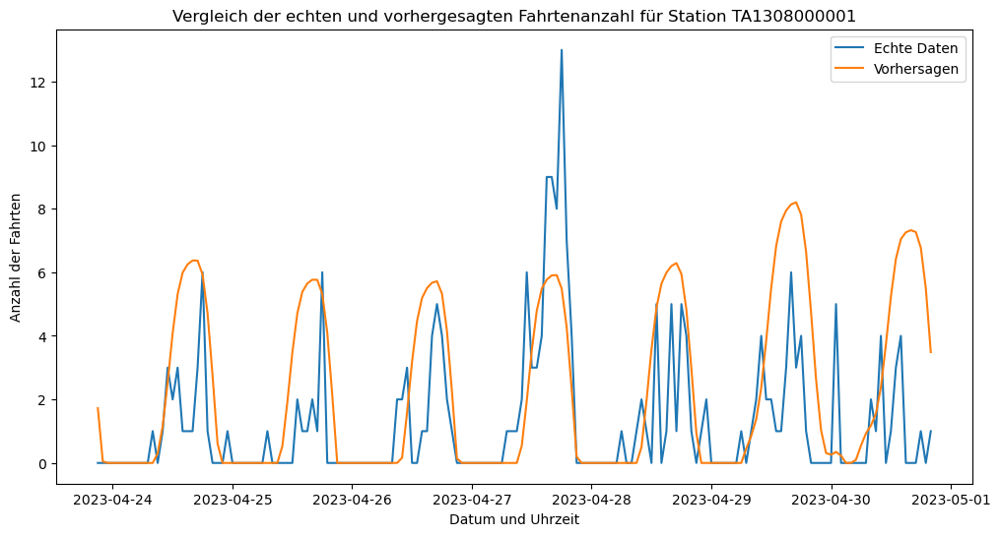

16:03:39 - cmdstanpy - INFO - Chain [1] start processing
16:03:39 - cmdstanpy - INFO - Chain [1] done processing


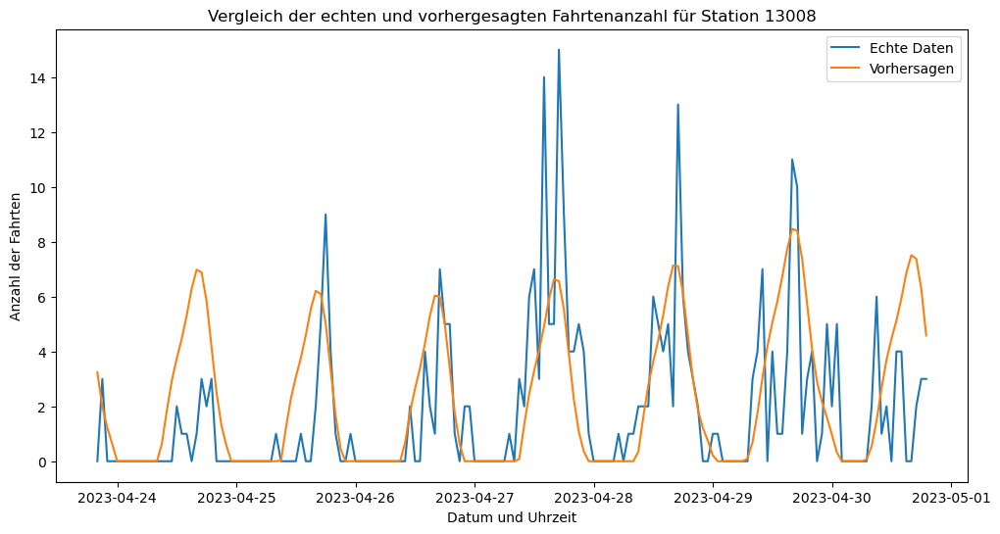

16:03:41 - cmdstanpy - INFO - Chain [1] start processing
16:03:42 - cmdstanpy - INFO - Chain [1] done processing


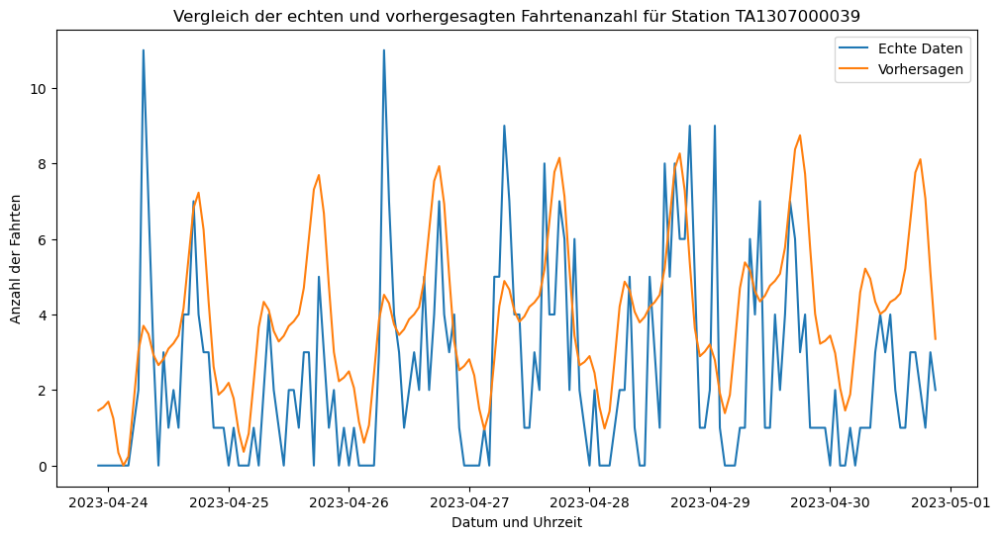

16:03:44 - cmdstanpy - INFO - Chain [1] start processing
16:03:45 - cmdstanpy - INFO - Chain [1] done processing


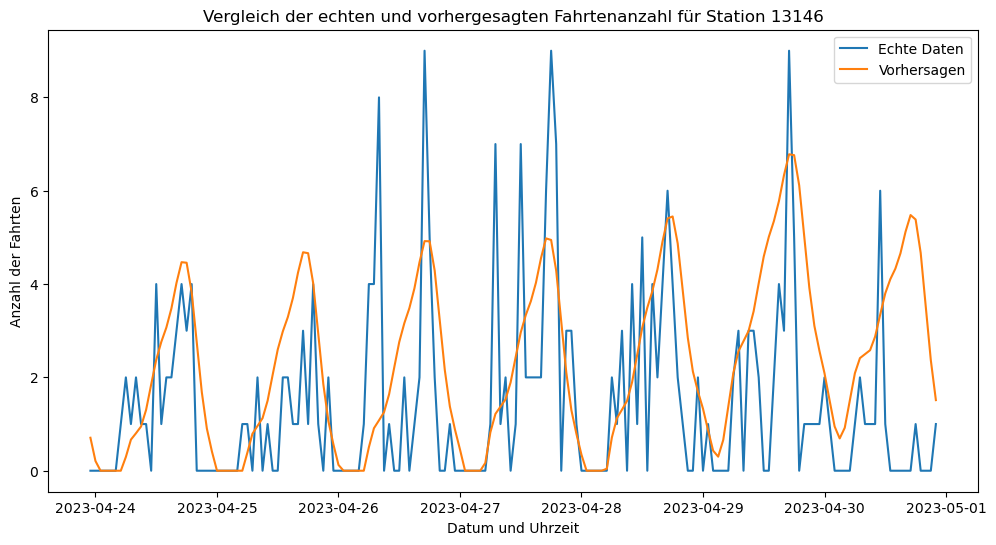

16:03:47 - cmdstanpy - INFO - Chain [1] start processing
16:03:47 - cmdstanpy - INFO - Chain [1] done processing


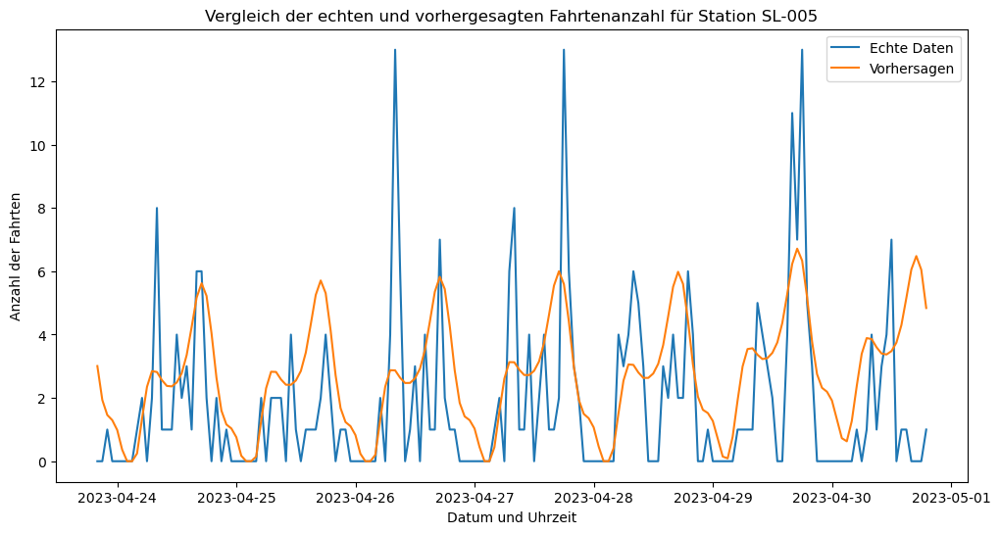

16:03:50 - cmdstanpy - INFO - Chain [1] start processing
16:03:50 - cmdstanpy - INFO - Chain [1] done processing


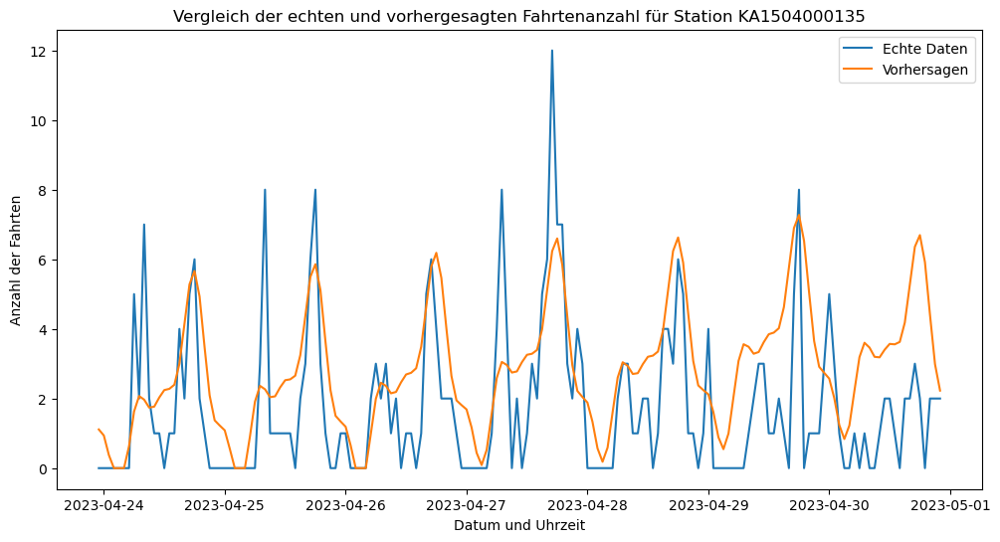

16:03:53 - cmdstanpy - INFO - Chain [1] start processing
16:03:53 - cmdstanpy - INFO - Chain [1] done processing


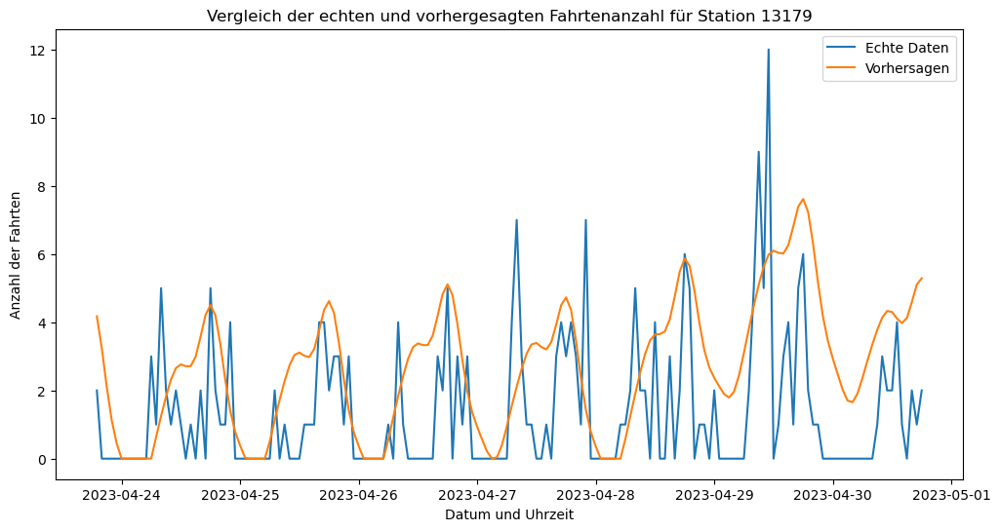

16:03:56 - cmdstanpy - INFO - Chain [1] start processing
16:03:57 - cmdstanpy - INFO - Chain [1] done processing


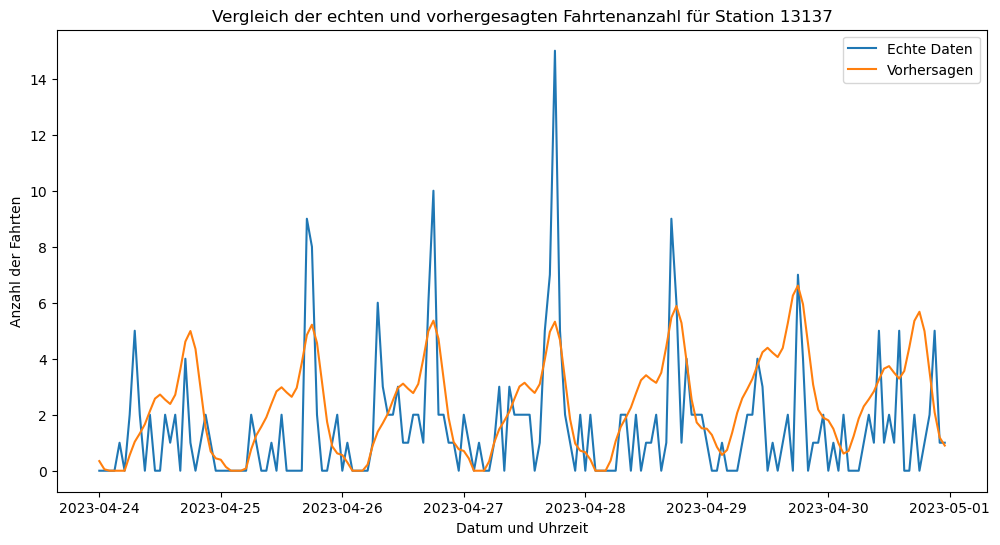

16:03:59 - cmdstanpy - INFO - Chain [1] start processing
16:04:00 - cmdstanpy - INFO - Chain [1] done processing


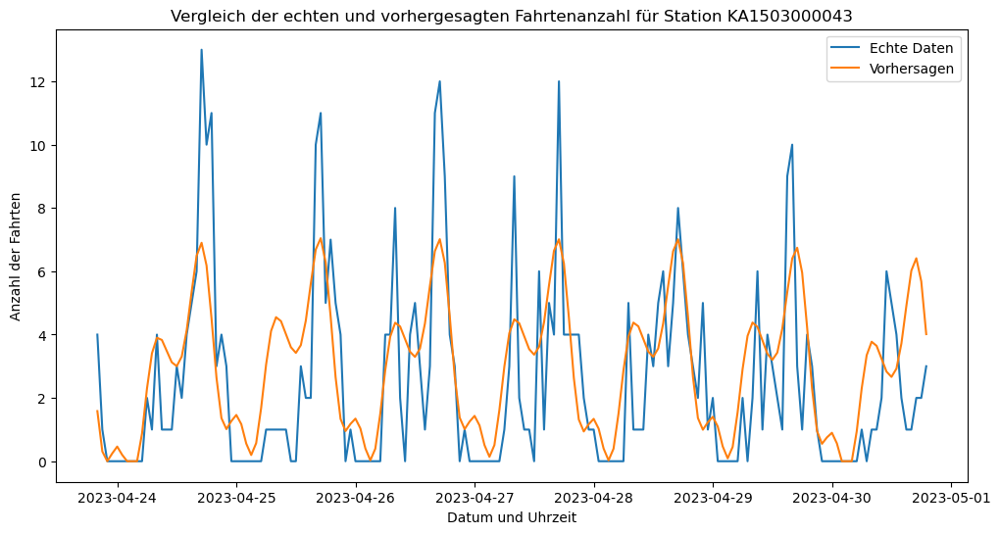

16:04:02 - cmdstanpy - INFO - Chain [1] start processing
16:04:02 - cmdstanpy - INFO - Chain [1] done processing


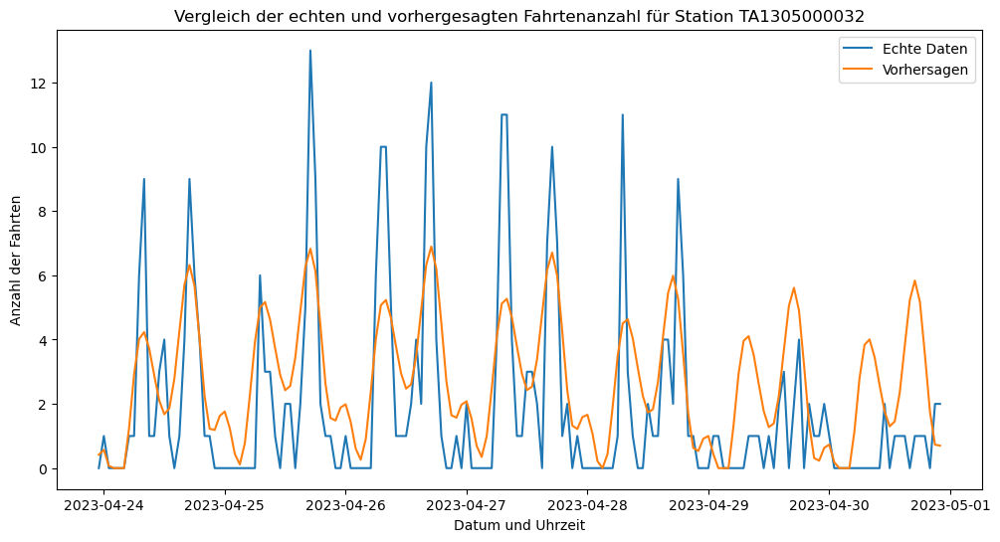

16:04:05 - cmdstanpy - INFO - Chain [1] start processing
16:04:05 - cmdstanpy - INFO - Chain [1] done processing


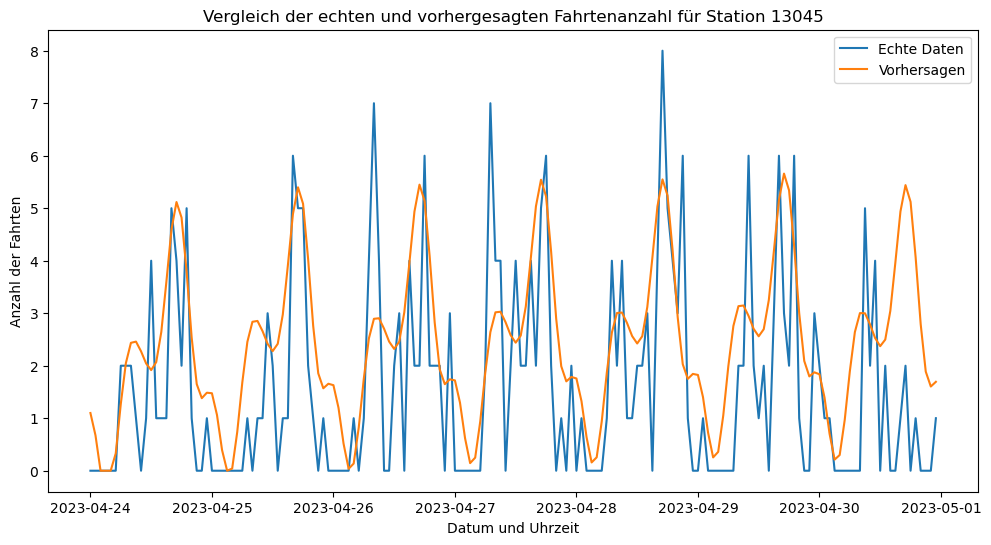

16:04:07 - cmdstanpy - INFO - Chain [1] start processing
16:04:08 - cmdstanpy - INFO - Chain [1] done processing


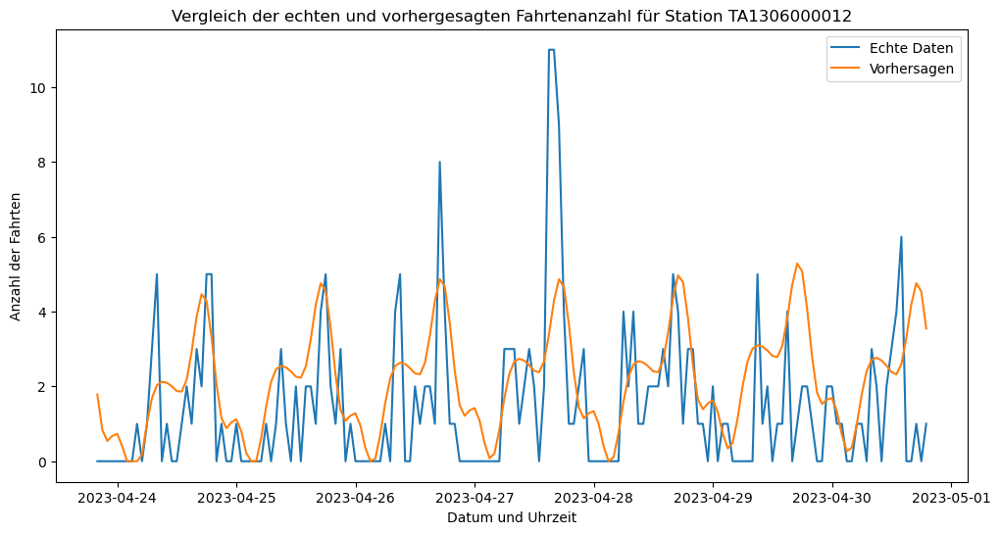

16:04:10 - cmdstanpy - INFO - Chain [1] start processing
16:04:10 - cmdstanpy - INFO - Chain [1] done processing


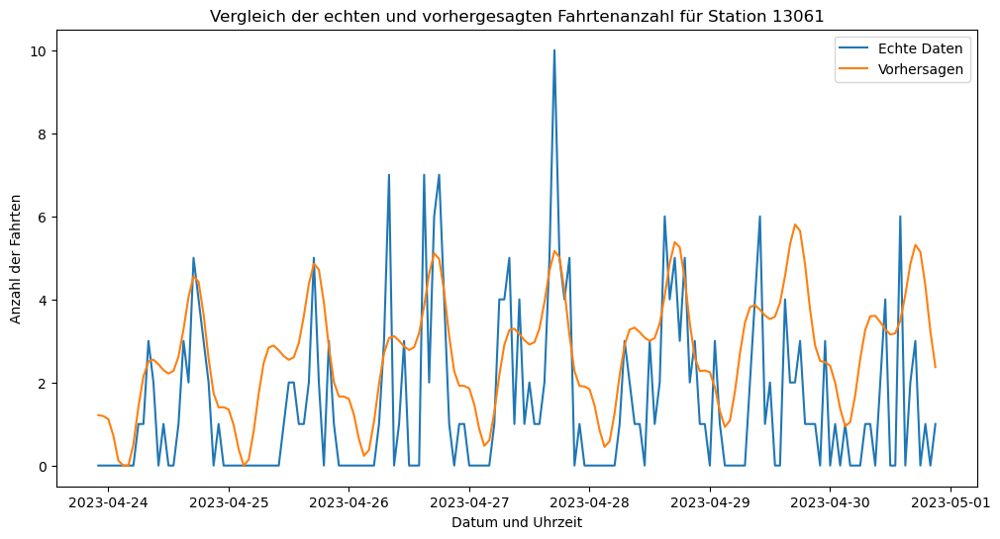

16:04:13 - cmdstanpy - INFO - Chain [1] start processing
16:04:13 - cmdstanpy - INFO - Chain [1] done processing


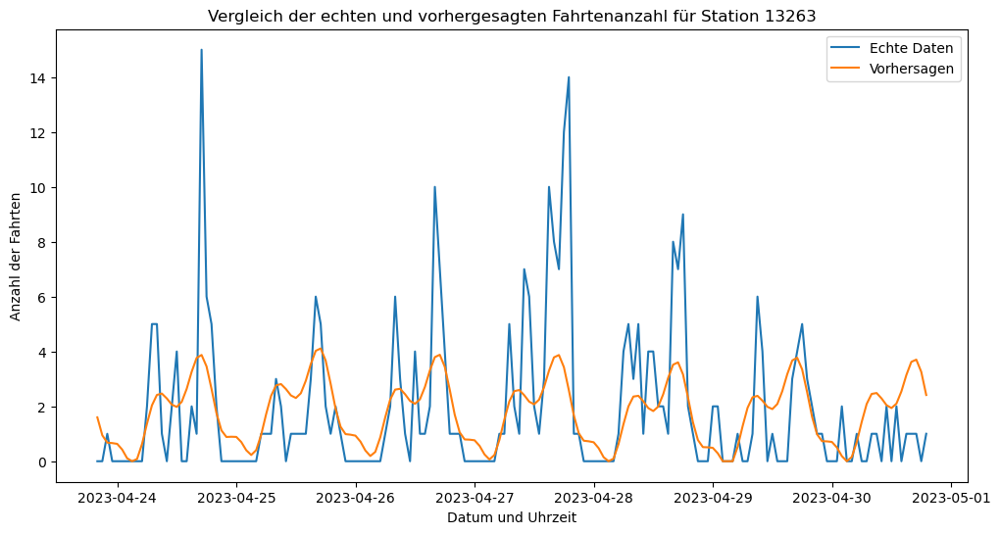

16:04:16 - cmdstanpy - INFO - Chain [1] start processing
16:04:16 - cmdstanpy - INFO - Chain [1] done processing


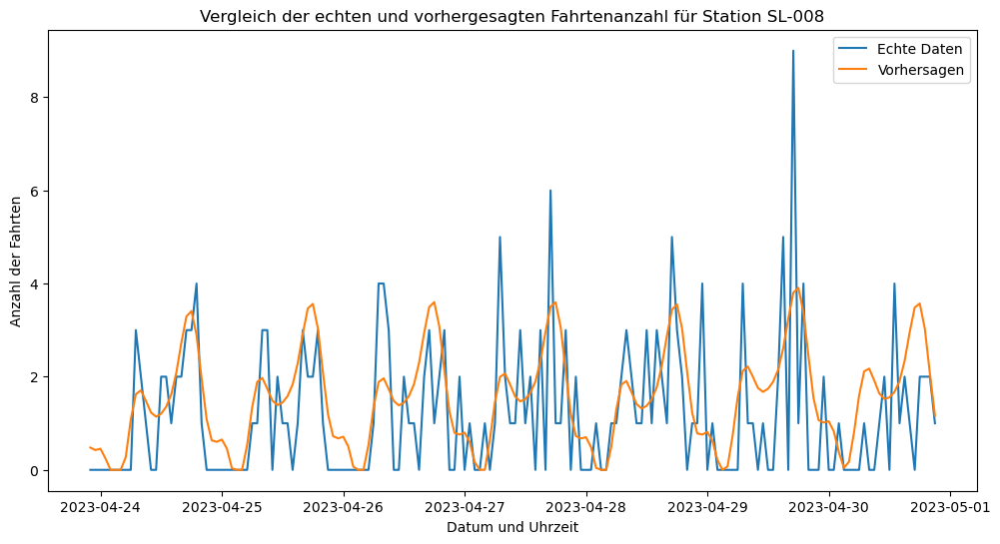

16:04:18 - cmdstanpy - INFO - Chain [1] start processing
16:04:18 - cmdstanpy - INFO - Chain [1] done processing


ValueError: too many values to unpack (expected 2)

In [114]:


# Daten einlesen und vorbereiten
df = pd.read_csv('data_start.csv')
df['started_at'] = pd.to_datetime(df['started_at'])
df['hour'] = df['started_at'].dt.hour
df['weekday'] = df['started_at'].dt.dayofweek
df['weekday_hour'] = df['weekday'].astype(str) + "_" + df['hour'].astype(str).str.zfill(2)
df.reset_index(inplace=True)

# Wichtige Stationen identifizieren
threshold = 20
important_stations_df = station_counts[station_counts.groupby('cluster')['cumulative_percentage'].apply(lambda x: x <= threshold)]
important_station_ids = important_stations_df['station'].unique()

# Speichern der Vorhersagen und Bewertungsergebnisse
forecasts_approach1 = {}
evaluation_results1 = {}

# Ansatz 1: Prognose auf Stundenbasis mit Prophet
for station_id in important_station_ids:
    station_data = df[df['start_station_id'] == station_id]
    hourly_data = station_data.resample('H', on='started_at').count()['ride_id'].reset_index(name='y')
    hourly_data.rename(columns={'started_at': 'ds'}, inplace=True)

    test_size = 168  # 7 Tage * 24 Stunden
    train_data = hourly_data[:-test_size]
    test_data = hourly_data[-test_size:]

    model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
    model.fit(train_data)

    future = model.make_future_dataframe(periods=test_size, freq='H')
    forecast = model.predict(future)
    forecast['yhat'] = forecast['yhat'].clip(lower=0)

    forecasted_values = forecast['yhat'][-test_size:]
    forecasts_approach1[station_id] = forecasted_values.reset_index(drop=True)

    actual_values = test_data['y']
    mse = mean_squared_error(actual_values, forecasted_values)
    mae = mean_absolute_error(actual_values, forecasted_values)
    evaluation_results1[station_id] = {'MSE': mse, 'MAE': mae}

    plt.figure(figsize=(12, 6))
    plt.plot(test_data['ds'], actual_values, label='Echte Daten')
    plt.plot(test_data['ds'], forecasted_values, label='Vorhersagen')
    plt.title(f"Vergleich der echten und vorhergesagten Fahrtenanzahl für Station {station_id}")
    plt.xlabel('Datum und Uhrzeit')
    plt.ylabel('Anzahl der Fahrten')
    plt.legend()
    plt.show()

# Ansatz 2: Prognose auf stündlicher Basis mit aggregierten Daten und demand_patterns
station_forecasts = {}
evaluation_results2 = {}

for station_id in important_station_ids:
    station_data = df[df['start_station_id'] == station_id]
    station_data.set_index('started_at', inplace=True)  # Setzen von started_at als Index

    # Aggregation der Daten auf Wochenbasis
    weekly_data = station_data.resample('W').count()['ride_id'].reset_index(name='y')
    weekly_data.rename(columns={'started_at': 'ds'}, inplace=True)

    # Training und Vorhersage mit Prophet
    if len(weekly_data) > 4:  # Sicherstellen, dass genügend Daten vorhanden sind
        train_data = weekly_data[:-1]
        test_data = weekly_data[-1:]

        model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
        model.fit(train_data[['ds', 'y']])
        future = model.make_future_dataframe(periods=1, freq='W')
        forecast = model.predict(future)

        # Anwendung des demand_patterns, um stündliche Vorhersagen zu erhalten
        last_week_forecast = forecast.iloc[-1]['yhat']  # Vorhersage der letzten Woche
        cluster_id = df[df['start_station_id'] == station_id]['cluster'].iloc[0]
        hourly_proportions = demand_patterns[cluster_id]
        
        detailed_forecasts = {}
        for (weekday, hour), proportion in hourly_proportions.items():
            forecast_value = last_week_forecast * proportion
            detailed_forecasts[(weekday, hour)] = forecast_value
        station_forecasts[station_id] = detailed_forecasts 

                # Bereinigen der NaN-Werte und Anpassen der Längen der Daten
        # Bereinigen der NaN-Werte und Anpassen der Längen der Daten
        last_week_actuals_cleaned = last_week_actuals.dropna().iloc[:len(detailed_forecasts_cleaned)]
        detailed_forecasts_cleaned = pd.Series(detailed_forecasts).dropna().iloc[:len(last_week_actuals_cleaned)]

        # Berechnung der Fehlermetriken
        mse = mean_squared_error(last_week_actuals_cleaned, detailed_forecasts_cleaned)
        mae = mean_absolute_error(last_week_actuals_cleaned, detailed_forecasts_cleaned)
        evaluation_results2[station_id] = {'MSE': mse, 'MAE': mae}

      # Umwandeln des Index in einen lesbaren String
        last_week_actuals_formatted_index = [f"{day}-{hour}" for day, hour in last_week_actuals.index]
        detailed_forecasts_formatted_index = [f"{day}-{hour}" for day, hour in detailed_forecasts_series.index]

        # Plotten
        plt.figure(figsize=(14, 7))
        plt.plot(last_week_actuals_formatted_index, last_week_actuals.values, label='Tatsächliche Fahrten', marker='o')
        plt.plot(detailed_forecasts_formatted_index, detailed_forecasts_series.values, label='Vorhergesagte Fahrten', marker='x')

        # Weitere Plot-Einstellungen
        plt.title(f'Vergleich der tatsächlichen und vorhergesagten Fahrtenanzahl für Station {station_id}')
        plt.xlabel('Wochentag-Stunde')
        plt.ylabel('Anzahl der Fahrten')
        plt.xticks(rotation=90)  # Drehen Sie die X-Achsen-Beschriftungen für bessere Lesbarkeit
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()

    else:
        print(f"Nicht genügend Daten für Station {station_id} zur Analyse vorhanden.")


In [105]:
forecasts

{'WL-012': ds
 2023-04-23 19:00:00    2.499432
 2023-04-23 20:00:00    0.000000
 2023-04-23 21:00:00    0.000000
 2023-04-23 22:00:00    0.000000
 2023-04-23 23:00:00    0.197244
                          ...   
 2023-04-30 14:00:00    2.028566
 2023-04-30 15:00:00    4.754857
 2023-04-30 16:00:00    7.087907
 2023-04-30 17:00:00    7.683198
 2023-04-30 18:00:00    6.101794
 Name: yhat, Length: 168, dtype: float64,
 '13016': ds
 2023-04-23 20:00:00    0.000000
 2023-04-23 21:00:00    0.000000
 2023-04-23 22:00:00    0.131155
 2023-04-23 23:00:00    0.099988
 2023-04-24 00:00:00    0.000000
                          ...   
 2023-04-30 15:00:00    6.616732
 2023-04-30 16:00:00    7.351066
 2023-04-30 17:00:00    6.226471
 2023-04-30 18:00:00    3.902139
 2023-04-30 19:00:00    1.697100
 Name: yhat, Length: 168, dtype: float64,
 '13001': ds
 2023-04-23 20:00:00    1.134873
 2023-04-23 21:00:00    0.410207
 2023-04-23 22:00:00    0.357008
 2023-04-23 23:00:00    0.460953
 2023-04-24 00:00:

In [68]:
df = pd.read_csv('data_start.csv')


# DataFrame vorbereiten
df = df.copy()
df['started_at'] = pd.to_datetime(df['started_at'])

# Erstellung des Demand Patterns für jedes Cluster
demand_patterns = {}
for cluster_id in df['cluster'].unique():
    cluster_data = df[df['cluster'] == cluster_id]
    hourly_counts = cluster_data.groupby(['weekday', 'hour']).size()
    total_rides = hourly_counts.sum()
    demand_pattern = hourly_counts / total_rides
    demand_patterns[cluster_id] = demand_pattern

# Speichern der Vorhersagen in einem Dictionary
forecasts_approach2 = {}
evaluation_results = {}

for station_id in important_station_ids:
    station_data = df[df['start_station_id'] == station_id]
    station_data.set_index('started_at', inplace=True)  # Sicherstellen, dass der Index korrekt gesetzt ist

    if station_data.empty:
        print(f"Keine Daten vorhanden für Station {station_id}.")
        continue  # Keine Daten zu aggregieren, überspringen Sie diese Station

    weekly_data = station_data.resample('W').count()['ride_id'].reset_index(name='y')  # Korrektur hier
    weekly_data.rename(columns={'started_at': 'ds'}, inplace=True)

    if len(weekly_data) > 4:
        train_data = weekly_data[:-1]
        test_data = weekly_data[-1:]

        model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
        model.fit(train_data[['ds', 'y']])
        future = model.make_future_dataframe(periods=1, freq='W')
        forecast = model.predict(future)

        last_week_forecast = forecast.iloc[-1]['yhat']
        cluster_id = df[df['start_station_id'] == station_id]['cluster'].iloc[0]
        hourly_proportions = demand_patterns[cluster_id]

        detailed_forecasts = {f"{weekday}-{str(hour).zfill(2)}": last_week_forecast * proportion for (weekday, hour), proportion in hourly_proportions.items()}
        forecasts_approach2[station_id] = pd.Series(detailed_forecasts)

        last_week_data = station_data.last('1W')  # Dies sollte jetzt ohne Fehler funktionieren
        last_week_actuals = last_week_data.resample('H').sum()['ride_id']
        last_week_actuals.index = last_week_actuals.index.map(lambda dt: (dt.weekday(), dt.hour))
        all_hours = pd.MultiIndex.from_product([range(7), range(24)], names=['day', 'hour'])
        last_week_actuals = last_week_actuals.reindex(all_hours, fill_value=0)

        mse = mean_squared_error(last_week_actuals, detailed_forecasts_series)
        mae = mean_absolute_error(last_week_actuals, detailed_forecasts_series)
        evaluation_results[station_id] = {'MSE': mse, 'MAE': mae}

        plt.figure(figsize=(14, 7))
        plt.plot([f"{day}-{hour}" for day, hour in last_week_actuals.index], last_week_actuals.values, label='Tatsächliche Fahrten', marker='o')
        plt.plot([f"{day}-{hour}" for day, hour in detailed_forecasts_series.index], detailed_forecasts_series.values, label='Vorhergesagte Fahrten', marker='x')
        plt.title(f'Vergleich der tatsächlichen und vorhergesagten Fahrtenanzahl für Station {station_id}')
        plt.xlabel('Wochentag-Stunde')
        plt.ylabel('Anzahl der Fahrten')
        plt.xticks(rotation=90)
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()
    else:
        print(f"Nicht genügend Daten für Station {station_id} zur Analyse vorhanden.")



14:39:24 - cmdstanpy - INFO - Chain [1] start processing
14:39:24 - cmdstanpy - INFO - Chain [1] done processing
/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_1559/2921028038.py:49: FutureWarning: The default value of numeric_only in DataFrameGroupBy.sum is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  last_week_actuals = last_week_data.resample('H').sum()['ride_id']


KeyError: 'ride_id'

In [60]:
station_data # Überprüfen Sie die Spaltennamen


,Unnamed: 0,index,ride_id,rideable_type,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,ride_duration,cluster,hour,weekday
started_at,,,,,,,,,,,,,,,,,,
2022-05-29 00:04:48,1033,1263,71C7A029C20878C6,electric_bike,2022-05-29 00:14:25,Clinton St & Washington Blvd,WL-012,LaSalle St & Illinois St,13430,41.883537,-87.641345,41.890762,-87.631697,casual,9.616667,0,0,6
2022-05-27 16:57:52,1851,2255,EB3413D6B8227B13,classic_bike,2022-05-27 17:04:18,Clinton St & Washington Blvd,WL-012,Milwaukee Ave & Grand Ave,13033,41.883380,-87.641170,41.891578,-87.648384,member,6.433333,0,16,4
2022-05-02 08:57:01,2167,2690,276CCDCF883DDA9A,electric_bike,2022-05-02 09:07:41,Clinton St & Washington Blvd,WL-012,Hermitage Ave & Polk St,13080,41.883139,-87.641365,41.871514,-87.669886,member,10.666667,0,8,0
2022-05-02 09:46:18,2311,2899,64791501B89141CB,classic_bike,2022-05-02 09:57:22,Clinton St & Washington Blvd,WL-012,Halsted St & Polk St,TA1307000121,41.883380,-87.641170,41.871840,-87.646640,member,11.066667,0,9,0
2022-05-24 08:58:49,3120,3903,75E1C49A691434C4,classic_bike,2022-05-24 09:09:05,Clinton St & Washington Blvd,WL-012,Dearborn St & Erie St,13045,41.883380,-87.641170,41.893992,-87.629318,member,10.266667,0,8,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-04-27 17:47:01,3591758,5853628,D323A2FDECC0FB9E,electric_bike,2023-04-27 18:00:50,Clinton St & Washington Blvd,WL-012,Blue Island Ave & 18th St,13135,41.883508,-87.641389,41.857556,-87.661535,member,13.816667,0,17,3
2023-04-02 15:21:36,3591759,5853629,6A605728693CA580,classic_bike,2023-04-02 15:35:32,Clinton St & Washington Blvd,WL-012,May St & Taylor St,13160,41.883380,-87.641170,41.869482,-87.655486,member,13.933333,0,15,6
2023-04-12 08:52:35,3591761,5853631,17A1137CAB727E7A,classic_bike,2023-04-12 09:00:42,Clinton St & Washington Blvd,WL-012,Clark St & Ida B Wells Dr,TA1305000009,41.883380,-87.641170,41.875933,-87.630585,member,8.116667,0,8,2


15:53:53 - cmdstanpy - INFO - Chain [1] start processing
15:53:53 - cmdstanpy - INFO - Chain [1] done processing


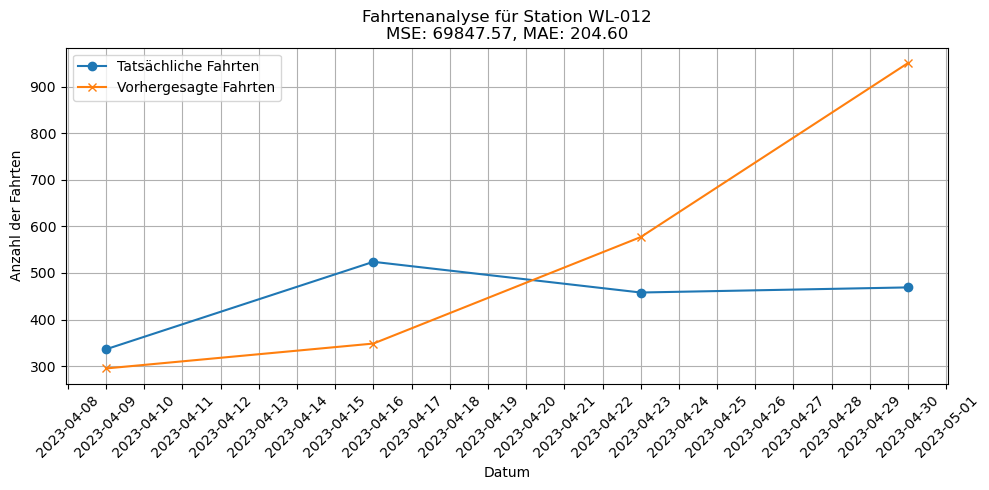

15:53:54 - cmdstanpy - INFO - Chain [1] start processing
15:53:54 - cmdstanpy - INFO - Chain [1] done processing


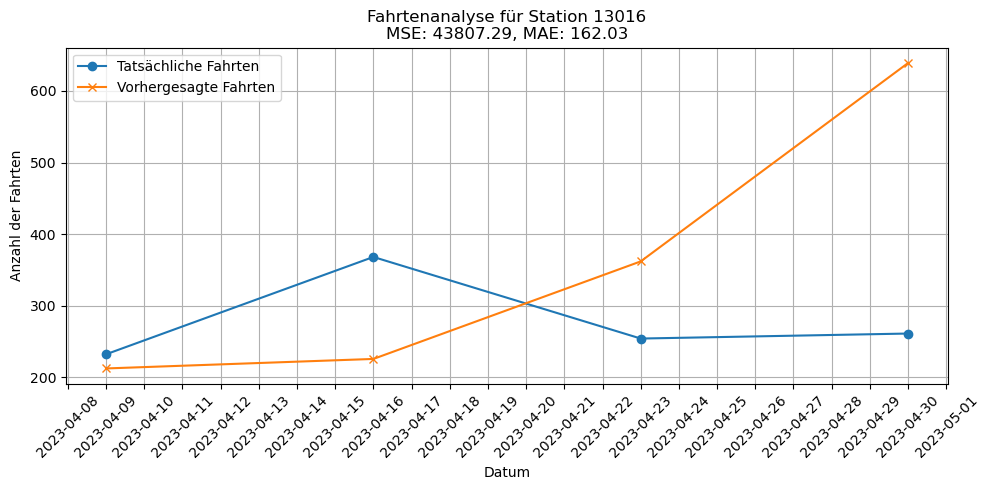

15:53:54 - cmdstanpy - INFO - Chain [1] start processing
15:53:54 - cmdstanpy - INFO - Chain [1] done processing


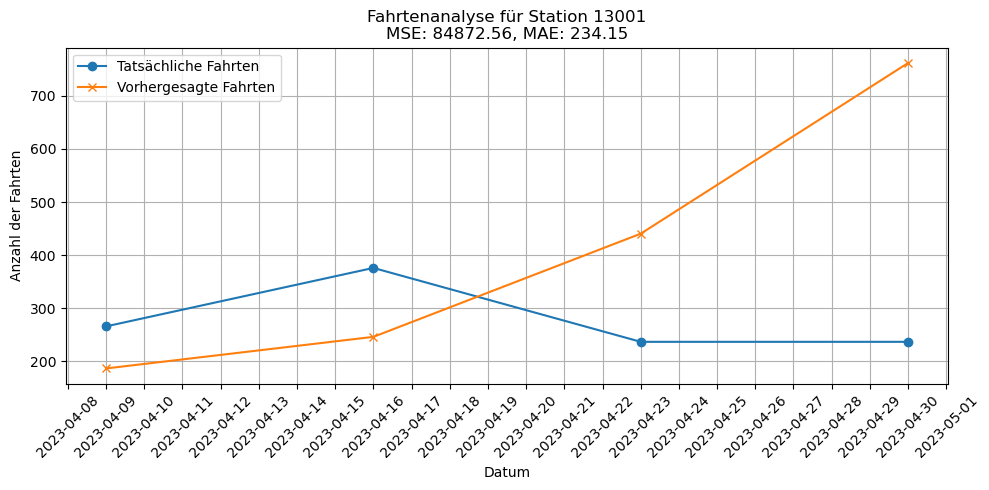

15:53:55 - cmdstanpy - INFO - Chain [1] start processing
15:53:55 - cmdstanpy - INFO - Chain [1] done processing


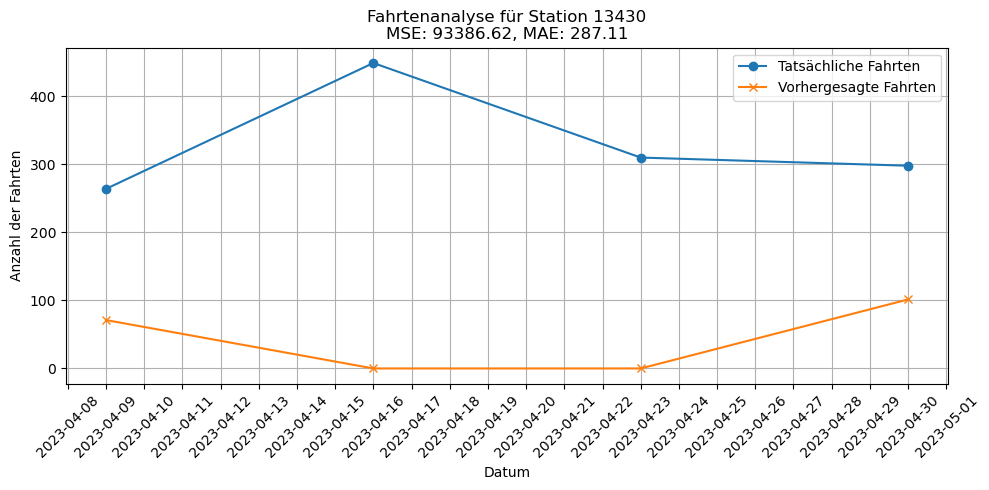

15:53:56 - cmdstanpy - INFO - Chain [1] start processing
15:53:56 - cmdstanpy - INFO - Chain [1] done processing


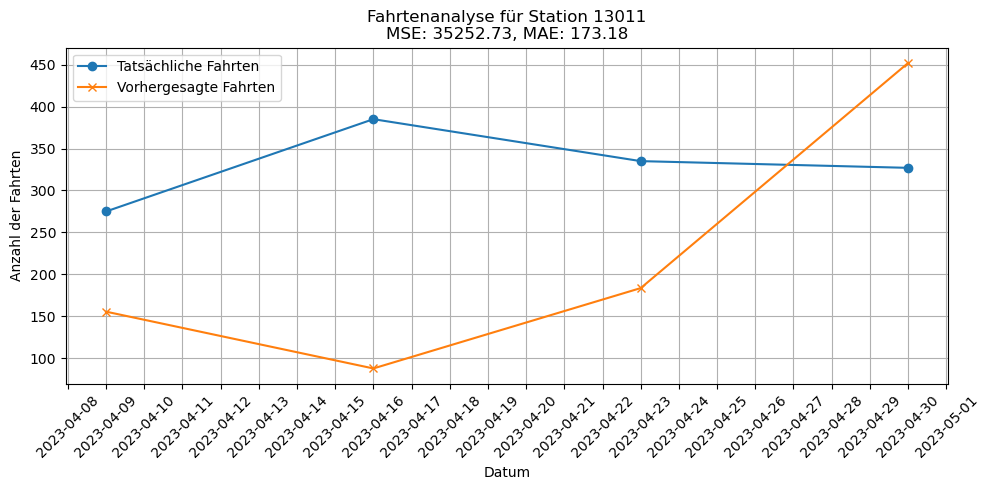

15:53:56 - cmdstanpy - INFO - Chain [1] start processing
15:53:56 - cmdstanpy - INFO - Chain [1] done processing


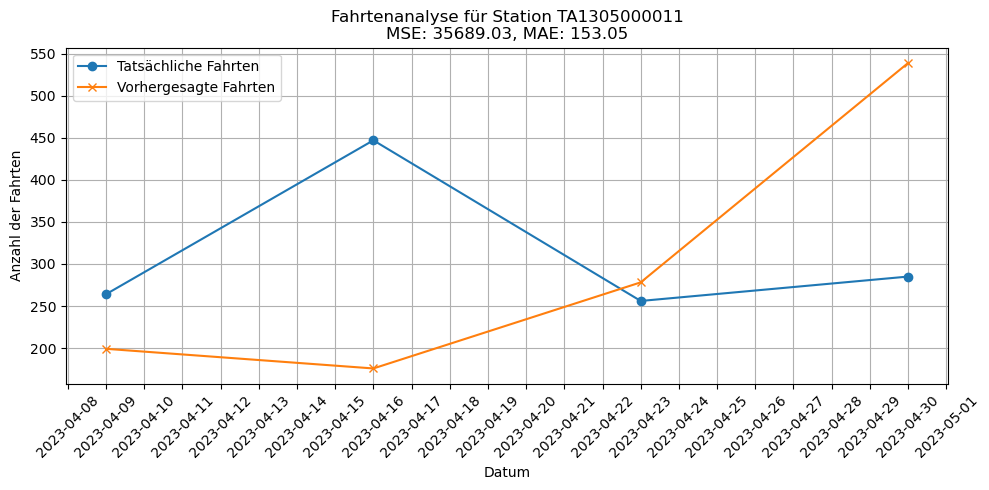

15:53:57 - cmdstanpy - INFO - Chain [1] start processing
15:53:57 - cmdstanpy - INFO - Chain [1] done processing


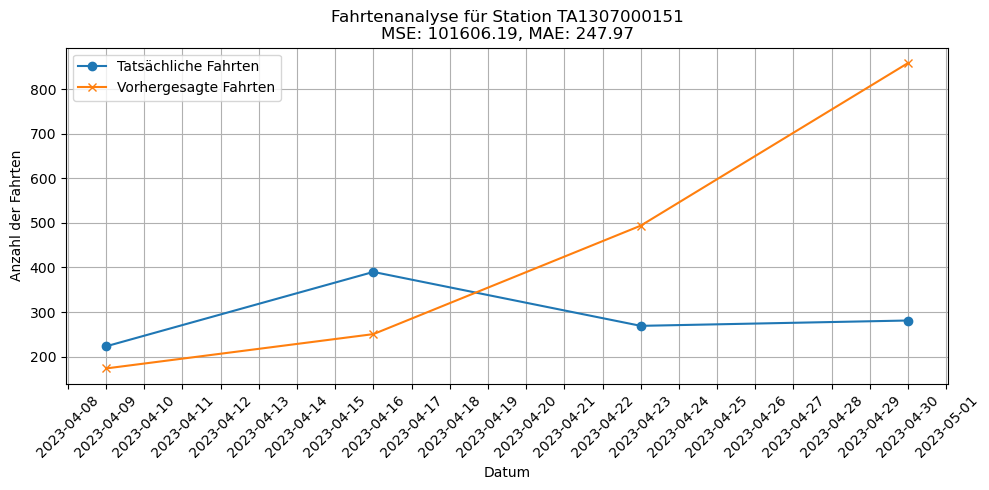

15:53:57 - cmdstanpy - INFO - Chain [1] start processing
15:53:57 - cmdstanpy - INFO - Chain [1] done processing


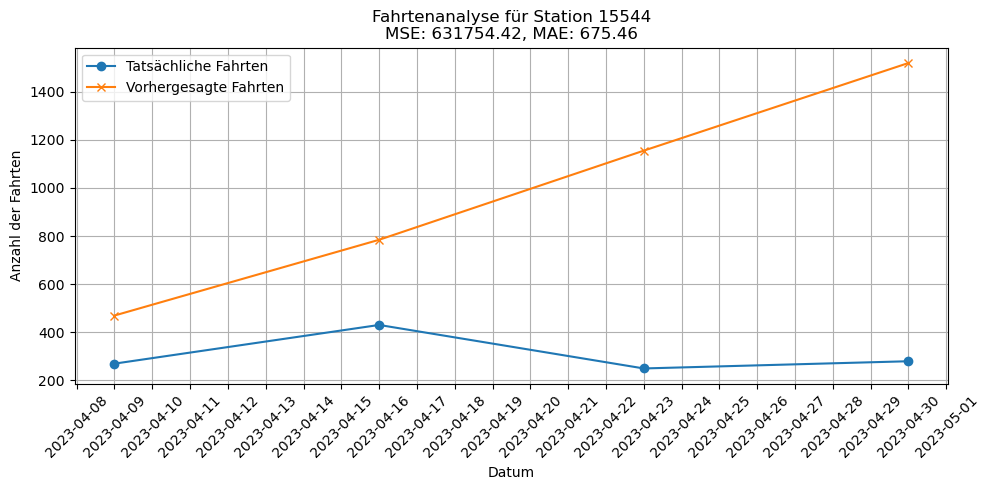

15:53:58 - cmdstanpy - INFO - Chain [1] start processing
15:53:58 - cmdstanpy - INFO - Chain [1] done processing


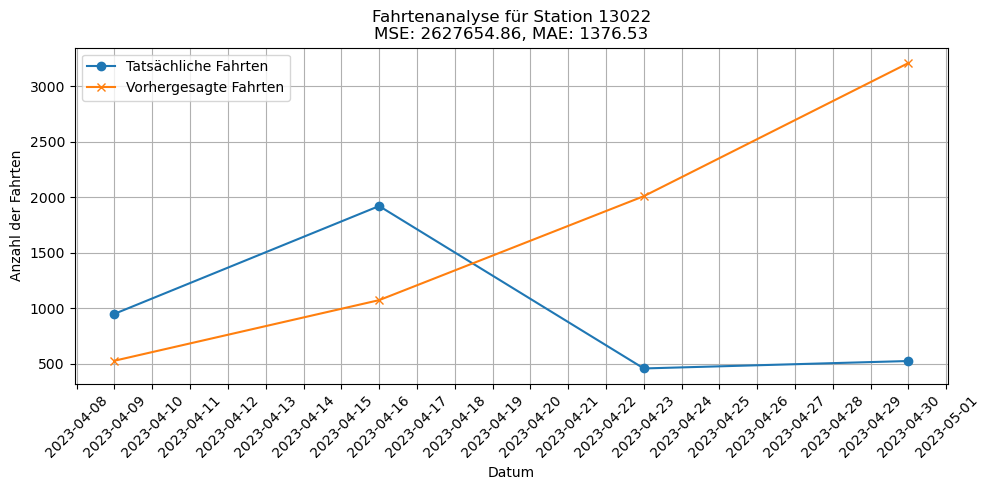

15:53:59 - cmdstanpy - INFO - Chain [1] start processing
15:53:59 - cmdstanpy - INFO - Chain [1] done processing


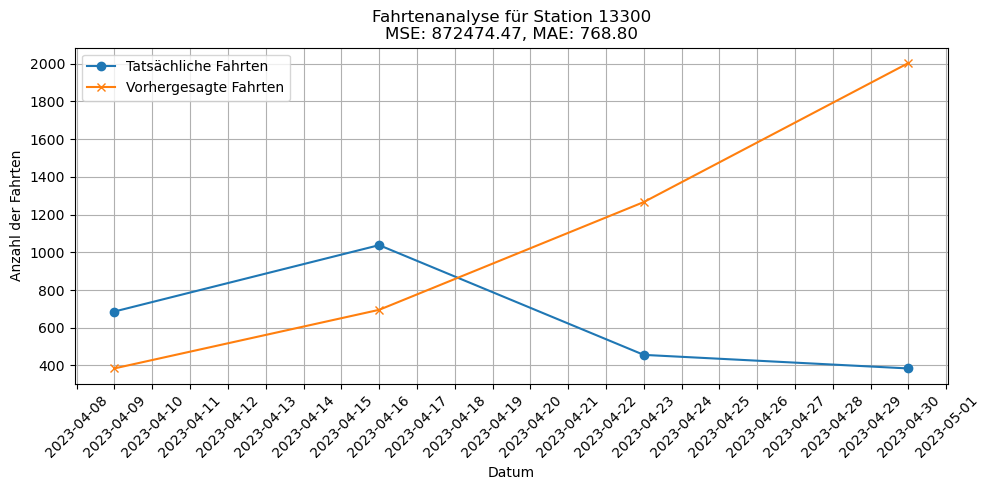

15:53:59 - cmdstanpy - INFO - Chain [1] start processing
15:53:59 - cmdstanpy - INFO - Chain [1] done processing


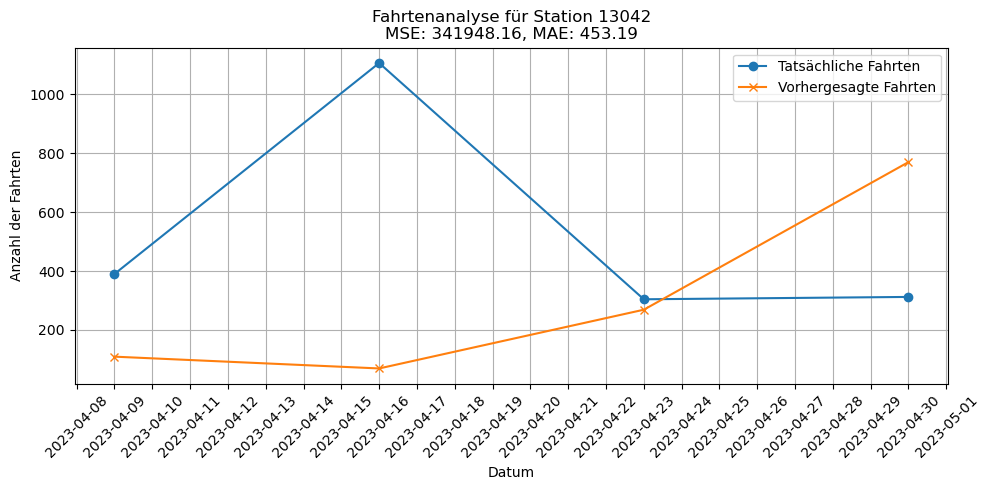

15:54:00 - cmdstanpy - INFO - Chain [1] start processing
15:54:00 - cmdstanpy - INFO - Chain [1] done processing


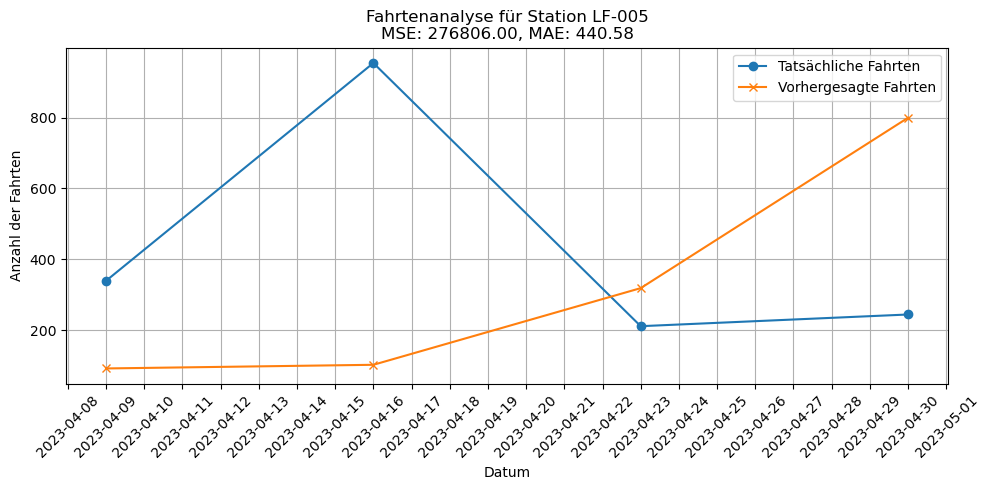

15:54:01 - cmdstanpy - INFO - Chain [1] start processing
15:54:01 - cmdstanpy - INFO - Chain [1] done processing


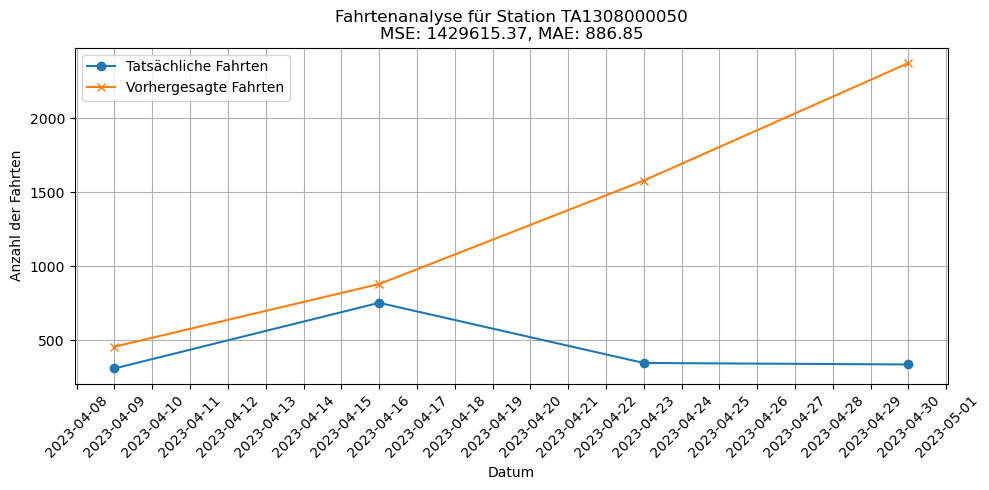

15:54:01 - cmdstanpy - INFO - Chain [1] start processing
15:54:01 - cmdstanpy - INFO - Chain [1] done processing


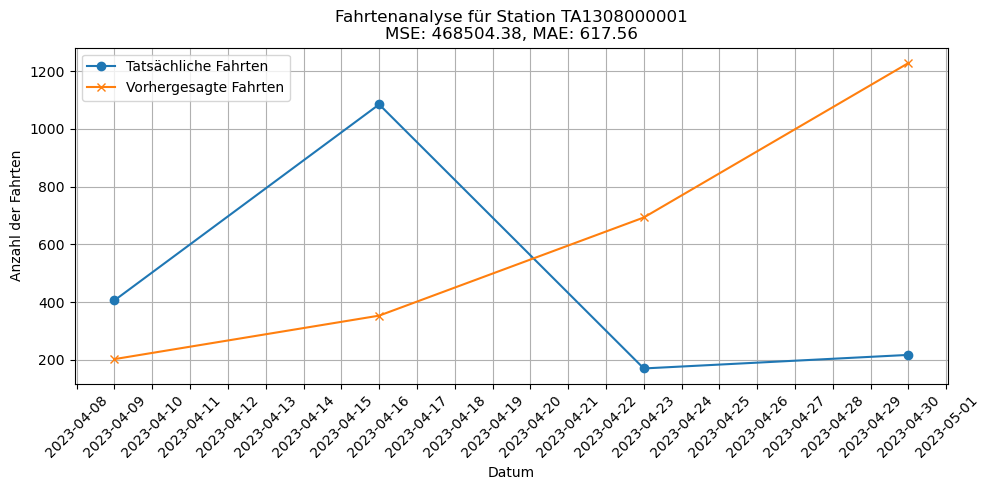

15:54:02 - cmdstanpy - INFO - Chain [1] start processing
15:54:02 - cmdstanpy - INFO - Chain [1] done processing


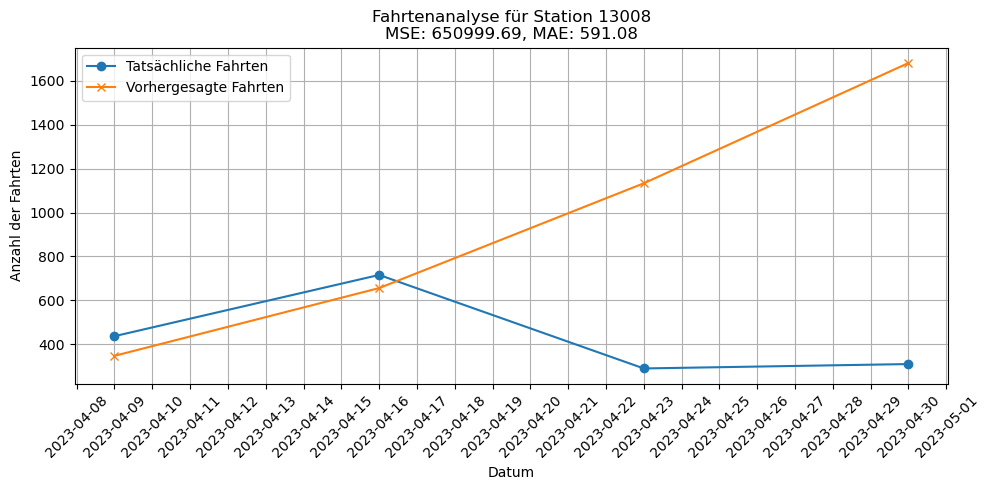

15:54:03 - cmdstanpy - INFO - Chain [1] start processing
15:54:03 - cmdstanpy - INFO - Chain [1] done processing


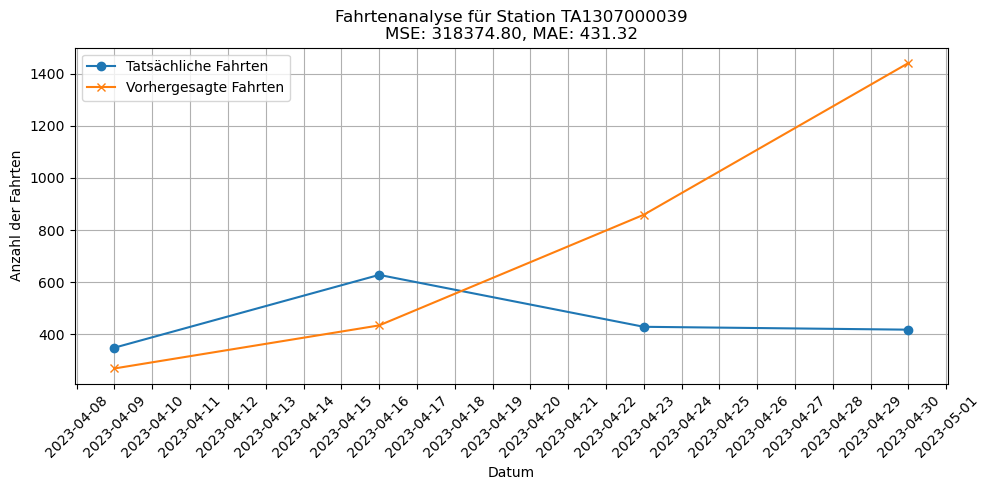

15:54:03 - cmdstanpy - INFO - Chain [1] start processing
15:54:04 - cmdstanpy - INFO - Chain [1] done processing


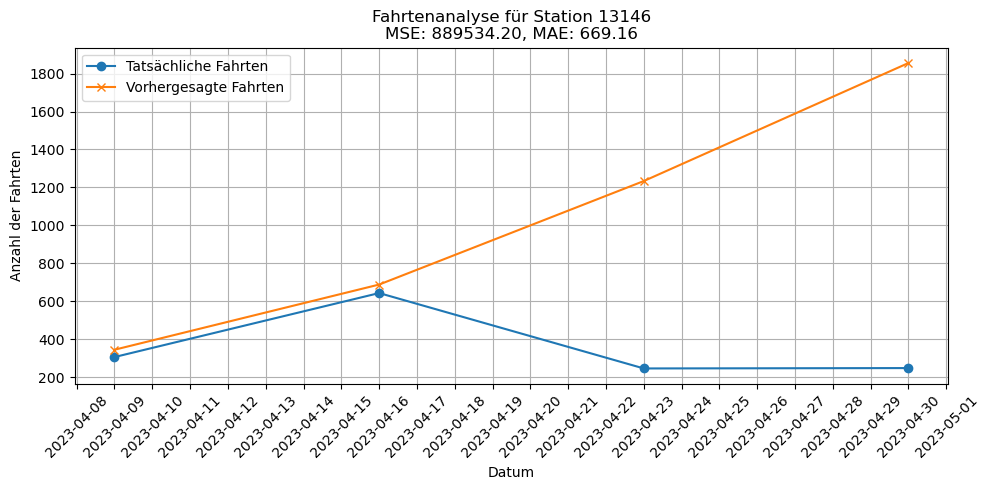

15:54:04 - cmdstanpy - INFO - Chain [1] start processing
15:54:05 - cmdstanpy - INFO - Chain [1] done processing


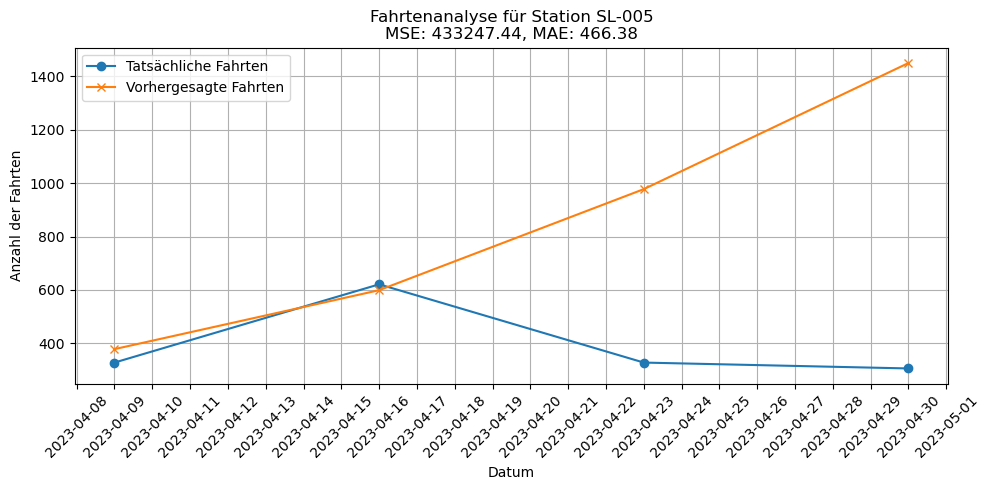

15:54:05 - cmdstanpy - INFO - Chain [1] start processing
15:54:05 - cmdstanpy - INFO - Chain [1] done processing


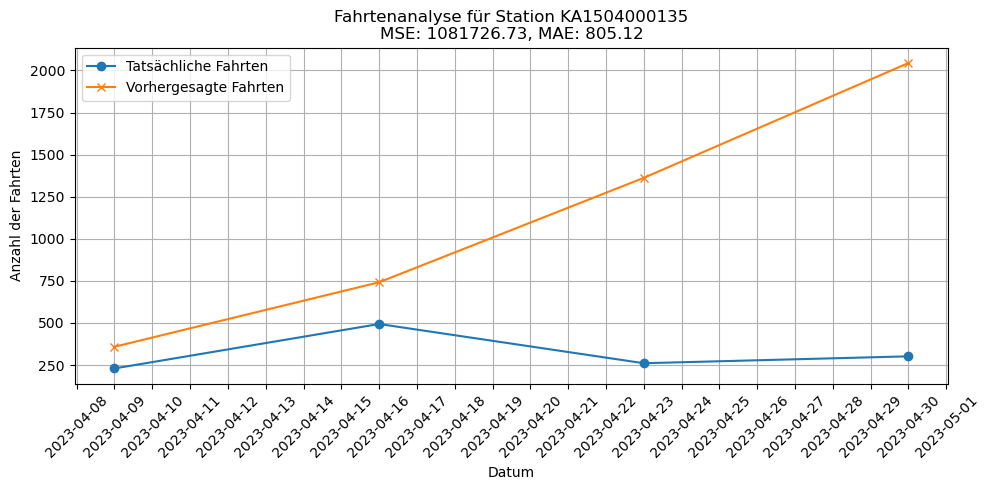

15:54:06 - cmdstanpy - INFO - Chain [1] start processing
15:54:06 - cmdstanpy - INFO - Chain [1] done processing


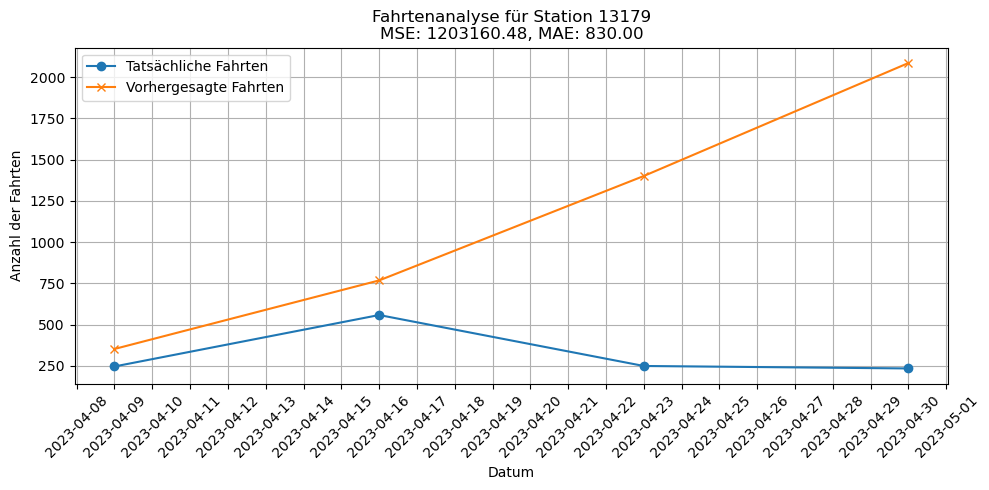

15:54:07 - cmdstanpy - INFO - Chain [1] start processing
15:54:07 - cmdstanpy - INFO - Chain [1] done processing


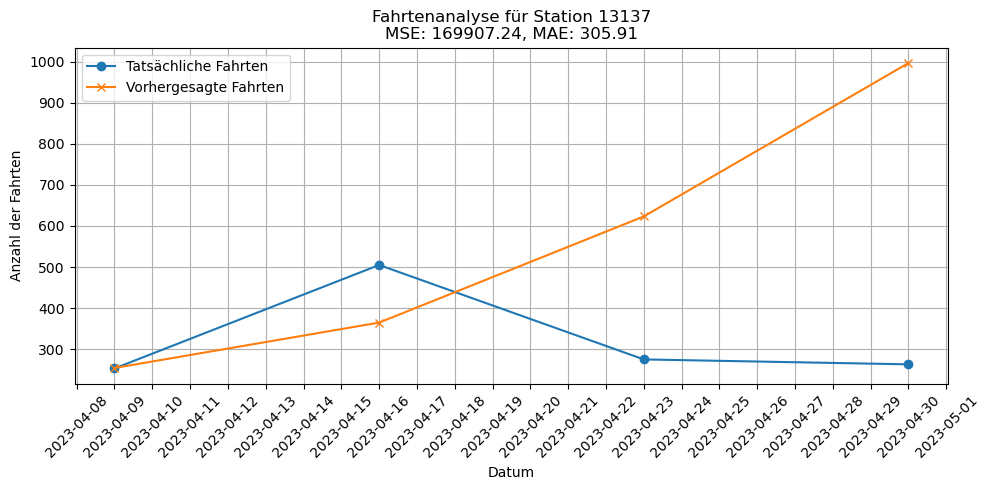

15:54:13 - cmdstanpy - INFO - Chain [1] start processing
15:54:13 - cmdstanpy - INFO - Chain [1] done processing


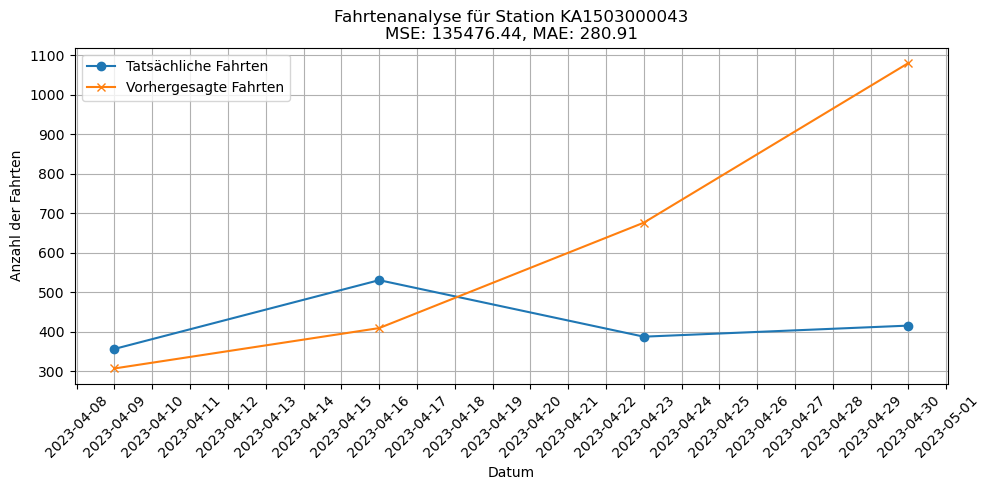

15:54:13 - cmdstanpy - INFO - Chain [1] start processing
15:54:14 - cmdstanpy - INFO - Chain [1] done processing


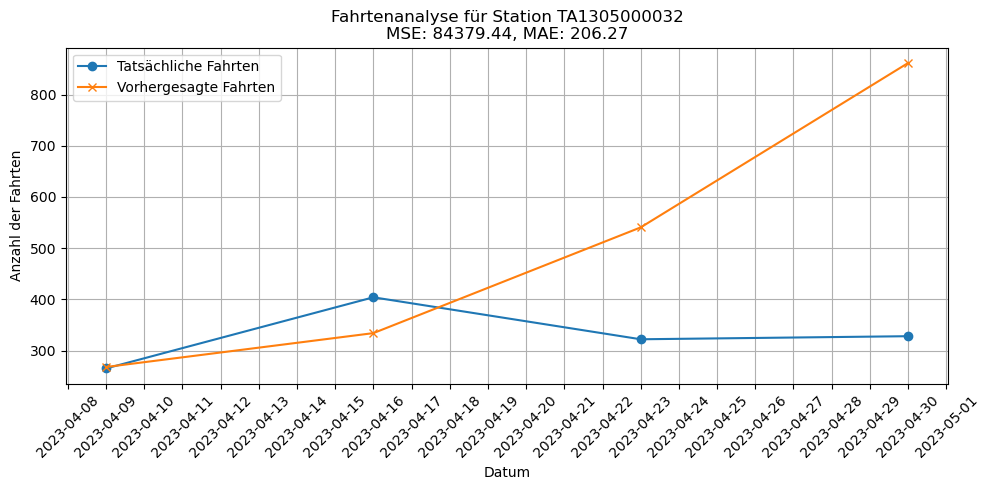

15:54:15 - cmdstanpy - INFO - Chain [1] start processing
15:54:15 - cmdstanpy - INFO - Chain [1] done processing


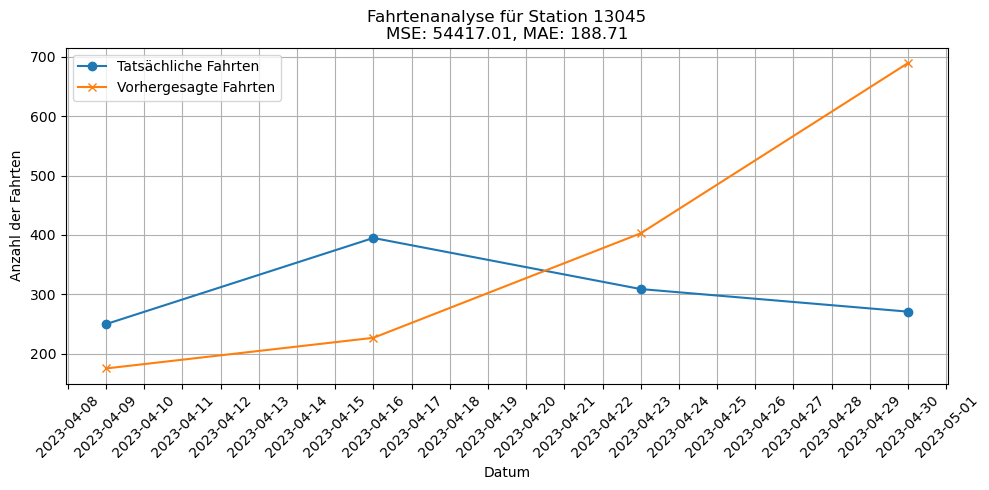

15:54:15 - cmdstanpy - INFO - Chain [1] start processing
15:54:16 - cmdstanpy - INFO - Chain [1] done processing


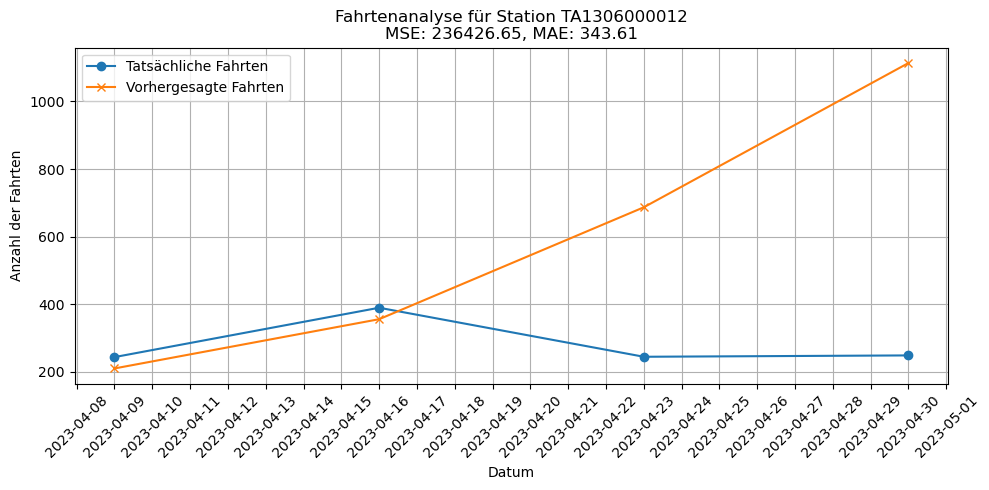

15:54:16 - cmdstanpy - INFO - Chain [1] start processing
15:54:16 - cmdstanpy - INFO - Chain [1] done processing


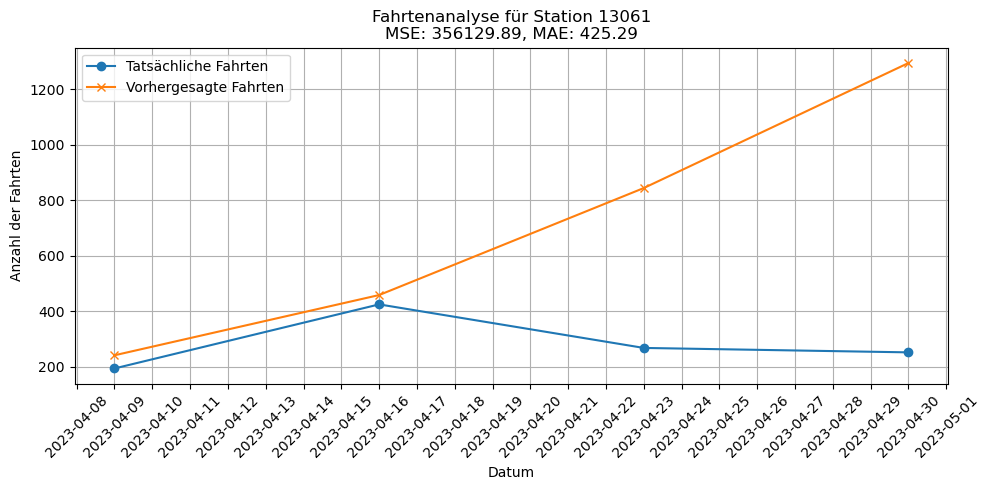

15:54:17 - cmdstanpy - INFO - Chain [1] start processing
15:54:17 - cmdstanpy - INFO - Chain [1] done processing


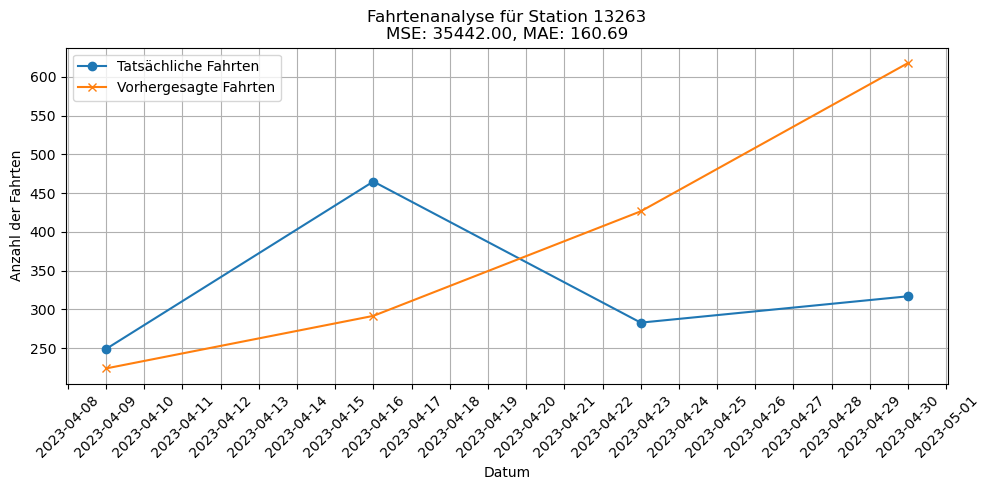

15:54:18 - cmdstanpy - INFO - Chain [1] start processing
15:54:18 - cmdstanpy - INFO - Chain [1] done processing


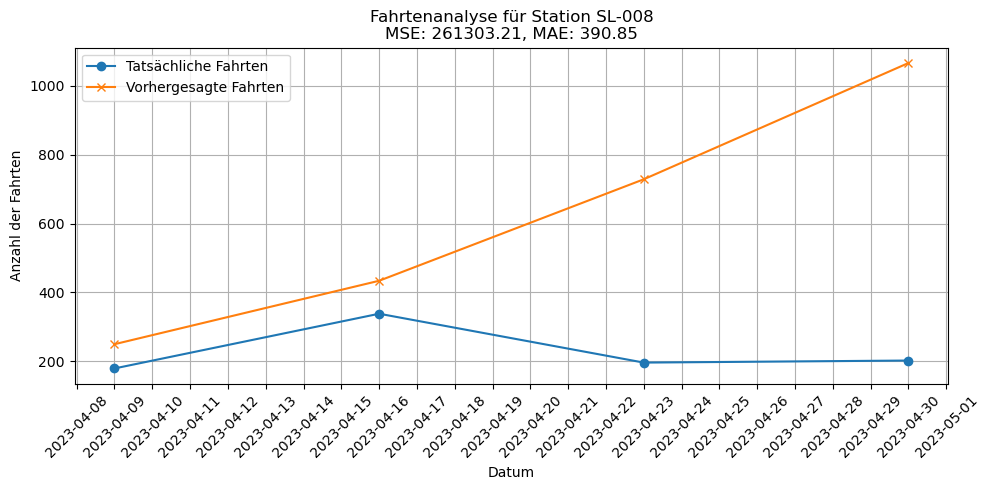

In [75]:
df.reset_index(inplace=True)

# Daten vorbereiten (Annahme: df ist bereits definiert und geladen)
df['started_at'] = pd.to_datetime(df['started_at'])
df.set_index('started_at', inplace=True)

# Aggregation der Daten auf Wochenbasis und Berechnung der Fahrtanzahl für Modelltraining
station_forecasts = {}
evaluation_results = {}

for station_id in important_station_ids:
    station_data = df[df['start_station_id'] == station_id]
    weekly_data = station_data.resample('W').count()['ride_id'].reset_index(name='y')
    weekly_data.rename(columns={'started_at': 'ds'}, inplace=True)
    
    test_size = 4  # Letzte 4 Wochen als Testdaten
    if len(weekly_data) >= test_size + 1:
        train_data = weekly_data[:-test_size]
        test_data = weekly_data[-test_size:]

        # Prophet-Modell
        model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
        model.fit(train_data[['ds', 'y']])

        future = model.make_future_dataframe(periods=test_size, freq='W')
        forecast = model.predict(future)
        forecast['yhat'] = forecast['yhat'].clip(lower=0)

        station_forecasts[station_id] = forecast

        # Berechnung der Fehlermetriken
        actuals = test_data['y']
        predictions = forecast['yhat'][-test_size:]
        mse = mean_squared_error(actuals, predictions)
        mae = mean_absolute_error(actuals, predictions)
        evaluation_results[station_id] = {'MSE': mse, 'MAE': mae}

        # Plotten der tatsächlichen und vorhergesagten Daten
        plt.figure(figsize=(10, 5))
        plt.plot(test_data['ds'], actuals, label='Tatsächliche Fahrten', marker='o')
        plt.plot(test_data['ds'], predictions, label='Vorhergesagte Fahrten', marker='x')

        plt.title(f'Fahrtenanalyse für Station {station_id}\nMSE: {mse:.2f}, MAE: {mae:.2f}')
        plt.xlabel('Datum')
        plt.ylabel('Anzahl der Fahrten')
        plt.xticks(rotation=45)
        plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.show()
    else:
        print(f"Nicht genügend Daten für Station {station_id} zur Analyse vorhanden.")


In [71]:
test_data

,ds,y
49,2023-04-09,179
50,2023-04-16,338
51,2023-04-23,196
52,2023-04-30,202


In [69]:
# Annahme: Du hast bereits eine Station-ID und den entsprechenden DataFrame
station_id = important_station_ids[0]  # Ersetze 0 durch den Index einer spezifischen Station
# Filtere die Testdaten für diese Station und die letzte Woche
test_week = test_data[test_data['start_station_id'] == station_id]

# Vorhersagedaten für dieselbe Woche
forecast_week = forecast[forecast['ds'].isin(test_week['ds'])]

# Plotten
plt.figure(figsize=(10, 5))
plt.plot(test_week['ds'], test_week['y'], label='Tatsächliche Fahrten', marker='o')
plt.plot(forecast_week['ds'], forecast_week['yhat'], label='Vorhergesagte Fahrten', marker='x')

plt.title(f'Vergleich der tatsächlichen und vorhergesagten Fahrtenanzahl für Station {station_id}')
plt.xlabel('Datum und Uhrzeit')
plt.ylabel('Anzahl der Fahrten')
plt.xticks(rotation=45)
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=1))  # Jeden Tag markieren
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # Datumsformat
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()


KeyError: 'start_station_id'

In [68]:
print(test_data.columns)


Index(['ds', 'y'], dtype='object')


In [56]:
# Annahme: 'df' enthält alle notwendigen Daten
df['started_at'] = pd.to_datetime(df['started_at'])  # Stelle sicher, dass 'started_at' im richtigen Datumsformat ist
df.set_index('started_at', inplace=True)  # Setze 'started_at' als Index für einfaches Resampling

# Resample und zähle Fahrten stündlich
actual_hourly_data = df.resample('H').agg({'start_station_id': 'first', 'ride_id': 'count'})
actual_hourly_data.rename(columns={'ride_id': 'y'}, inplace=True)
actual_hourly_data.reset_index(inplace=True)

# Überprüfe den neuen DataFrame
print(actual_hourly_data.head())


KeyError: 'started_at'

In [18]:
# Erstellen des Demand Patterns für jedes Cluster
demand_patterns = {}
for cluster_id in df['cluster'].unique():
    cluster_data = df[df['cluster'] == cluster_id]
    hourly_counts = cluster_data.groupby(['weekday', 'hour']).size()
    total_rides = hourly_counts.sum()
    demand_pattern = hourly_counts / total_rides
    demand_patterns[cluster_id] = demand_pattern

In [20]:
# Vorbereitung der Daten
df['started_at'] = pd.to_datetime(df['started_at'])
df['hour'] = df['started_at'].dt.hour
df['weekday'] = df['started_at'].dt.dayofweek
df['weekday_hour'] = df['weekday'].astype(str) + "_" + df['hour'].astype(str).str.zfill(2)

# Erstellen des Demand Patterns für jedes Cluster
demand_patterns = {}
for cluster_id in df['cluster'].unique():
    cluster_data = df[df['cluster'] == cluster_id]
    hourly_counts = cluster_data.groupby(['weekday', 'hour']).size()
    total_rides = hourly_counts.sum()
    demand_pattern = hourly_counts / total_rides
    demand_patterns[cluster_id] = demand_pattern
# Prognose der Fahrtanzahl auf Wochenbasis nur für wichtige Stationen
station_forecasts = {}
for station_id in important_stations:
    station_data = df[df['start_station_id'] == station_id]
    weekly_data = station_data.resample('W', on='started_at').count()['ride_id'].reset_index(name='y')
    weekly_data.rename(columns={'started_at': 'ds'}, inplace=True)

    model = Prophet(yearly_seasonality=True, weekly_seasonality=True, daily_seasonality=True)
    model.fit(weekly_data[['ds', 'y']])

    future = model.make_future_dataframe(periods=4, freq='W')  # Prognose für die nächsten 4 Wochen
    forecast = model.predict(future)
    adjusted_forecast = forecast['yhat'][-4:].mean()  # Durchschnittswert der nächsten 4 Wochen
    station_forecasts[station_id] = adjusted_forecast

# Verwendung von Clusternachfragemustern zur detaillierten Prognose
detailed_forecasts = {}
for station_id, weekly_total_forecast in station_forecasts.items():
    cluster_id = df[df['start_station_id'] == station_id]['cluster'].iloc[0]
    demand_pattern = demand_patterns[cluster_id]

    detailed_station_forecast = {}
    for (weekday, hour), proportion in demand_pattern.items():
        forecast_value = weekly_total_forecast * proportion
        detailed_station_forecast[(weekday, hour)] = round(forecast_value)
    detailed_forecasts[station_id] = detailed_station_forecast

# Optional: Ausgabe der detaillierten Vorhersagen für jede Station
for station_id, forecasts in detailed_forecasts.items():
    print(f"Vorhersagen für Station {station_id}:")
    for time_slot, value in forecasts.items():
        print(f"  Zeitfenster {time_slot}: {value} Fahrten")


11:44:24 - cmdstanpy - INFO - Chain [1] start processing
11:44:25 - cmdstanpy - INFO - Chain [1] done processing
11:44:25 - cmdstanpy - INFO - Chain [1] start processing
11:44:25 - cmdstanpy - INFO - Chain [1] done processing
11:44:25 - cmdstanpy - INFO - Chain [1] start processing
11:44:25 - cmdstanpy - INFO - Chain [1] done processing
11:44:25 - cmdstanpy - INFO - Chain [1] start processing
11:44:26 - cmdstanpy - INFO - Chain [1] done processing
11:44:26 - cmdstanpy - INFO - Chain [1] start processing
11:44:26 - cmdstanpy - INFO - Chain [1] done processing
11:44:26 - cmdstanpy - INFO - Chain [1] start processing
11:44:26 - cmdstanpy - INFO - Chain [1] done processing
11:44:26 - cmdstanpy - INFO - Chain [1] start processing
11:44:27 - cmdstanpy - INFO - Chain [1] done processing
11:44:27 - cmdstanpy - INFO - Chain [1] start processing
11:44:27 - cmdstanpy - INFO - Chain [1] done processing
11:44:27 - cmdstanpy - INFO - Chain [1] start processing
11:44:27 - cmdstanpy - INFO - Chain [1]

Vorhersagen für Station WL-012:
  Zeitfenster (0, 0): 1 Fahrten
  Zeitfenster (0, 1): 1 Fahrten
  Zeitfenster (0, 2): 0 Fahrten
  Zeitfenster (0, 3): 0 Fahrten
  Zeitfenster (0, 4): 0 Fahrten
  Zeitfenster (0, 5): 1 Fahrten
  Zeitfenster (0, 6): 3 Fahrten
  Zeitfenster (0, 7): 5 Fahrten
  Zeitfenster (0, 8): 7 Fahrten
  Zeitfenster (0, 9): 5 Fahrten
  Zeitfenster (0, 10): 4 Fahrten
  Zeitfenster (0, 11): 6 Fahrten
  Zeitfenster (0, 12): 7 Fahrten
  Zeitfenster (0, 13): 7 Fahrten
  Zeitfenster (0, 14): 8 Fahrten
  Zeitfenster (0, 15): 11 Fahrten
  Zeitfenster (0, 16): 19 Fahrten
  Zeitfenster (0, 17): 21 Fahrten
  Zeitfenster (0, 18): 10 Fahrten
  Zeitfenster (0, 19): 6 Fahrten
  Zeitfenster (0, 20): 4 Fahrten
  Zeitfenster (0, 21): 3 Fahrten
  Zeitfenster (0, 22): 2 Fahrten
  Zeitfenster (0, 23): 1 Fahrten
  Zeitfenster (1, 0): 1 Fahrten
  Zeitfenster (1, 1): 0 Fahrten
  Zeitfenster (1, 2): 0 Fahrten
  Zeitfenster (1, 3): 0 Fahrten
  Zeitfenster (1, 4): 0 Fahrten
  Zeitfenster (1, 5): 

In [22]:
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error

actual_df= df
# Angenommen, `actual_df` enthält die tatsächlichen Daten mit den Spalten 'start_station_id', 'started_at', 'ride_id'
actual_df['started_at'] = pd.to_datetime(actual_df['started_at'])
actual_df['hour'] = actual_df['started_at'].dt.hour
actual_df['weekday'] = actual_df['started_at'].dt.dayofweek
actual_df['weekday_hour'] = actual_df['weekday'].astype(str) + "_" + actual_df['hour'].astype(str).str.zfill(2)

# Aggregation der echten Daten auf Wochenbasis, Wochentag und Stunde
actual_weekly = actual_df.groupby(['start_station_id', 'weekday', 'hour']).count()['ride_id'].reset_index()
actual_weekly.rename(columns={'ride_id': 'actual_count'}, inplace=True)

# Berechnung der Vorhersagefehler für jede Station
errors = {}
for station_id, forecasts in detailed_forecasts.items():
    station_actual = actual_weekly[actual_weekly['start_station_id'] == station_id]
    station_actual['weekday_hour'] = station_actual['weekday'].astype(str) + "_" + station_actual['hour'].astype(str).str.zfill(2)

    forecasted_values = [forecasts.get((row['weekday'], row['hour']), 0) for index, row in station_actual.iterrows()]
    actual_values = station_actual['actual_count'].tolist()

    mse = mean_squared_error(actual_values, forecasted_values)
    mae = mean_absolute_error(actual_values, forecasted_values)
    errors[station_id] = {'MSE': mse, 'MAE': mae}

# Ausgabe der Fehlermetriken für jede Station
for station_id, metrics in errors.items():
    print(f"Station {station_id} - MSE: {metrics['MSE']}, MAE: {metrics['MAE']}")


/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_44968/1863720464.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_actual['weekday_hour'] = station_actual['weekday'].astype(str) + "_" + station_actual['hour'].astype(str).str.zfill(2)
/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_44968/1863720464.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_actual['weekday_hour'] = station_actual['weekday'].astype(str) + "_" + station_actual['hour'].astype(str).str.zfill(2)


Station WL-012 - MSE: 56172.8, MAE: 130.89032258064515
Station 13016 - MSE: 32559.682926829268, MAE: 119.3048780487805
Station 13001 - MSE: 23177.54491017964, MAE: 113.23353293413173
Station 13430 - MSE: 20550.79761904762, MAE: 109.39285714285714
Station 13011 - MSE: 38373.59493670886, MAE: 114.62025316455696
Station TA1305000011 - MSE: 20034.92121212121, MAE: 106.81212121212121
Station TA1307000151 - MSE: 19272.5, MAE: 103.85714285714286
Station 15544 - MSE: 44715.42675159236, MAE: 136.70063694267515
Station 13022 - MSE: 308252.61963190185, MAE: 383.46625766871165
Station 13300 - MSE: 99062.24691358025, MAE: 215.19753086419752
Station 13042 - MSE: 80714.375, MAE: 200.8154761904762
Station LF-005 - MSE: 94232.70731707317, MAE: 206.390243902439
Station TA1308000050 - MSE: 47356.53571428572, MAE: 171.04761904761904
Station TA1308000001 - MSE: 64558.83233532934, MAE: 169.70658682634732
Station 13008 - MSE: 53922.189024390245, MAE: 170.54268292682926
Station TA1307000039 - MSE: 37309.72619

/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_44968/1863720464.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_actual['weekday_hour'] = station_actual['weekday'].astype(str) + "_" + station_actual['hour'].astype(str).str.zfill(2)
/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_44968/1863720464.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  station_actual['weekday_hour'] = station_actual['weekday'].astype(str) + "_" + station_actual['hour'].astype(str).str.zfill(2)


/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_44968/88623589.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  week_data['hour'] = week_data['started_at'].dt.hour
/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_44968/88623589.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  week_data['weekday'] = week_data['started_at'].dt.dayofweek
/var/folders/y8/j3l3spt14jd5q6r19v3l8_800000gn/T/ipykernel_44968/88623589.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of

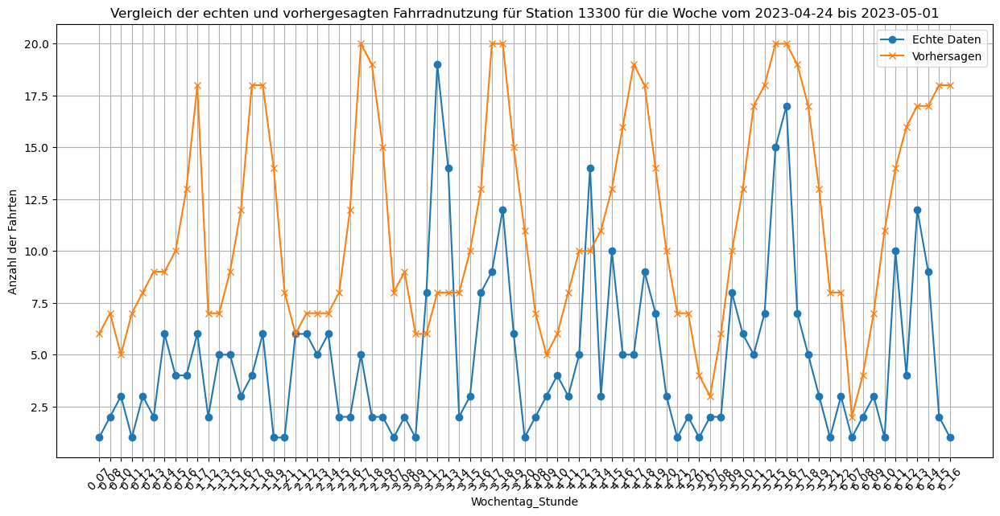

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

# Festlegen des Datumsbereichs für eine spezifische Woche
start_date = '2023-04-24'
end_date = '2023-05-01'

# Filtern der Daten auf diese spezifische Woche
actual_df['started_at'] = pd.to_datetime(actual_df['started_at'])
week_data = actual_df[(actual_df['started_at'] >= start_date) & (actual_df['started_at'] <= end_date)]

week_data['hour'] = week_data['started_at'].dt.hour
week_data['weekday'] = week_data['started_at'].dt.dayofweek
week_data['weekday_hour'] = week_data['weekday'].astype(str) + "_" + week_data['hour'].astype(str).apply(lambda x: x.zfill(2))

# Aggregation der Daten für diese spezifische Woche
actual_weekly = week_data.groupby(['start_station_id', 'weekday_hour']).count()['ride_id'].reset_index()
actual_weekly.rename(columns={'ride_id': 'actual_count'}, inplace=True)

# Angenommen, 'detailed_forecasts' enthält die Vorhersagen für die Woche
# Daten für eine spezifische Station extrahieren
station_id = '13300'  # Beispiel-Station-ID
station_forecast = detailed_forecasts[station_id]
station_actual = actual_weekly[actual_weekly['start_station_id'] == station_id]

# Umformen der Vorhersagedaten in DataFrame
forecast_df = pd.DataFrame([
    {'weekday_hour': f"{weekday}_{str(hour).zfill(2)}", 'forecast_count': forecast}
    for (weekday, hour), forecast in station_forecast.items()
])

# Zusammenführen der Vorhersage- und echten Daten
comparison_df = pd.merge(station_actual, forecast_df, on='weekday_hour', how='left')

# Plotting
plt.figure(figsize=(15, 7))
plt.plot(comparison_df['weekday_hour'], comparison_df['actual_count'], label='Echte Daten', marker='o')
plt.plot(comparison_df['weekday_hour'], comparison_df['forecast_count'], label='Vorhersagen', marker='x')
plt.title(f"Vergleich der echten und vorhergesagten Fahrradnutzung für Station {station_id} für die Woche vom {start_date} bis {end_date}")
plt.xlabel('Wochentag_Stunde')
plt.ylabel('Anzahl der Fahrten')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.show()
